In [81]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import math

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno
from scipy.special import boxcox1p, inv_boxcox1p
from sklearn.decomposition import PCA

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.metrics import r2_score, mean_squared_log_error, mean_squared_error, mean_absolute_error
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from ray.tune.sklearn import TuneSearchCV
from pickle import dump,load

# Data Exploration

In [2]:
dftrain_label = pd.read_csv('data/dengue_labels_train.csv')
dftrain_feat = pd.read_csv('data/dengue_features_train.csv')

In [3]:
dftrain_feat.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [4]:
dftrain_feat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

In [5]:
dftrain_label.head()

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6


In [6]:
#Merging train data: labels and samples
dftrain = dftrain_feat.merge(dftrain_label,how='inner',on=['city','year','weekofyear'])
dftrain.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


In [7]:
dftrain_sj = dftrain[dftrain.city == 'sj']
dftrain_iq = dftrain[dftrain.city == 'iq']

In [8]:
dftrain_sj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 0 to 935
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   936 non-null    object 
 1   year                                   936 non-null    int64  
 2   weekofyear                             936 non-null    int64  
 3   week_start_date                        936 non-null    object 
 4   ndvi_ne                                745 non-null    float64
 5   ndvi_nw                                887 non-null    float64
 6   ndvi_se                                917 non-null    float64
 7   ndvi_sw                                917 non-null    float64
 8   precipitation_amt_mm                   927 non-null    float64
 9   reanalysis_air_temp_k                  930 non-null    float64
 10  reanalysis_avg_temp_k                  930 non-null    float64
 11  reanal

In [9]:
dftrain_iq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 520 entries, 936 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   520 non-null    object 
 1   year                                   520 non-null    int64  
 2   weekofyear                             520 non-null    int64  
 3   week_start_date                        520 non-null    object 
 4   ndvi_ne                                517 non-null    float64
 5   ndvi_nw                                517 non-null    float64
 6   ndvi_se                                517 non-null    float64
 7   ndvi_sw                                517 non-null    float64
 8   precipitation_amt_mm                   516 non-null    float64
 9   reanalysis_air_temp_k                  516 non-null    float64
 10  reanalysis_avg_temp_k                  516 non-null    float64
 11  rea

<AxesSubplot:>

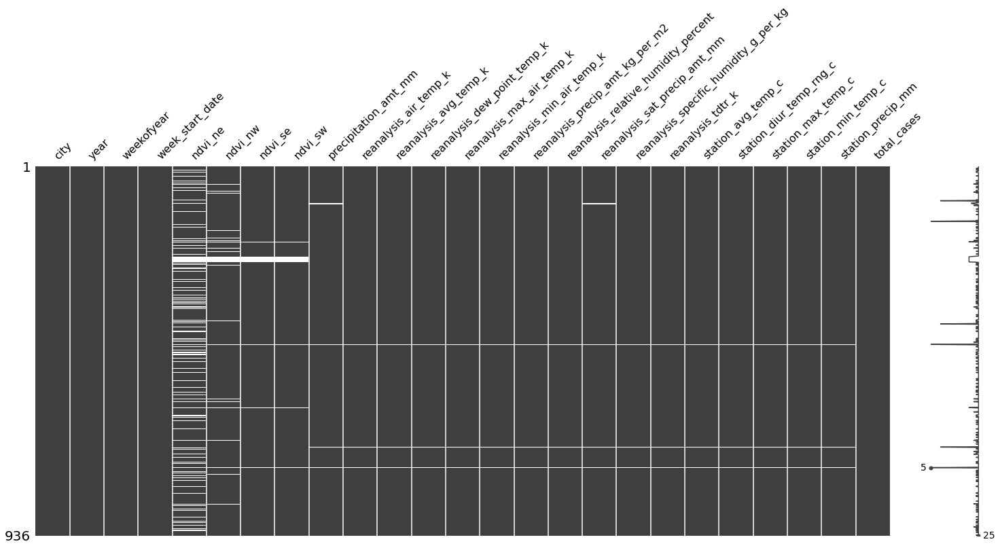

In [10]:
msno.matrix(dftrain_sj)

<AxesSubplot:>

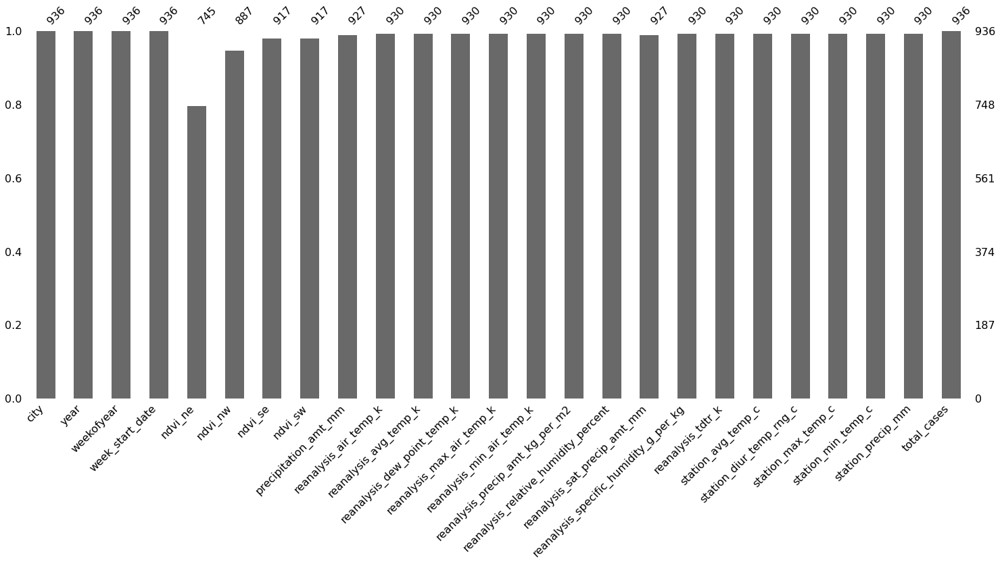

In [11]:
msno.bar(dftrain_sj)

<AxesSubplot:>

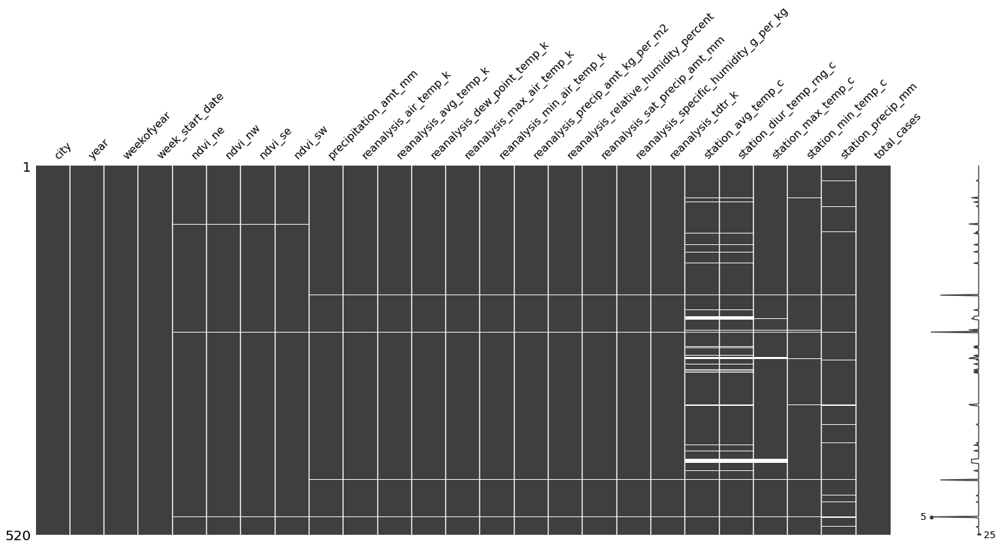

In [12]:
msno.matrix(dftrain_iq)

<AxesSubplot:>

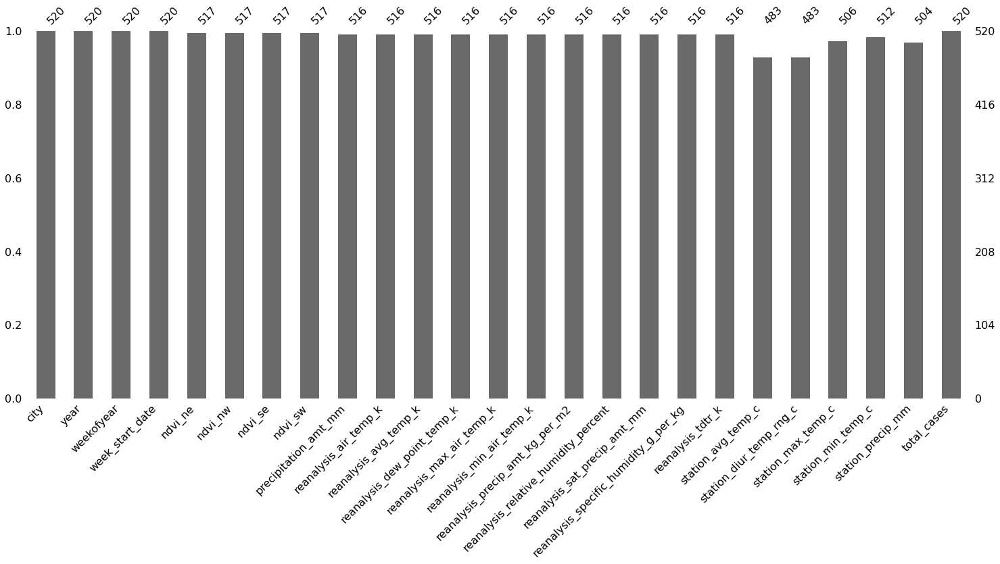

In [13]:
msno.bar(dftrain_iq)

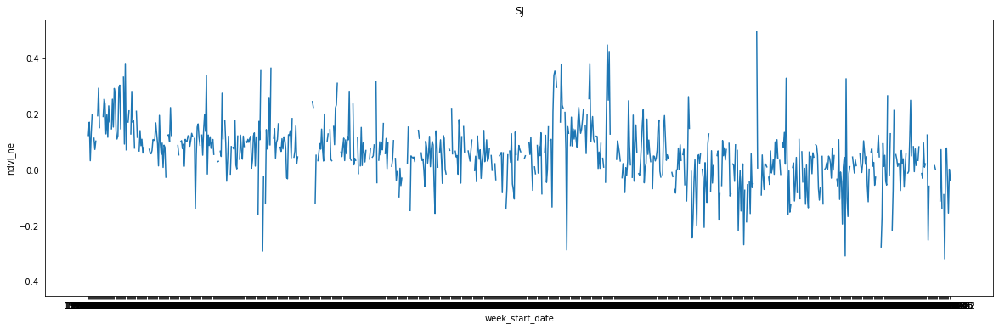

In [14]:
plt.figure(figsize=(20, 6))
plt.plot(dftrain_sj.week_start_date, dftrain_sj.ndvi_ne)
plt.title("SJ")
plt.xlabel("week_start_date")
plt.ylabel("ndvi_ne")
plt.show()

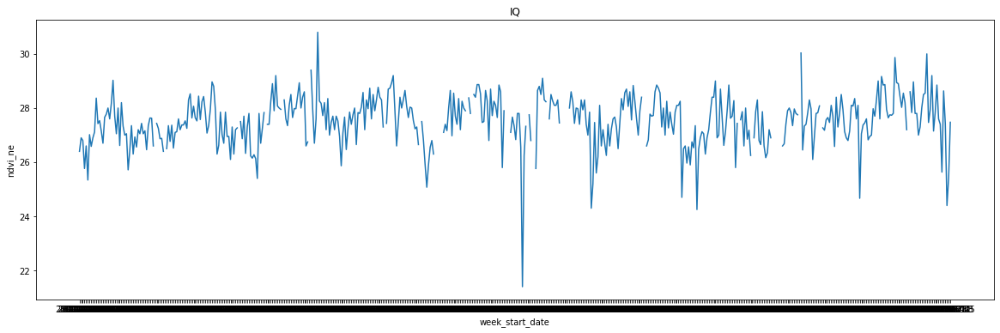

In [15]:
plt.figure(figsize=(20, 6))
plt.plot(dftrain_iq.week_start_date, dftrain_iq.station_avg_temp_c)
plt.title("IQ")
plt.xlabel("week_start_date")
plt.ylabel("ndvi_ne")
plt.show()

# Analysis of Missing Values

In any dataset, understanding the nature of missing values is crucial. The types of missingness can be categorized as:

 - MCAR (Missing Completely At Random): Values are missing arbitrarily.
 - MNAR (Missing Not At Random): Missingness depends on unobserved data or the probability of missingness is the same for   certain groups.
 - MAR (Missing At Random): The probability of an observation being missing is not related to the missing data, but it is related to some of the observed data.
 
Based on our examination using the Missingno visualizations, the data suggests that the missing values may not be MCAR. This is inferred from the observation that the data has missing values clustered during specific time periods.

## Imputation Methods

Choosing the right method to fill in missing values is paramount to achieving accurate predictions. We can consider the following techniques:

 - Forward and Backward Fill: Use the previous or next observed value to fill the gap.
 - Interpolation: Estimate values between two known values.
 - Correlation-based Imputation: Find features that are correlated and use them as a basis for filling in missing data.
 - Predictive Modeling: Use machine learning models to predict and fill in the missing values.
 
In our current analysis, we will evaluate the efficiency of the first two methods.

In [16]:
numerical_cols = dftrain.select_dtypes(include=['number']).columns.tolist()
numerical_cols.remove('weekofyear')
dftrain_sj[numerical_cols].corr()

,year,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
year,1.000000,-0.392312,-0.498367,-0.014863,-0.077928,0.031612,0.185813,0.189696,0.015428,0.177772,...,-0.286206,0.031612,0.018129,0.325336,-0.097312,-0.276963,-0.172907,-0.002097,0.082920,-0.212690
ndvi_ne,-0.392312,1.000000,0.673037,0.234049,0.177792,-0.048727,-0.073170,-0.071176,-0.040008,-0.044553,...,0.039138,-0.048727,-0.035235,-0.009248,0.064027,0.142875,0.092365,0.018818,-0.085993,0.037639
ndvi_nw,-0.498367,0.673037,1.000000,0.196343,0.214615,-0.032351,-0.077457,-0.076375,-0.026070,-0.046189,...,0.077339,-0.032351,-0.020595,-0.050657,0.087298,0.184124,0.136659,0.016428,-0.076237,0.075307
ndvi_se,-0.014863,0.234049,0.196343,1.000000,0.821354,-0.119386,-0.014601,-0.011905,-0.062773,-0.007382,...,-0.114294,-0.119386,-0.058442,0.029358,-0.056545,0.018121,-0.063718,-0.069275,-0.140286,0.001113
ndvi_sw,-0.077928,0.177792,0.214615,0.821354,1.000000,-0.118752,-0.043488,-0.035999,-0.087787,-0.014890,...,-0.118769,-0.118752,-0.080840,0.052465,-0.041495,0.069843,-0.017866,-0.074045,-0.175239,-0.000333
precipitation_amt_mm,0.031612,-0.048727,-0.032351,-0.119386,-0.118752,1.000000,0.233912,0.222311,0.402744,0.256677,...,0.501149,1.000000,0.410019,-0.093928,0.196218,-0.158479,0.193713,0.224667,0.565961,0.060211
reanalysis_air_temp_k,0.185813,-0.073170,-0.077457,-0.014601,-0.043488,0.233912,1.000000,0.997495,0.903287,0.935089,...,0.299139,0.233912,0.904819,0.175060,0.880931,0.039391,0.697949,0.832863,0.113726,0.181917
reanalysis_avg_temp_k,0.189696,-0.071176,-0.076375,-0.011905,-0.035999,0.222311,0.997495,1.000000,0.895123,0.938952,...,0.285179,0.222311,0.896178,0.198187,0.879129,0.053967,0.703316,0.827112,0.097849,0.175267
reanalysis_dew_point_temp_k,0.015428,-0.040008,-0.026070,-0.062773,-0.087787,0.402744,0.903287,0.895123,1.000000,0.847236,...,0.679369,0.402744,0.998532,-0.035965,0.868930,-0.056715,0.689811,0.850157,0.285280,0.203774
reanalysis_max_air_temp_k,0.177772,-0.044553,-0.046189,-0.007382,-0.014890,0.256677,0.935089,0.938952,0.847236,1.000000,...,0.288485,0.256677,0.853216,0.350008,0.852529,0.113533,0.760859,0.770742,0.104832,0.194532


In [17]:
dftrain_sj.corrwith(dftrain_sj['total_cases']).sort_values(ascending=False)

total_cases                              1.000000
weekofyear                               0.287134
reanalysis_specific_humidity_g_per_kg    0.207947
reanalysis_dew_point_temp_k              0.203774
station_avg_temp_c                       0.196617
reanalysis_max_air_temp_k                0.194532
station_max_temp_c                       0.189901
reanalysis_min_air_temp_k                0.187943
reanalysis_air_temp_k                    0.181917
station_min_temp_c                       0.177012
reanalysis_avg_temp_k                    0.175267
reanalysis_relative_humidity_percent     0.144045
reanalysis_precip_amt_kg_per_m2          0.107457
ndvi_nw                                  0.075307
precipitation_amt_mm                     0.060211
reanalysis_sat_precip_amt_mm             0.060211
station_precip_mm                        0.051759
ndvi_ne                                  0.037639
station_diur_temp_rng_c                  0.034630
ndvi_se                                  0.001113


In [18]:
dftrain_iq[numerical_cols].corr()

,year,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
year,1.000000,-0.063628,0.030720,-0.071596,-0.017316,0.085287,0.023359,0.006082,0.318394,-0.156489,...,0.256166,0.085287,0.321922,-0.235968,0.082251,-0.104788,0.041432,0.128209,-0.027436,0.179451
ndvi_ne,-0.063628,1.000000,0.764407,0.767745,0.842784,-0.012388,0.152740,0.167468,-0.031796,0.211516,...,-0.134387,-0.012388,-0.031102,0.163886,0.107257,0.150664,0.142603,-0.015661,0.008736,0.020215
ndvi_nw,0.030720,0.764407,1.000000,0.644194,0.764829,-0.060257,0.152423,0.168796,-0.034734,0.203425,...,-0.133374,-0.060257,-0.030651,0.164950,0.120126,0.203723,0.156463,-0.098044,-0.013002,-0.009586
ndvi_se,-0.071596,0.767745,0.644194,1.000000,0.714577,-0.043946,0.196518,0.207895,-0.063731,0.260059,...,-0.190925,-0.043946,-0.061694,0.221019,0.113097,0.189040,0.166627,-0.061689,0.012081,-0.041067
ndvi_sw,-0.017316,0.842784,0.764829,0.714577,1.000000,-0.020351,0.163954,0.176197,-0.030800,0.226263,...,-0.140045,-0.020351,-0.027352,0.169364,0.112064,0.181032,0.175897,-0.063004,-0.005394,0.032999
precipitation_amt_mm,0.085287,-0.012388,-0.060257,-0.043946,-0.020351,1.000000,-0.048534,-0.054303,0.471734,-0.228346,...,0.431543,1.000000,0.468370,-0.378758,0.105683,-0.183141,-0.012054,0.306541,0.378766,0.090171
reanalysis_air_temp_k,0.023359,0.152740,0.152423,0.196518,0.163954,-0.048534,1.000000,0.973319,0.151199,0.752356,...,-0.547910,-0.048534,0.177794,0.552305,0.602617,0.505507,0.641230,0.243346,-0.126249,0.097098
reanalysis_avg_temp_k,0.006082,0.167468,0.168796,0.207895,0.176197,-0.054303,0.973319,1.000000,0.142334,0.783955,...,-0.540006,-0.054303,0.166097,0.601629,0.569821,0.505558,0.618017,0.214493,-0.130987,0.079872
reanalysis_dew_point_temp_k,0.318394,-0.031796,-0.034734,-0.063731,-0.030800,0.471734,0.151199,0.142334,1.000000,-0.253558,...,0.741762,0.471734,0.997775,-0.608600,0.327797,-0.263062,0.080237,0.617305,0.183165,0.230401
reanalysis_max_air_temp_k,-0.156489,0.211516,0.203425,0.260059,0.226263,-0.228346,0.752356,0.783955,-0.253558,1.000000,...,-0.726586,-0.228346,-0.235758,0.799293,0.370429,0.586800,0.585625,-0.090978,-0.197124,-0.056474


In [19]:
dftrain_iq.corrwith(dftrain_iq['total_cases']).sort_values(ascending=False)

total_cases                              1.000000
reanalysis_specific_humidity_g_per_kg    0.236476
reanalysis_dew_point_temp_k              0.230401
reanalysis_min_air_temp_k                0.214514
station_min_temp_c                       0.211702
year                                     0.179451
reanalysis_relative_humidity_percent     0.130083
station_avg_temp_c                       0.113070
reanalysis_precip_amt_kg_per_m2          0.101171
reanalysis_air_temp_k                    0.097098
reanalysis_sat_precip_amt_mm             0.090171
precipitation_amt_mm                     0.090171
reanalysis_avg_temp_k                    0.079872
station_max_temp_c                       0.075279
station_precip_mm                        0.042976
ndvi_sw                                  0.032999
ndvi_ne                                  0.020215
ndvi_nw                                 -0.009586
weekofyear                              -0.011850
ndvi_se                                 -0.041067


# Correlation Analysis of Features

In our dataset, different features showcase varying degrees of correlation with the dengue cases:

- Vegetation Variables: These appear to have no significant correlation with the dengue cases.
- Temperature, Humidity, and Dew Variables: These exhibit a moderate correlation with the dengue cases.

However, it's essential to note a significant presence of collinearity between some of these features.

## Upcoming Steps
Given the observed collinearity, we'll be employing feature selection techniques in the subsequent stages of our analysis to ensure the robustness of our predictive models.

In [20]:
numerical_cols.remove('year')

In [21]:
def skew_check(df,feature):
  print(feature + " " + "Skewness: %f" % df[feature].skew())
  print(feature + " " + "Kurtosis: %f" % df[feature].kurt())
    
for feat in numerical_cols:
    skew_check(dftrain_sj,feat)

ndvi_ne Skewness: -0.016905
ndvi_ne Kurtosis: 2.043667
ndvi_nw Skewness: -0.086188
ndvi_nw Kurtosis: 2.036564
ndvi_se Skewness: 0.215362
ndvi_se Kurtosis: 0.431881
ndvi_sw Skewness: 0.146345
ndvi_sw Kurtosis: 0.653120
precipitation_amt_mm Skewness: 2.618670
precipitation_amt_mm Kurtosis: 11.793943
reanalysis_air_temp_k Skewness: -0.217806
reanalysis_air_temp_k Kurtosis: -0.874799
reanalysis_avg_temp_k Skewness: -0.224387
reanalysis_avg_temp_k Kurtosis: -0.817326
reanalysis_dew_point_temp_k Skewness: -0.626015
reanalysis_dew_point_temp_k Kurtosis: -0.393726
reanalysis_max_air_temp_k Skewness: -0.158595
reanalysis_max_air_temp_k Kurtosis: -0.780402
reanalysis_min_air_temp_k Skewness: -0.537393
reanalysis_min_air_temp_k Kurtosis: -0.295083
reanalysis_precip_amt_kg_per_m2 Skewness: 5.568382
reanalysis_precip_amt_kg_per_m2 Kurtosis: 62.729650
reanalysis_relative_humidity_percent Skewness: -0.192060
reanalysis_relative_humidity_percent Kurtosis: -0.072789
reanalysis_sat_precip_amt_mm Skewnes

In [22]:
for feat in numerical_cols:
    skew_check(dftrain_iq,feat)

ndvi_ne Skewness: 0.225867
ndvi_ne Kurtosis: -0.318758
ndvi_nw Skewness: 0.235746
ndvi_nw Kurtosis: -0.480224
ndvi_se Skewness: 0.269462
ndvi_se Kurtosis: 0.035570
ndvi_sw Skewness: 0.271942
ndvi_sw Kurtosis: -0.167464
precipitation_amt_mm Skewness: 0.600853
precipitation_amt_mm Kurtosis: 0.425924
reanalysis_air_temp_k Skewness: 0.106242
reanalysis_air_temp_k Kurtosis: -0.015170
reanalysis_avg_temp_k Skewness: -0.108410
reanalysis_avg_temp_k Kurtosis: -0.192788
reanalysis_dew_point_temp_k Skewness: -0.888666
reanalysis_dew_point_temp_k Kurtosis: 0.612027
reanalysis_max_air_temp_k Skewness: 0.160038
reanalysis_max_air_temp_k Kurtosis: -0.475748
reanalysis_min_air_temp_k Skewness: -0.950305
reanalysis_min_air_temp_k Kurtosis: 0.984448
reanalysis_precip_amt_kg_per_m2 Skewness: 2.005837
reanalysis_precip_amt_kg_per_m2 Kurtosis: 5.678149
reanalysis_relative_humidity_percent Skewness: -1.105647
reanalysis_relative_humidity_percent Kurtosis: 0.818476
reanalysis_sat_precip_amt_mm Skewness: 0.6

<AxesSubplot:xlabel='total_cases', ylabel='Density'>

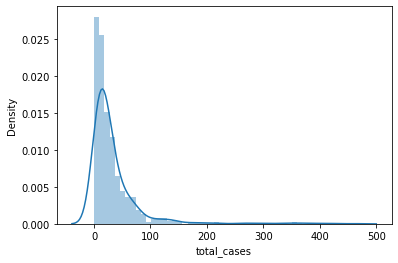

In [23]:
plt.figure()
sns.distplot(dftrain_sj.total_cases)

<AxesSubplot:xlabel='total_cases', ylabel='Density'>

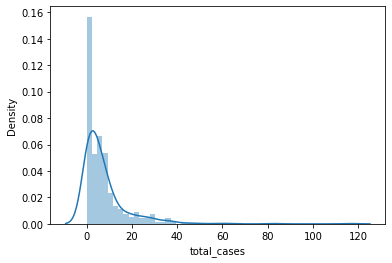

In [24]:
plt.figure()
sns.distplot(dftrain_iq.total_cases)

## Addressing Skewness in the 'Total Cases' Variable
Upon examining the distribution of the 'Total Cases' variable, it's evident that the data is not normally distributed. Specifically, it displays a right-skewed pattern.

To rectify this and enhance the robustness of our model, especially concerning outliers, we'll employ the Box-Cox transformation. This transformation is designed to stabilize variance and make the data more closely follow a normal distribution, thereby aiding in better model performance.

In [25]:
dftrain_sj[numerical_cols].describe()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,745.000000,887.000000,917.000000,917.000000,927.000000,930.000000,930.000000,930.000000,930.000000,930.000000,...,930.000000,927.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,930.000000,936.000000
mean,0.057925,0.067469,0.177655,0.165956,35.470809,299.163653,299.276920,295.109519,301.398817,297.301828,...,78.568181,35.470809,16.552409,2.516267,27.006528,6.757373,31.607957,22.600645,26.785484,34.180556
std,0.107153,0.092479,0.057166,0.056073,44.606137,1.236429,1.218637,1.569943,1.258927,1.294705,...,3.389488,44.606137,1.560923,0.498892,1.415473,0.835993,1.717297,1.506277,29.325811,51.381372
min,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,295.938571,296.114286,289.642857,297.800000,292.600000,...,66.735714,0.000000,11.715714,1.357143,22.842857,4.528571,26.700000,17.800000,0.000000,0.000000
25%,0.004500,0.016425,0.139283,0.129157,0.000000,298.195000,298.300000,293.847857,300.400000,296.300000,...,76.246071,0.000000,15.236429,2.157143,25.842857,6.200000,30.600000,21.700000,6.825000,9.000000
50%,0.057700,0.068075,0.177186,0.165971,20.800000,299.254286,299.378571,295.464286,301.500000,297.500000,...,78.667857,20.800000,16.845714,2.457143,27.228571,6.757143,31.700000,22.800000,17.750000,19.000000
75%,0.111100,0.115200,0.212557,0.202771,52.180000,300.132857,300.228571,296.418929,302.400000,298.400000,...,80.963214,52.180000,17.858571,2.800000,28.185714,7.285714,32.800000,23.900000,35.450000,37.000000
max,0.493400,0.437100,0.393129,0.381420,390.600000,302.200000,302.164286,297.795714,304.300000,299.900000,...,87.575714,390.600000,19.440000,4.428571,30.071429,9.914286,35.600000,25.600000,305.900000,461.000000


In [26]:
dftrain_iq[numerical_cols].describe()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,517.000000,517.000000,517.000000,517.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,...,516.000000,516.000000,516.000000,516.000000,483.000000,483.000000,506.000000,512.000000,504.000000,520.000000
mean,0.263869,0.238783,0.250126,0.266779,64.245736,297.869538,299.133043,295.492982,307.082752,292.866667,...,88.639117,64.245736,17.096110,9.206783,27.530933,10.566197,34.004545,21.196680,62.467262,7.565385
std,0.081370,0.076751,0.077354,0.086345,35.218995,1.170997,1.332073,1.417229,2.382980,1.663069,...,7.583889,35.218995,1.445769,2.448525,0.921769,1.535496,1.325261,1.260327,63.245958,10.765478
min,0.061729,0.035860,0.029880,0.064183,0.000000,294.635714,294.892857,290.088571,300.000000,286.900000,...,57.787143,0.000000,12.111429,3.714286,21.400000,5.200000,30.100000,14.700000,0.000000,0.000000
25%,0.200000,0.179540,0.194743,0.204129,39.105000,297.092500,298.221429,294.593929,305.200000,291.975000,...,84.295000,39.105000,16.102857,7.371429,27.000000,9.500000,33.200000,20.600000,17.200000,1.000000
50%,0.263643,0.232971,0.249800,0.262143,60.470000,297.822857,299.121429,295.852143,307.050000,293.050000,...,90.917143,60.470000,17.428571,8.964286,27.600000,10.625000,34.000000,21.300000,45.300000,5.000000
75%,0.319971,0.293929,0.302300,0.325150,85.757500,298.649286,300.123214,296.548571,308.700000,294.200000,...,94.563929,85.757500,18.180357,11.014286,28.100000,11.655000,34.900000,22.000000,85.950000,9.000000
max,0.508357,0.454429,0.538314,0.546017,210.830000,301.637143,302.928571,298.450000,314.000000,296.000000,...,98.610000,210.830000,20.461429,16.028571,30.800000,15.800000,42.200000,24.200000,543.300000,116.000000


In [27]:
dftrain_iq[dftrain_iq.precipitation_amt_mm != dftrain_iq.reanalysis_sat_precip_amt_mm]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1170,iq,2005,53,2005-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1430,iq,2010,53,2010-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [28]:
dftrain_sj[dftrain_sj.precipitation_amt_mm != dftrain_sj.reanalysis_sat_precip_amt_mm]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.12510,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
93,sj,1992,7,1992-02-12,NaN,0.130500,0.195743,0.178857,NaN,297.798571,...,82.875714,NaN,16.060000,2.200000,26.028571,6.571429,32.2,20.0,1.3,65
94,sj,1992,8,1992-02-19,NaN,0.184467,0.194614,0.203057,NaN,297.898571,...,77.295714,NaN,15.012857,2.585714,25.757143,7.385714,33.9,21.7,8.9,33
95,sj,1992,9,1992-02-26,0.10705,0.081500,0.165243,0.163057,NaN,297.472857,...,76.037143,NaN,14.381429,2.414286,25.285714,6.171429,29.4,21.7,16.0,38
139,sj,1993,53,1993-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30
399,sj,1998,1,1998-01-01,0.04550,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
451,sj,1999,53,1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59
711,sj,2004,1,2004-01-01,-0.26830,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
763,sj,2005,53,2005-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


In [29]:
dftrain_iq.drop(columns ='reanalysis_sat_precip_amt_mm', inplace = True)
dftrain_sj.drop(columns ='reanalysis_sat_precip_amt_mm', inplace = True)

In [30]:
# precipitation_amt_mm and reanalysis_sat_precip_amt_mm have the same values - remove one
numerical_cols.remove('reanalysis_sat_precip_amt_mm')

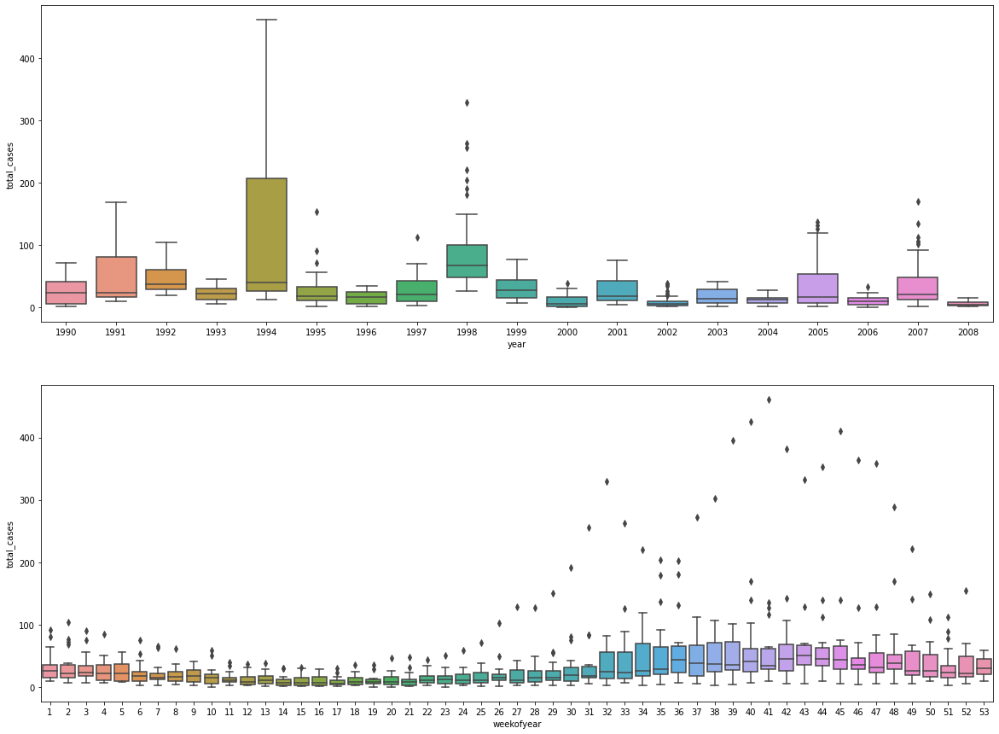

In [31]:
figure, axis = plt.subplots(2, 1,figsize=(20,15 ))
sns.boxplot(x=dftrain_sj['year'], y=dftrain_sj['total_cases'] , orient='v' , ax=axis[0])
sns.boxplot(x=dftrain_sj['weekofyear'], y=dftrain_sj['total_cases'], orient='v' , ax=axis[1])
plt.show() 

# Dengue Cases Trend Analysis

When we dive into the dataset, a couple of key observations come to light:

 - Seasonal Variations: There's a noticeable spike in the dengue cases during the winter weeks.

 - Geographical Insights:

    -- San Juan (SJ): We observe a decline in dengue cases in more recent years. The "years" variable will be utilized to model this trend, suggesting that improvements in technology or infrastructure might be influencing this pattern. For a more accurate representation, I plan to exclude data from San Juan up to the year 1994. However, the impact of this exclusion should be assessed by testing models both with and without these early years.

    -- Iquitos (IQ): Unlike SJ, Iquitos doesn't display a declining trend. Instead, the number of dengue cases either remains consistent or varies in a distinct manner. Notably, data from the years 2000 and 2001 appear to diverge from the overall trend, suggesting they might belong to a different distribution. As a result, these years will be removed from the training dataset.

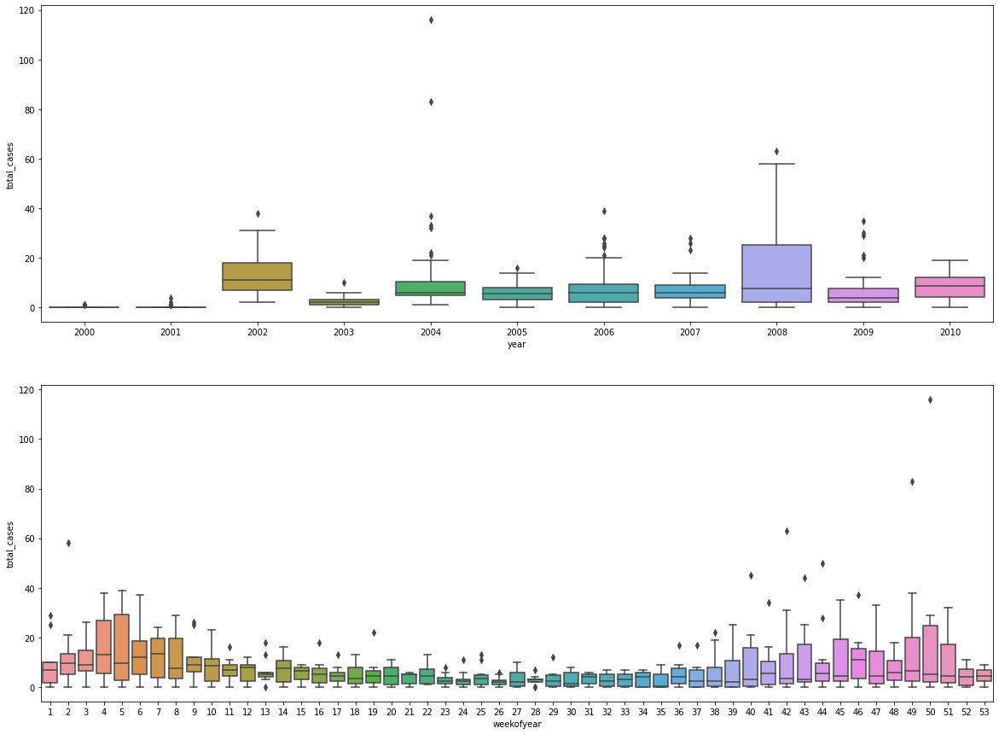

In [32]:
figure, axis = plt.subplots(2, 1,figsize=(20,15 ))
sns.boxplot(x=dftrain_iq['year'], y=dftrain_iq['total_cases'] , orient='v' , ax=axis[0])
sns.boxplot(x=dftrain_iq['weekofyear'], y=dftrain_iq['total_cases'], orient='v' , ax=axis[1])
plt.show() 

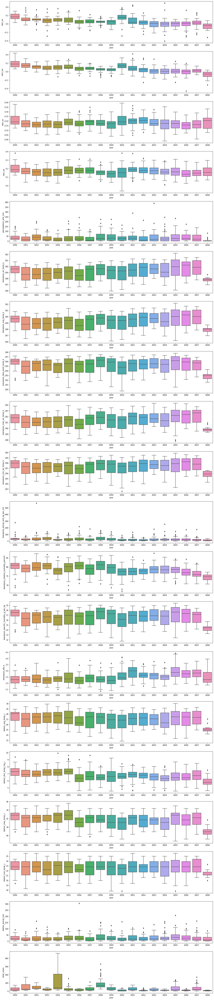

In [33]:
figure, axis = plt.subplots(20, 1,figsize=(20,100))
for i,x in enumerate(numerical_cols):
    sns.boxplot(x=dftrain_sj['year'], y=dftrain_sj[x], orient='v' , ax=axis[i])

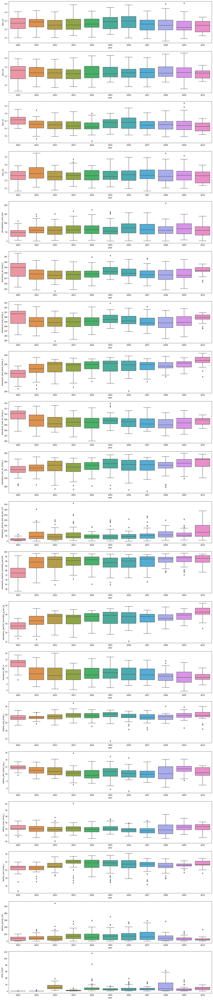

In [34]:
figure, axis = plt.subplots(20, 1,figsize=(20,100))
for i,x in enumerate(numerical_cols):
    sns.boxplot(x=dftrain_iq['year'], y=dftrain_iq[x], orient='v' , ax=axis[i])

# Data Cleaning/Preprocessing

As we dive into the dataset, several significant observations arise which will guide our preprocessing steps:

## Key Observations:
 - Correlations: Dengue cases show correlation with both precipitation and temperature variables.
 - Vegetation Analysis: There's no discernible correlation with dengue cases. As an optimization, we can generate a 'mean    vegetation' feature to encapsulate this information.
 - Trends in San Juan (SJ):
   There's a declining trend in dengue cases as the years progress.
   This decline doesn't seem to be explained by the available variables, hinting at possible external factors not captured in    the dataset.
 - Trends in Iquitos (IQ):
   The years 2000 and 2001 stand out with significantly fewer cases compared to the distribution of other years.
 - It's essential to evaluate the model's performance both with and without this data to understand its impact.

## Preprocessing Steps:
 - Imputation: Address missing data points in the dataset.
 - Target Transformation: Apply a Box-Cox transformation on the target variable. Given that the Mean Absolute Error (MAE) is  robust to outliers, our goal is to develop a model that equally stands strong against outlier influences.
 - Categorical Variables: Implement one-hot encoding for categorical variables.
 - Feature Engineering: Introduce a 'month' feature to capture potential monthly patterns in the data.


In [35]:
def CategoryPreprocess(df):
    #hard code cat cols
    
    df.week_start_date = pd.to_datetime(df.week_start_date)
    df['month'] = df.week_start_date.dt.month
    
    cat_cols = ['month','weekofyear']
    dftransform=pd.get_dummies(data=df, columns=cat_cols)
    
    return dftransform
    

In [36]:
def NumericalPreprocess(df):
    
    #hard code numerical cols
    numerical_cols = ['year','ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm']
    
    
    df[numerical_cols] = df[numerical_cols].interpolate(method='linear', limit_direction='both')
    df['ndvi_avg'] = (df['ndvi_ne'] + df['ndvi_nw'] + df['ndvi_se'] + df['ndvi_sw']) / 4
    
    df.total_cases = df.total_cases.astype('int') 
    
    
    return df  

In [37]:
def preprocess(df):
    
    #df.drop(columns = ['reanalysis_sat_precip_amt_mm'], inplace = True )
    dfcat = CategoryPreprocess(df)
    dftransform = NumericalPreprocess(dfcat)
    
    return dftransform
    
    

In [38]:
dftrain_sj_transform = preprocess(dftrain_sj)
dftrain_iq_transform = preprocess(dftrain_iq)

In [39]:
train_sj = dftrain_sj_transform[~dftrain_sj_transform.year.isin([2008,2007,2006,1990,1991,1992,1993,1994])]
validate_sj = dftrain_sj_transform[dftrain_sj_transform.year.isin([2008,2007,2006])]
train_iq = dftrain_iq_transform[~dftrain_iq_transform.year.isin([2010,2009,2000,2001])]
validate_iq = dftrain_iq_transform[dftrain_iq_transform.year.isin([2010,2009])]

train_sj.reset_index(drop = True,inplace=True)
validate_sj.reset_index(drop = True,inplace=True)
train_iq.reset_index(drop = True,inplace=True)
validate_iq.reset_index(drop = True,inplace=True)

# Model and feature selection

## SJ

In [43]:
def modeling_linear(train_x,validate_x,model):
    
    train = train_x.copy()
    validate = validate_x.copy()
    
    scaler = MinMaxScaler()
    scaler.fit(train[numerical_cols])
    train[numerical_cols] = scaler.transform(train[numerical_cols])

    validate[numerical_cols] = scaler.transform(validate[numerical_cols])
    
    model.fit(train.drop(columns = identity_cols ),train['total_cases'])
    
    important_cols = train.drop(columns = identity_cols ).columns[(model.coef_ != 0)]
    print(f"Selected features: {important_cols}")
    
    
    model.fit(train[important_cols],train['total_cases'])
    
    predict = model.predict(validate[important_cols])
    
    print(r2_score(validate.total_cases,predict))
    print(mean_absolute_error(validate.total_cases,predict))
    
    for alpha in np.arange(0.1, 1.0, 0.1):
        
        try:
            print(alpha)

            train = train_x.copy()
            validate = validate_x.copy()

            train['total_cases'] = boxcox1p(train['total_cases'],alpha)



            scaler = MinMaxScaler()
            scaler.fit(train[numerical_cols])
            train[numerical_cols] = scaler.transform(train[numerical_cols])

            validate[numerical_cols] = scaler.transform(validate[numerical_cols])

            model.fit(train.drop(columns = identity_cols ),train['total_cases'])


            important_cols = train.drop(columns = identity_cols ).columns[(model.coef_ != 0)]
            print(f"Selected features: {important_cols}")

            model.fit(train[important_cols],train['total_cases'])


            predict = model.predict(validate[important_cols])
            predict = inv_boxcox1p(predict,alpha)

            print(r2_score(validate.total_cases,predict))
            print(mean_absolute_error(validate.total_cases,predict))

            df = pd.DataFrame({
            'Real_val': validate.total_cases,
            'prediction': predict,
            'index': np.arange(1, len(predict)+1)})

            ax = df.plot(x='index', y=['Real_val', 'prediction'], kind='bar', figsize=(30, 10))
            ax.set_xlabel("Index")
            ax.set_ylabel("Count")
            plt.tight_layout()
            plt.show()
            
            
        except ValueError:
            continue

In [44]:
cat_cols = ['month','weekofyear']
identity_cols = ['city','week_start_date','total_cases']
numerical_cols = ['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm',
 'ndvi_avg']

0.1
Selected features: Index(['year', 'ndvi_ne', 'precipitation_amt_mm', 'reanalysis_max_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'month_1', 'month_2', 'month_3', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_12',
       'weekofyear_27', 'weekofyear_32', 'weekofyear_36', 'weekofyear_38',
       'weekofyear_40', 'weekofyear_42', 'weekofyear_52'],
      dtype='object')
0.1523276234199784
16.05693236680955
0.1
Selected features: Index(['year', 'month_4'], dtype='object')
-0.11851261818078829
15.296243290671036


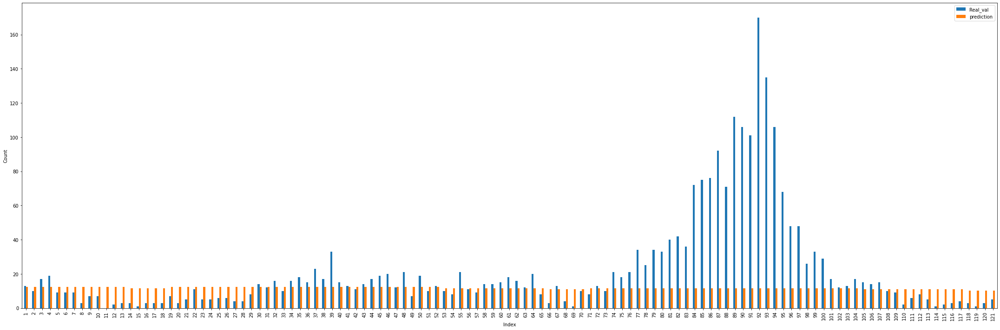

0.2
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_10'],
      dtype='object')
-0.08362418257763671
14.849851182876657


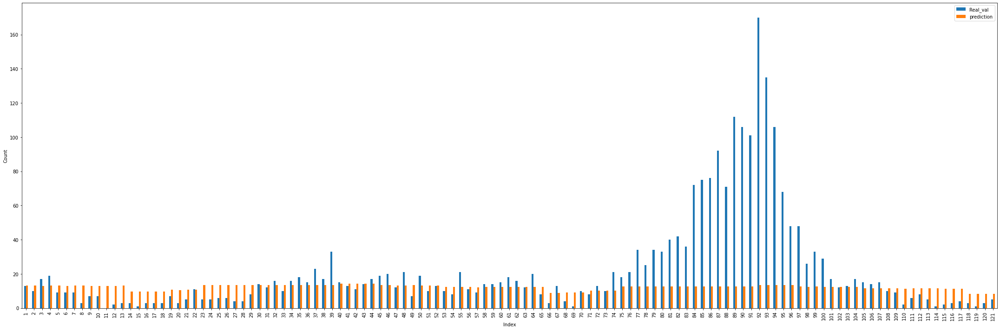

0.30000000000000004
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6', 'month_10'],
      dtype='object')
-0.028356464210084642
14.329051728967086


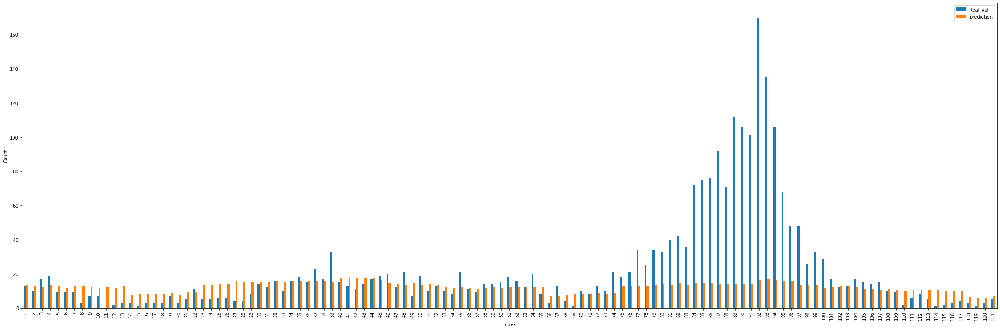

0.4
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_10', 'month_11'],
      dtype='object')
0.024247744195585397
13.995101725978524


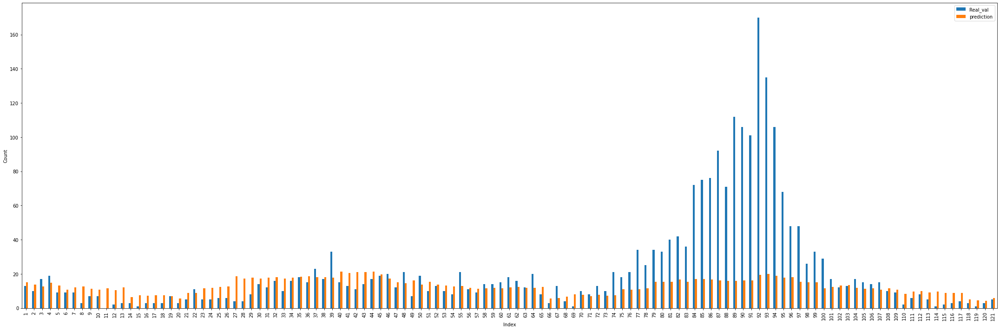

0.5
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_10', 'month_11'],
      dtype='object')
0.08644604423132562
13.67863437107173


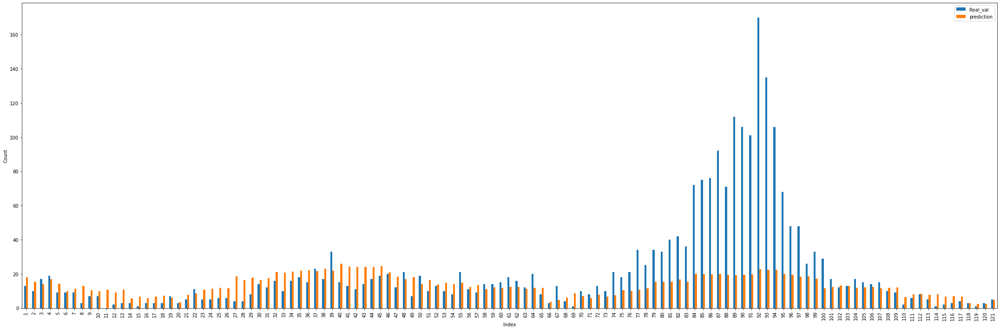

0.6
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_10', 'month_11'],
      dtype='object')
0.1370563695367013
13.587286104381624


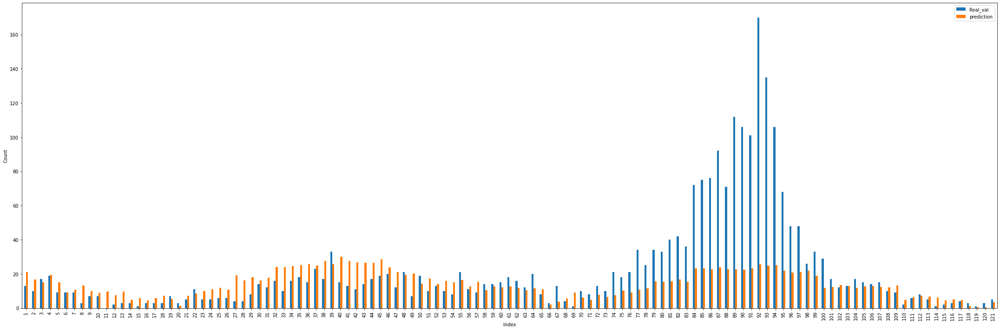

0.7000000000000001
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_10', 'month_11'],
      dtype='object')
0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'station_diur_temp_rng_c',
       'month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_9', 'month_10', 'month_11', 'month_12', 'ndvi_avg'],
      dtype='object')
0.9
Selected features: Index(['year', 'ndvi_ne', 'reanalysis_max_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'month_1', 'month_2', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_9', 'month_12', 'weekofyear_27',
       'weekofyear_38', 'wee

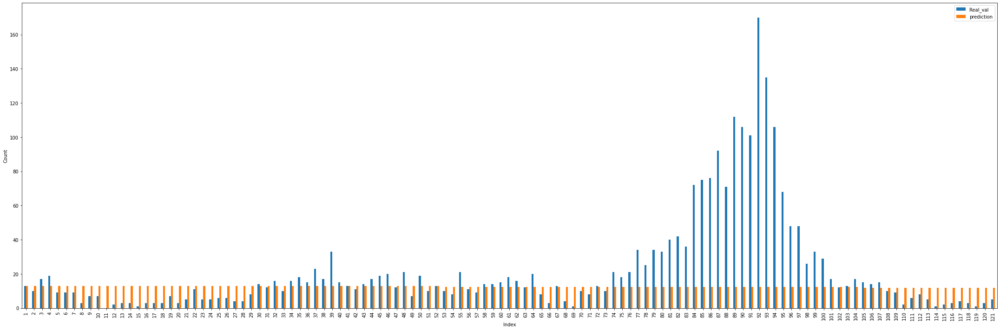

0.2
Selected features: Index(['year'], dtype='object')
-0.10075018467111874
15.355294494023578


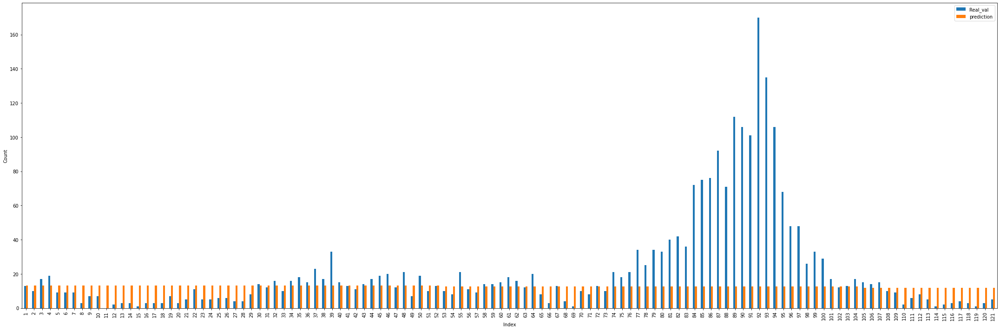

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.09407275836673978
15.368522460924831


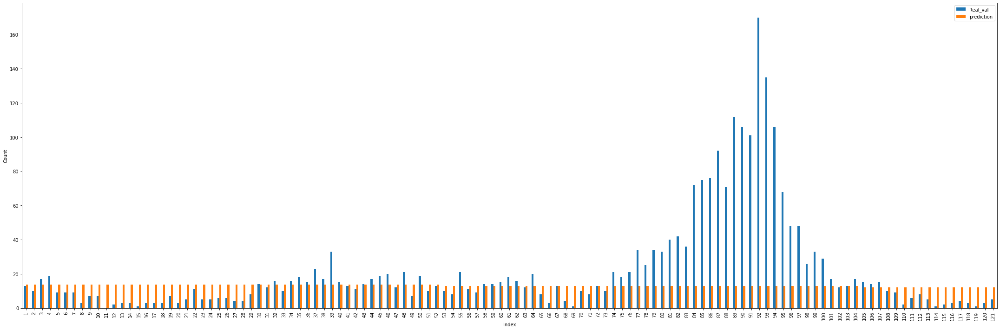

0.4
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5'], dtype='object')
-0.06241289354028323
14.949713941315084


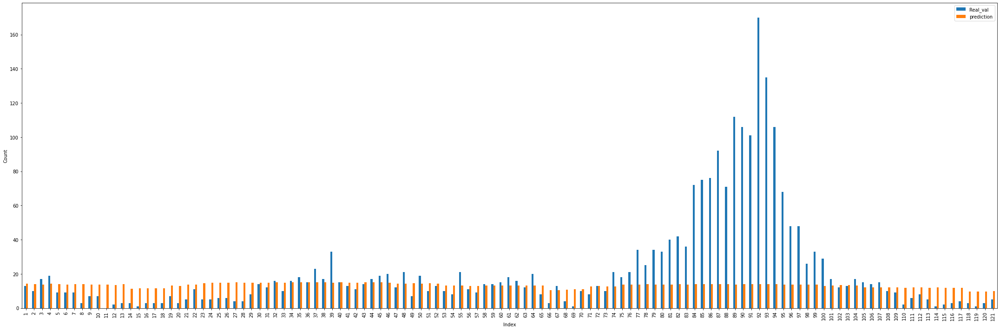

0.5
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6', 'month_10'],
      dtype='object')
0.0019238542254039759
14.318904050667804


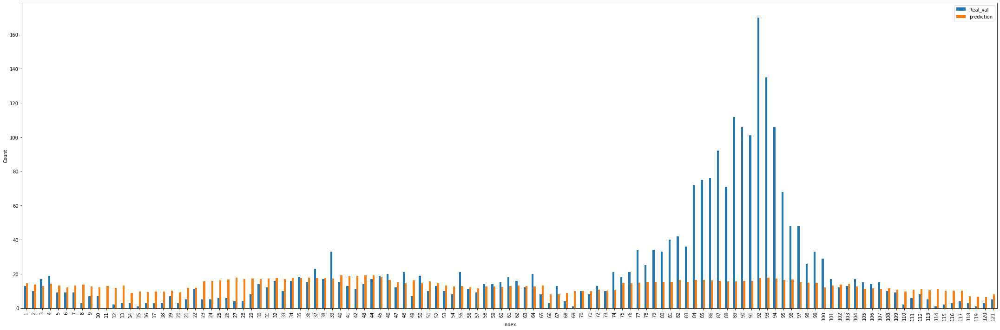

0.6
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_10'],
      dtype='object')
0.06503968886602551
13.937295793970712


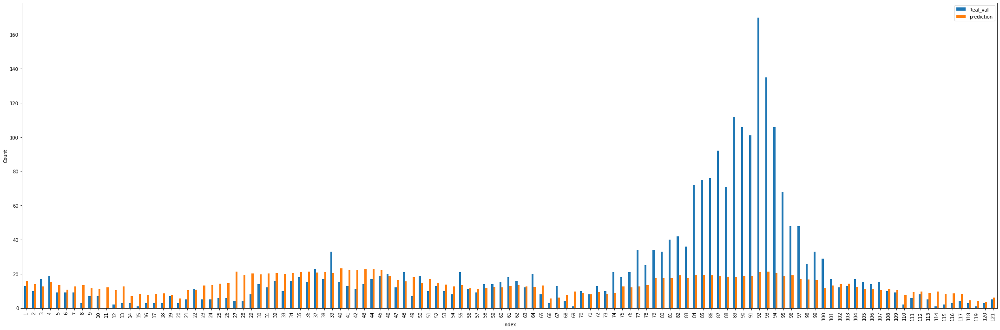

0.7000000000000001
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_10'],
      dtype='object')
0.1285309119964324
13.65341346287179


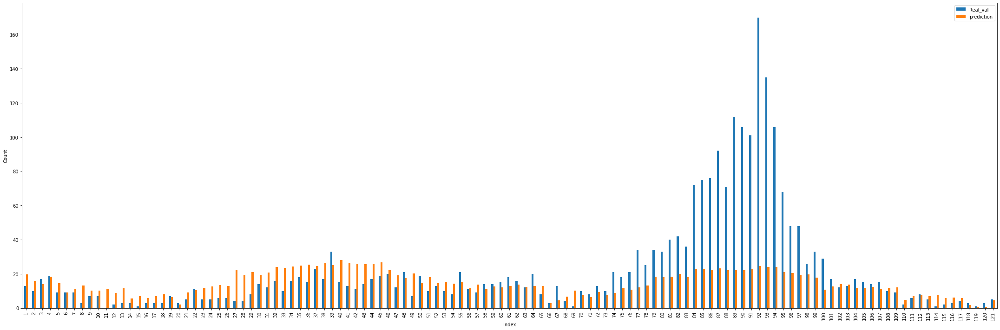

0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_10'],
      dtype='object')
0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'station_diur_temp_rng_c',
       'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8'],
      dtype='object')
0.30000000000000004
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_2',
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8'],
      dtype='object')
0.22035841089445118
14.413835084869119
0.1
Selected features: Index(['year'], dtype='object')
-0.0900119523873939
15.360216376876581


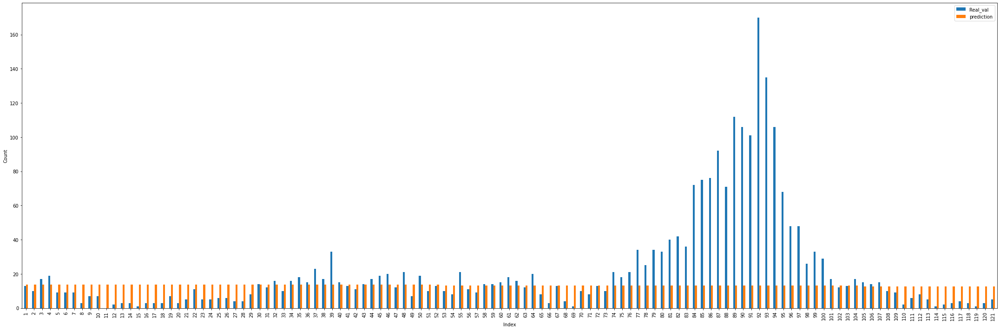

0.2
Selected features: Index(['year'], dtype='object')
-0.08874977608004819
15.371943037155491


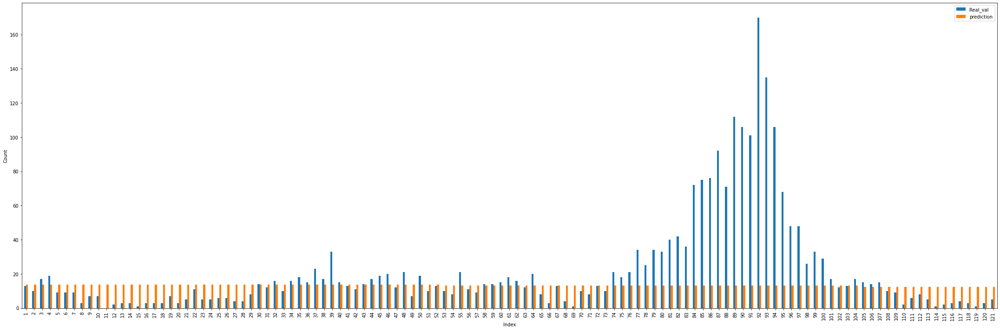

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.08501630850857245
15.395210075440259


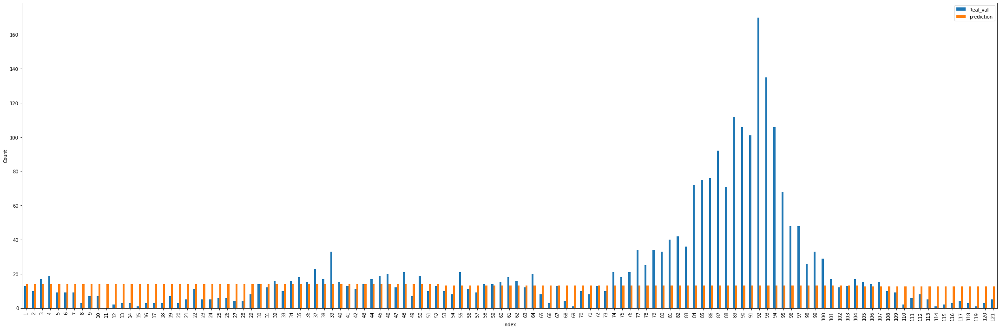

0.4
Selected features: Index(['year'], dtype='object')
-0.0793872344876021
15.436695842571725


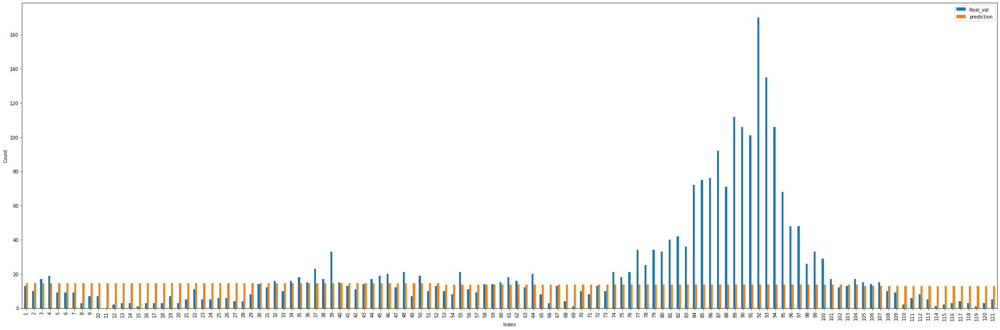

0.5
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4'], dtype='object')
-0.056575635386365786
15.201230298164264


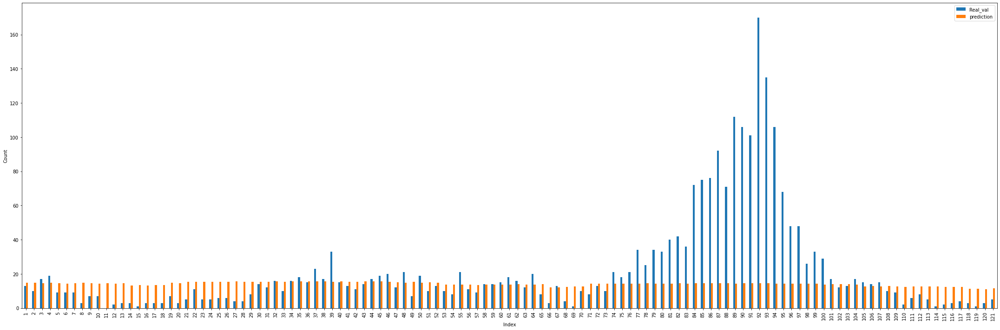

0.6
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_10'],
      dtype='object')
0.009435289570088878
14.468135834326247


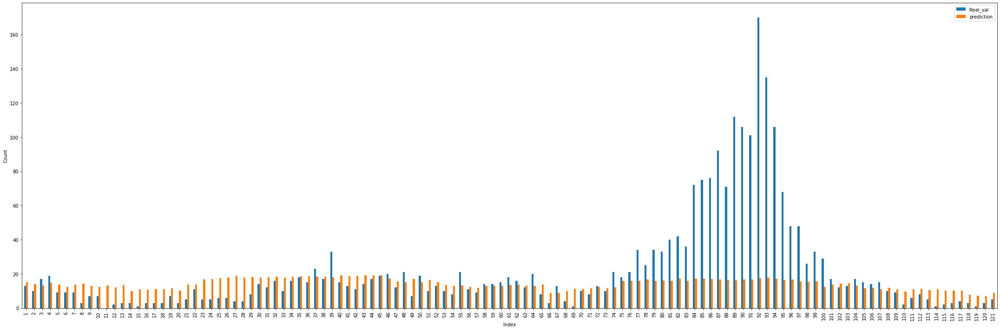

0.7000000000000001
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_10'],
      dtype='object')
0.07802554497241143
13.970209784462444


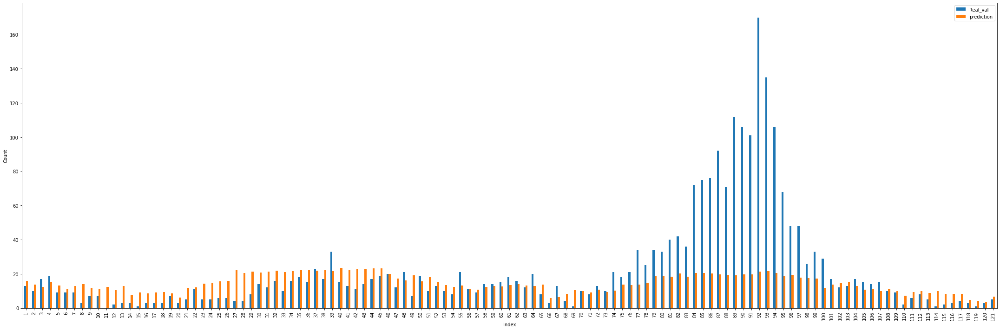

0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_10'],
      dtype='object')
0.14280550208133524
13.662239144618168


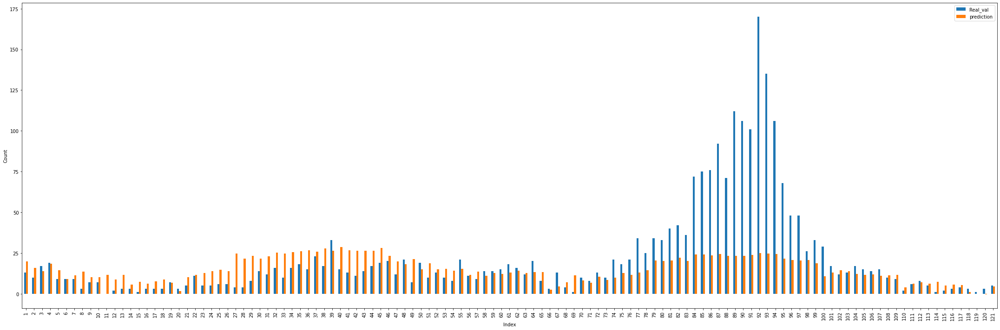

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_8'],
      dtype='object')
0.4
Selected features: Index(['year', 'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_8'],
      dtype='object')
0.21103468074289888
14.180420127501316
0.1
Selected features: Index(['year'], dtype='object')
-0.07480005964336556
15.421714558555347


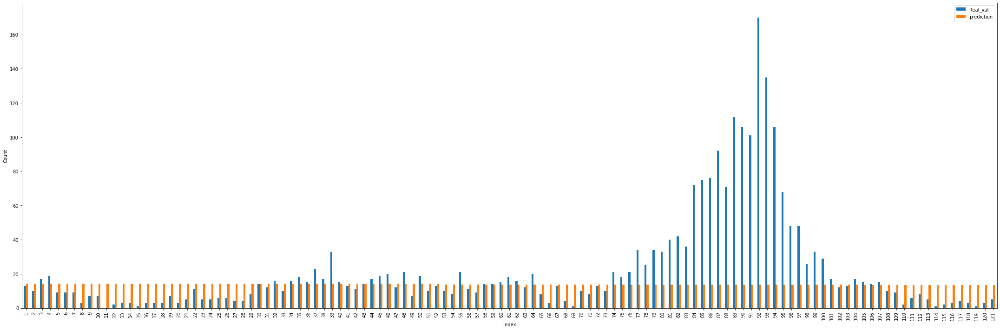

0.2
Selected features: Index(['year'], dtype='object')
-0.07712562312349736
15.421821223098048


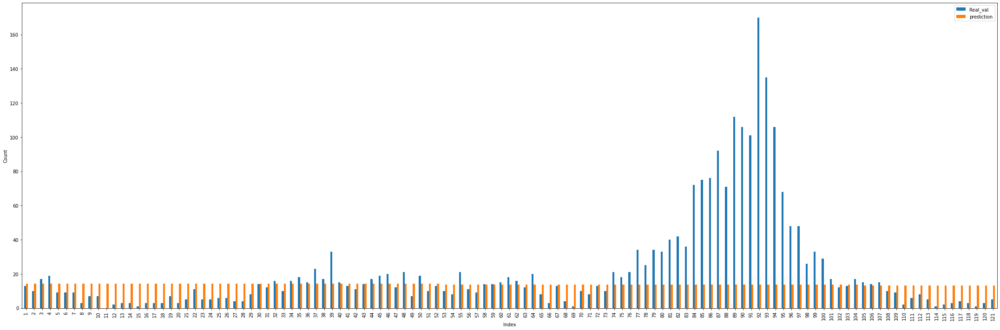

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.07622235427507706
15.43915678676489


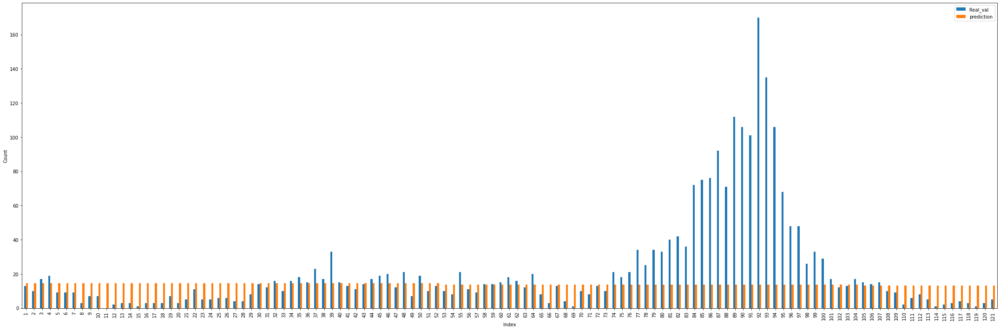

0.4
Selected features: Index(['year'], dtype='object')
-0.07281434643204054
15.470626513741825


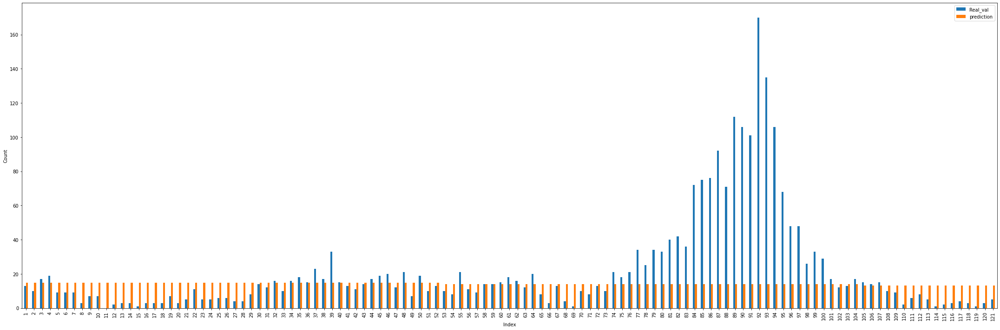

0.5
Selected features: Index(['year'], dtype='object')
-0.06752878959553965
15.53083967455706


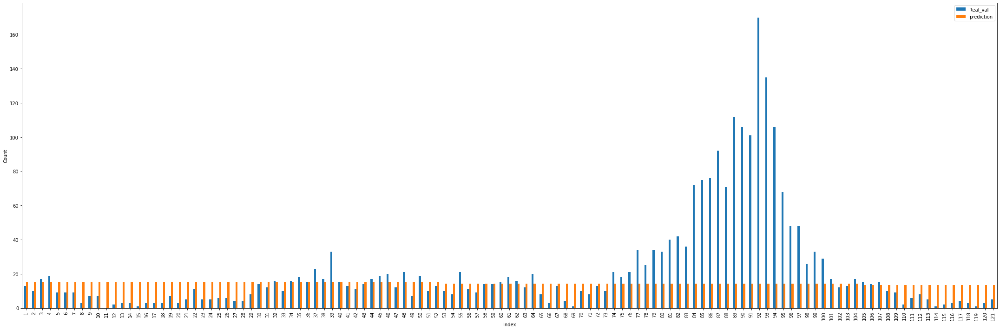

0.6
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4'], dtype='object')
-0.03279705216965456
15.134955443451021


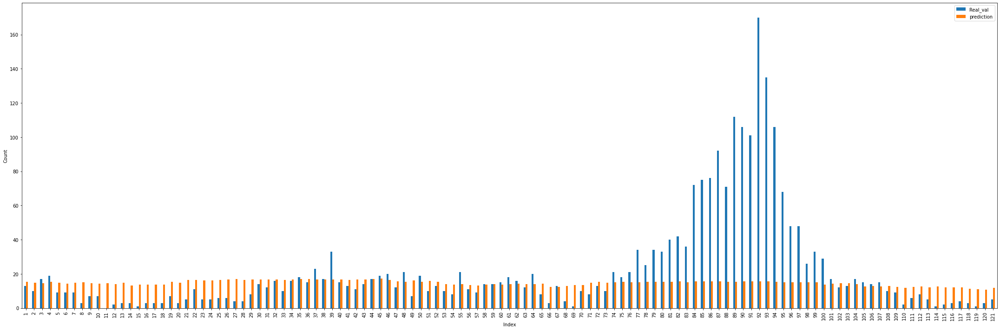

0.7000000000000001
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6', 'month_10'],
      dtype='object')
0.03434324017253643
14.435707586700522


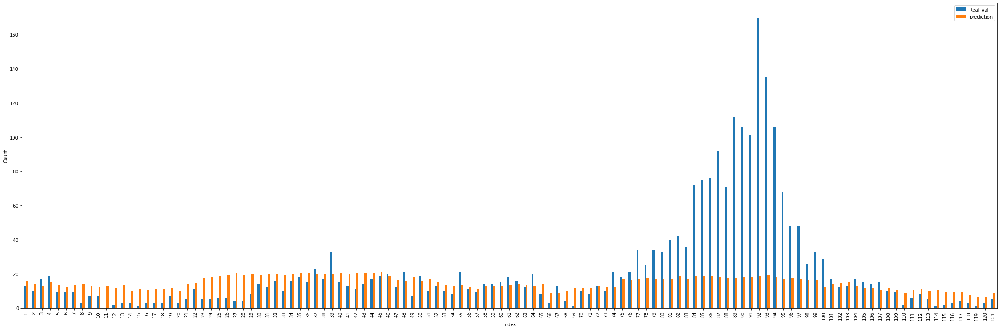

0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_10'],
      dtype='object')
0.107842161583246
13.849859016849528


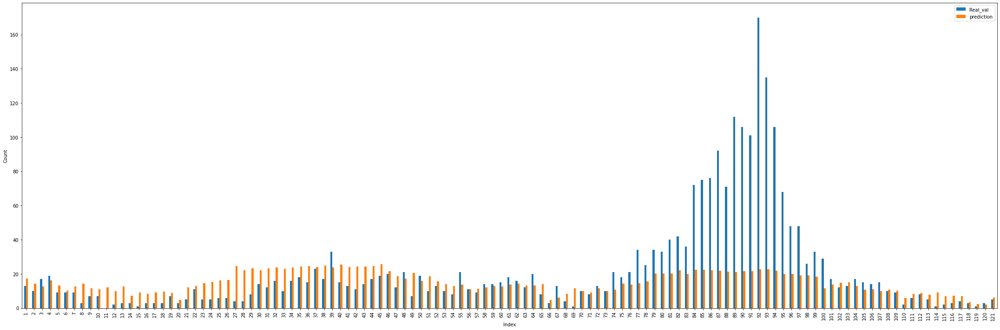

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_8', 'month_10'],
      dtype='object')
0.5
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_8'],
      dtype='object')
0.19804518831767337
14.015542792742087
0.1
Selected features: Index(['year'], dtype='object')
-0.06028818834639793
15.526220513574634


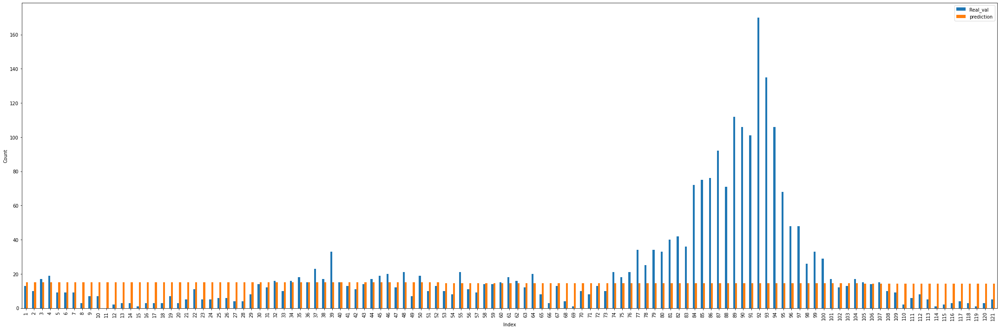

0.2
Selected features: Index(['year'], dtype='object')
-0.06594433488163798
15.49170446390478


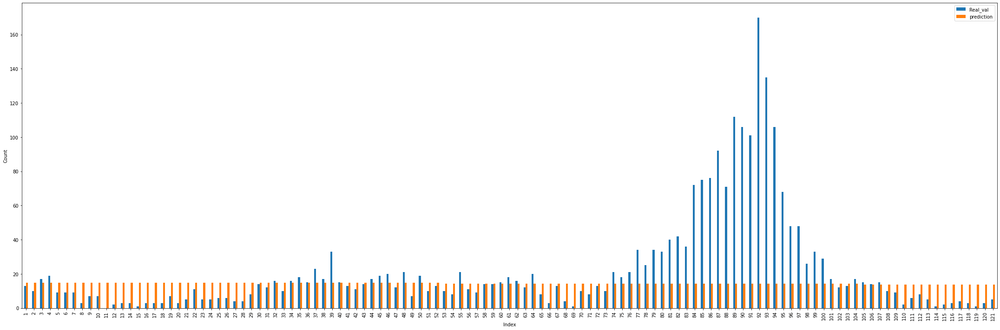

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.0677186044728133
15.49225615578249


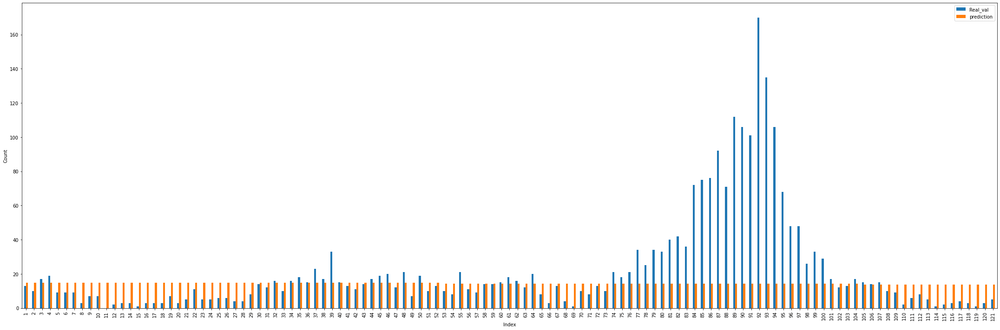

0.4
Selected features: Index(['year'], dtype='object')
-0.06643321677811631
15.519771365070845


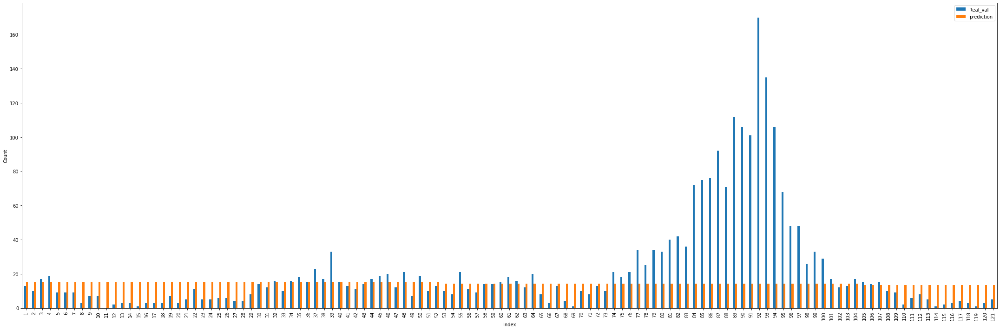

0.5
Selected features: Index(['year'], dtype='object')
-0.06281270978528175
15.574329890364217


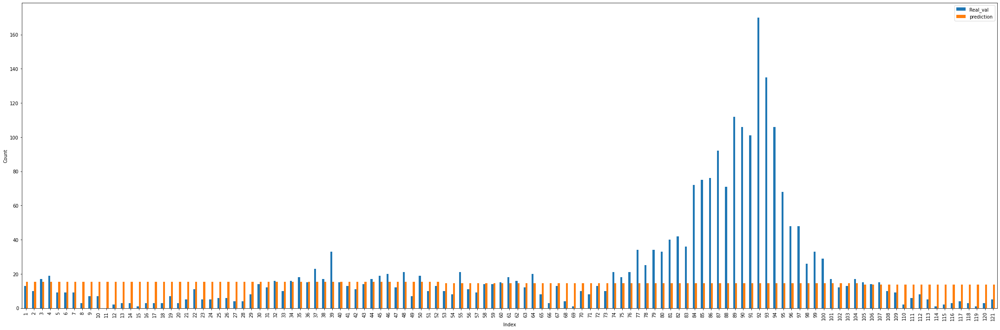

0.6
Selected features: Index(['year'], dtype='object')
-0.05750312300408078
15.64879707048493


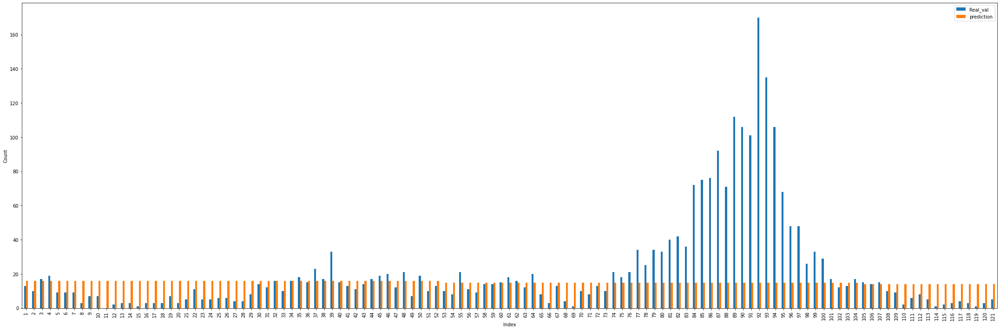

0.7000000000000001
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5'], dtype='object')
0.0025585363232111247
14.935096813224451


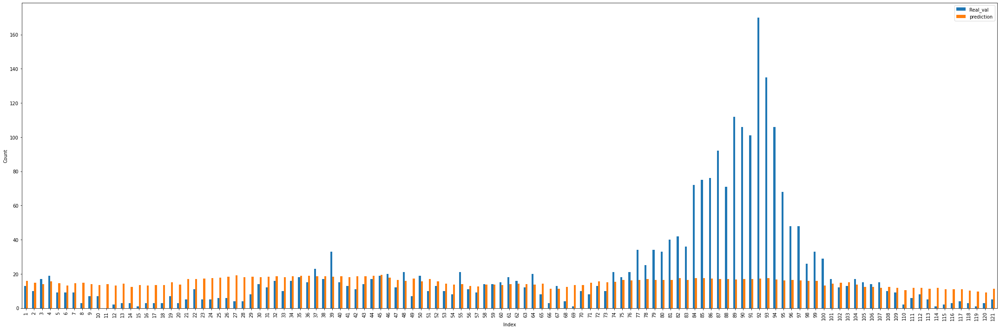

0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6', 'month_10'],
      dtype='object')
0.07176804311720175
14.248587210221205


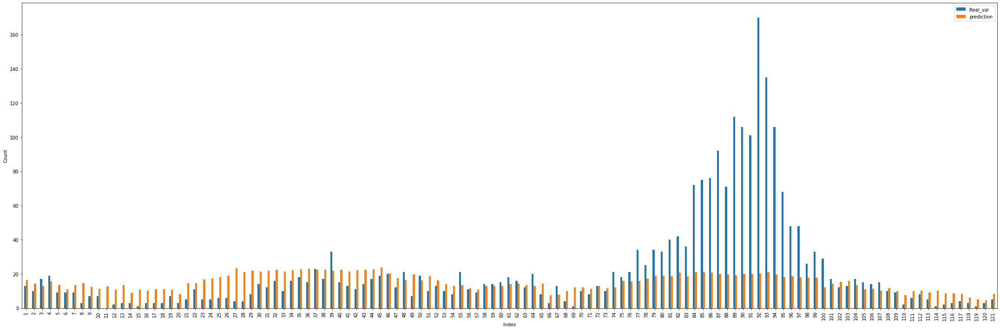

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_8', 'month_10'],
      dtype='object')
0.14482057093155676
13.697755644818875


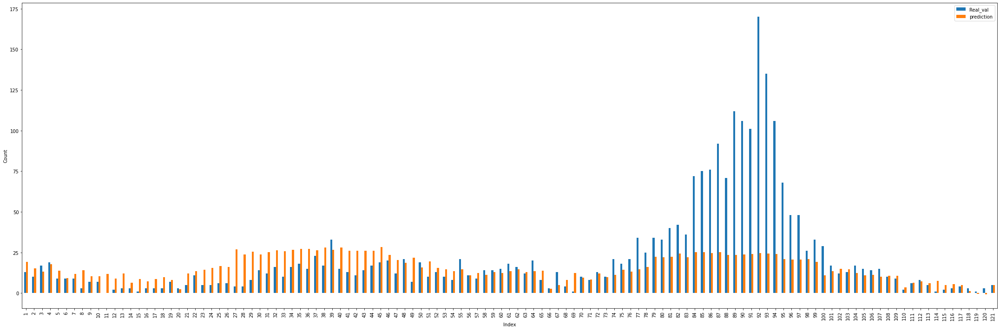

0.6
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_8'],
      dtype='object')
0.1827460089823285
13.847720355680213
0.1
Selected features: Index(['year'], dtype='object')
-0.04665552569762599
15.693012959596414


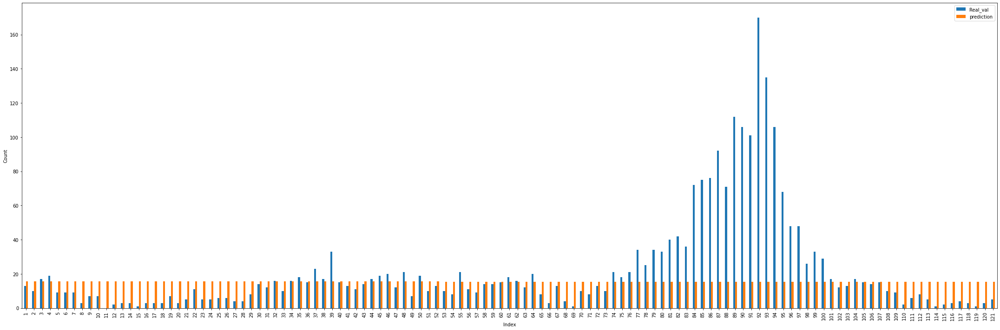

0.2
Selected features: Index(['year'], dtype='object')
-0.05527741692547594
15.595420297886813


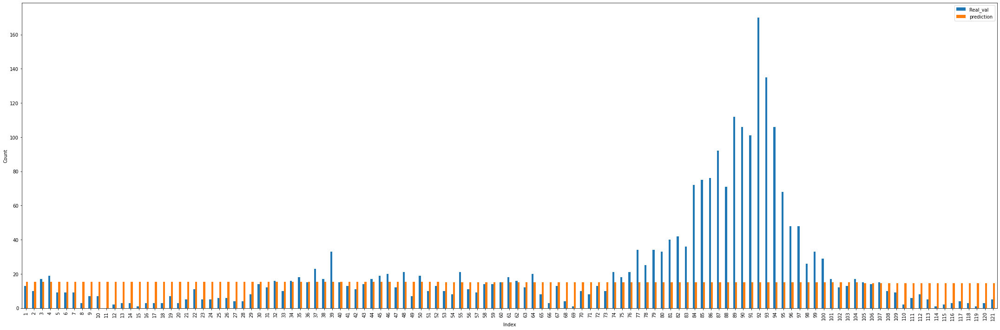

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.05953392432081195
15.566692388723537


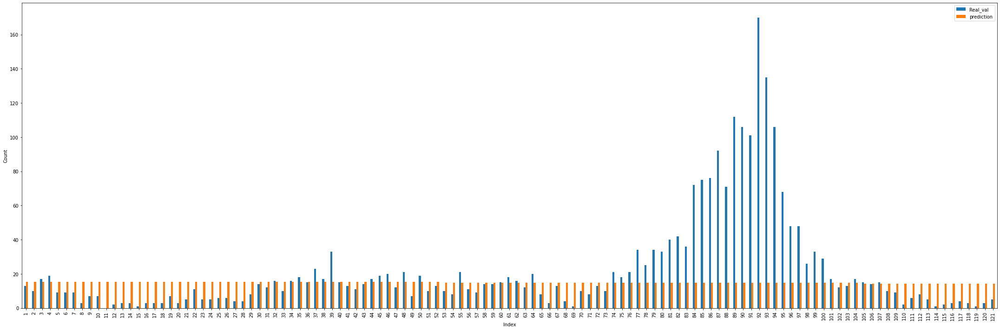

0.4
Selected features: Index(['year'], dtype='object')
-0.06025535278487282
15.57715073353828


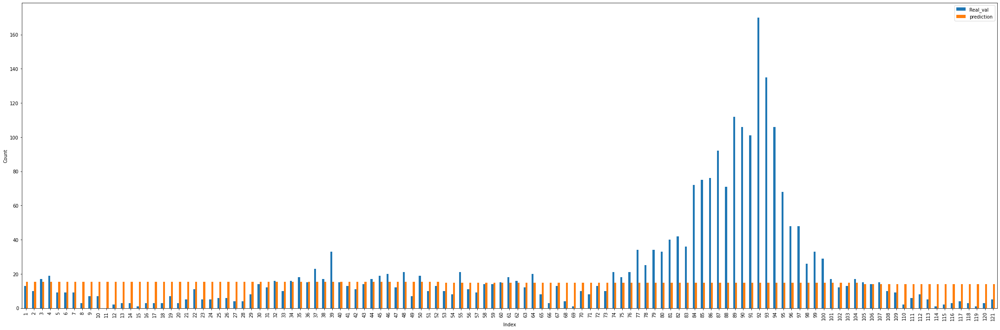

0.5
Selected features: Index(['year'], dtype='object')
-0.05822679530651009
15.61852970219377


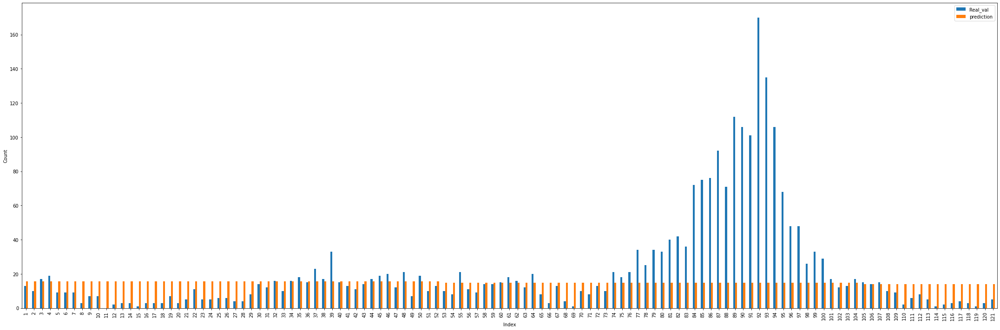

0.6
Selected features: Index(['year'], dtype='object')
-0.0541612117884116
15.690917699137746


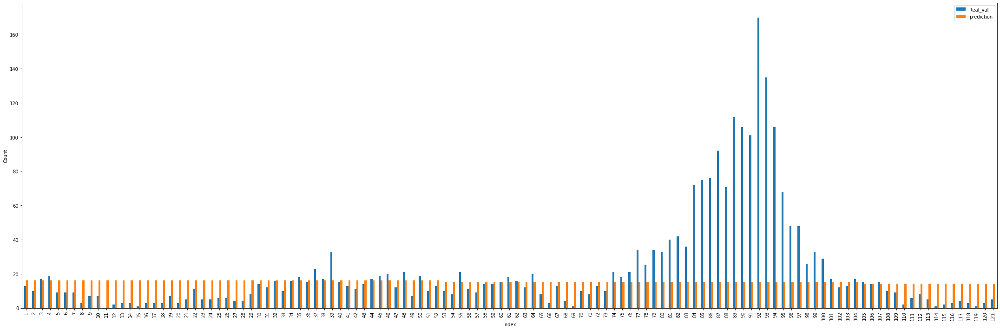

0.7000000000000001
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4'], dtype='object')
-0.02466303343349674
15.421345813174813


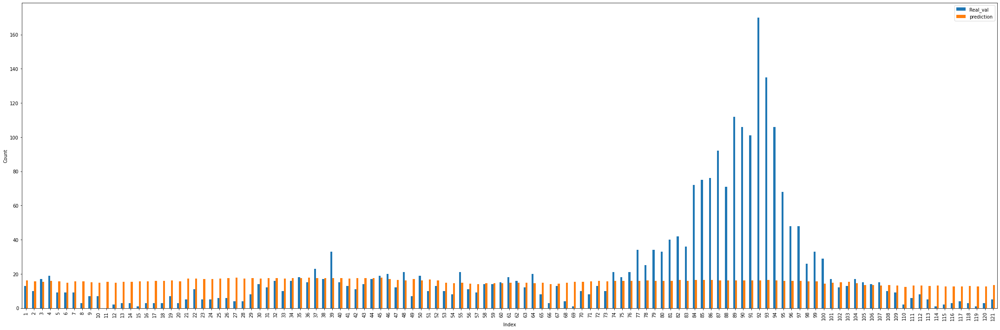

0.8
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5'], dtype='object')
0.044752283114259495
14.630336118315665


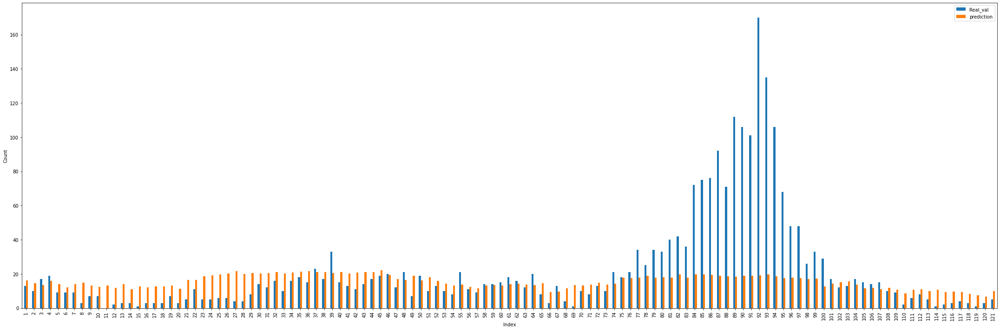

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6'],
      dtype='object')
0.12270719221054116
13.924837955210565


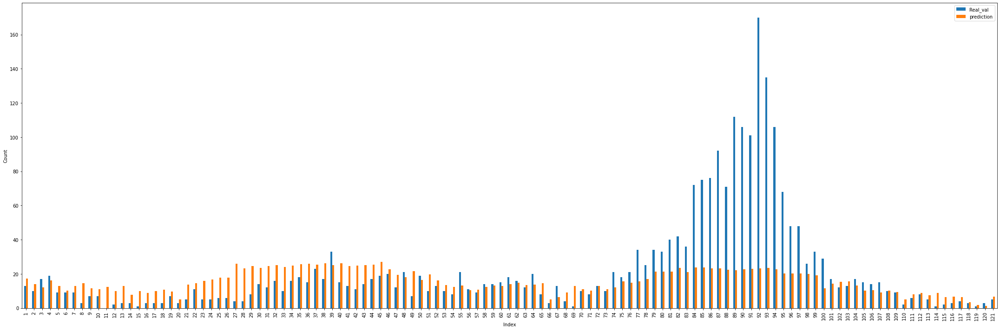

0.7000000000000001
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_8'],
      dtype='object')
0.1702973617173732
13.771546534956855
0.1
Selected features: Index(['year'], dtype='object')
-0.03410276852528793
15.921788229142932


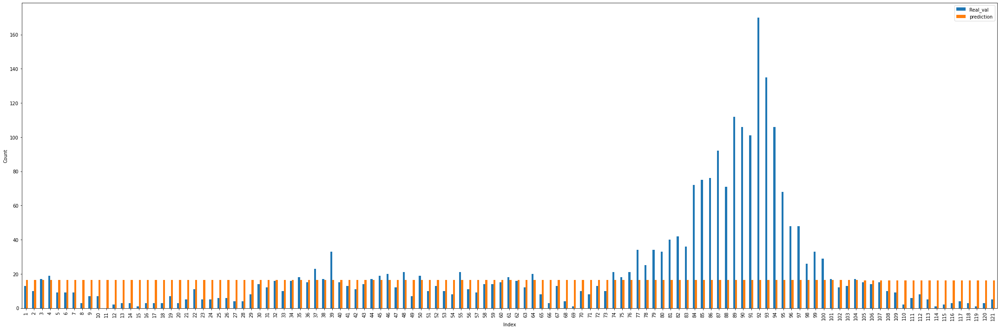

0.2
Selected features: Index(['year'], dtype='object')
-0.04520153286150763
15.72963812492022


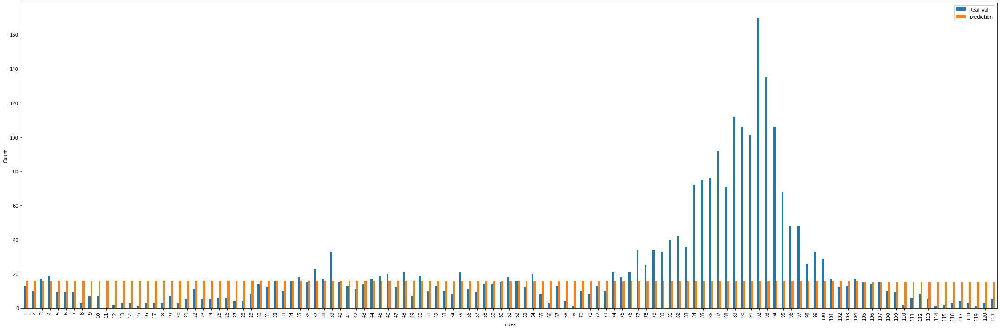

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.05169836514933435
15.65604254224241


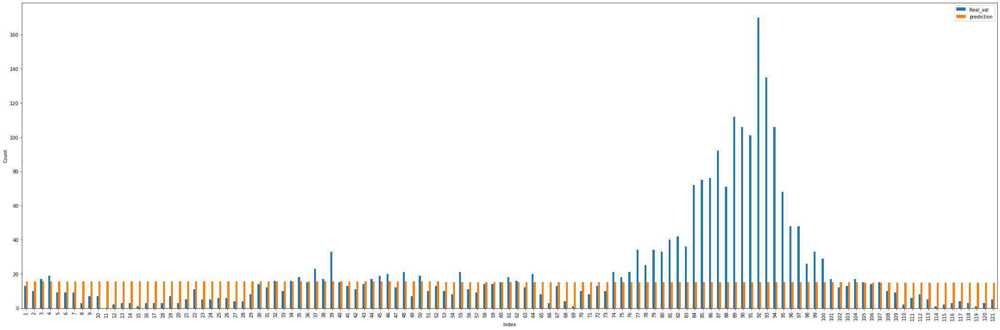

0.4
Selected features: Index(['year'], dtype='object')
-0.05429250584301659
15.643157089574963


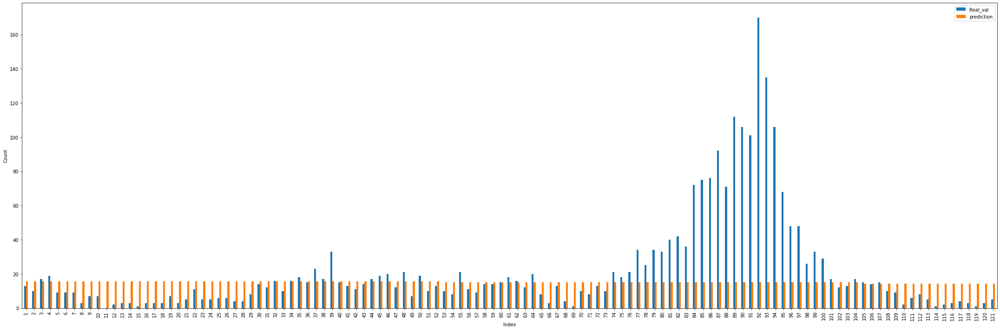

0.5
Selected features: Index(['year'], dtype='object')
-0.053775521032696894
15.670000982633542


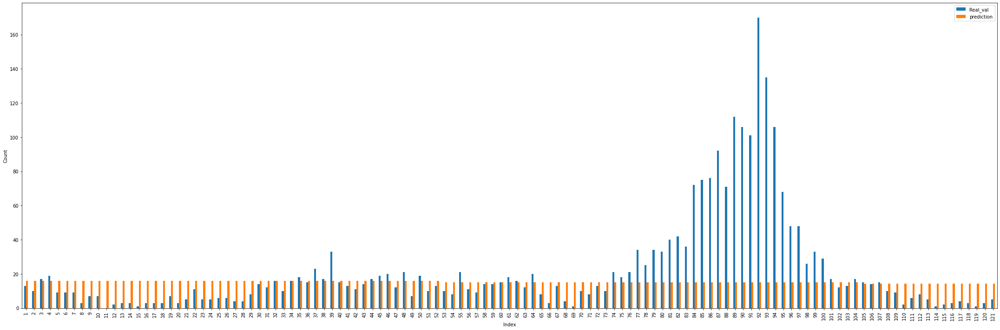

0.6
Selected features: Index(['year'], dtype='object')
-0.05090358032180653
15.738229894008956


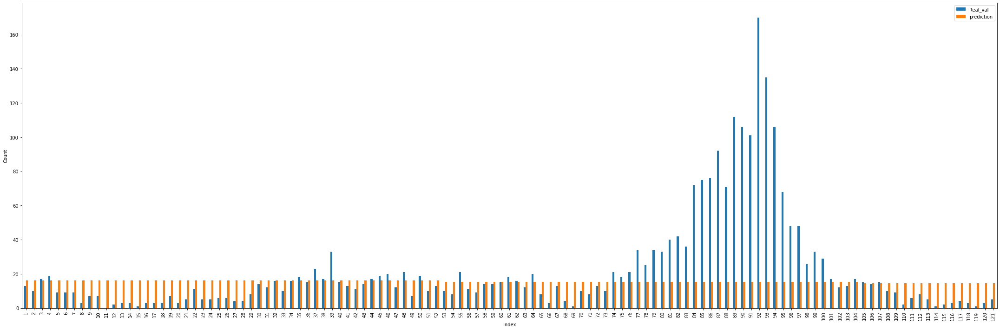

0.7000000000000001
Selected features: Index(['year'], dtype='object')
-0.046375796911307
15.838773121913007


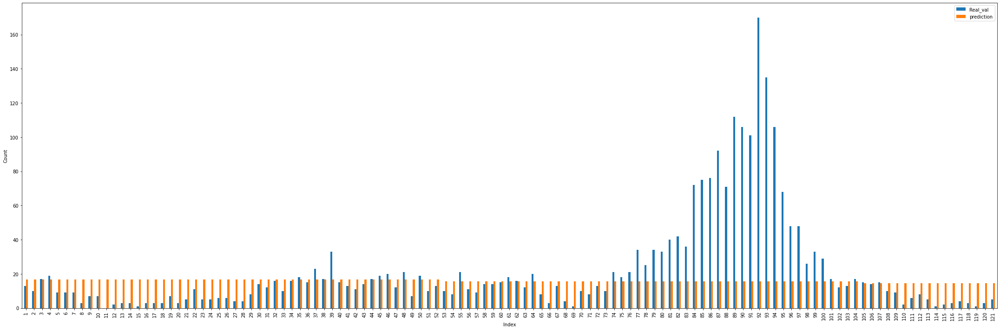

0.8
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5'], dtype='object')
0.02244751212209728
15.025381186754636


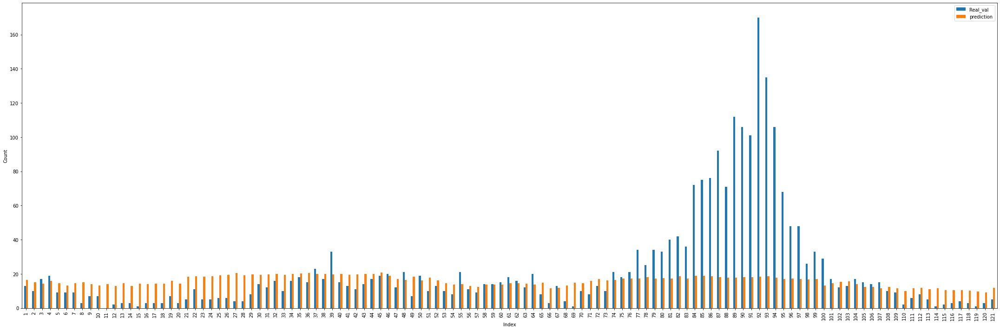

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6'],
      dtype='object')
0.09840206844866306
14.228646701016634


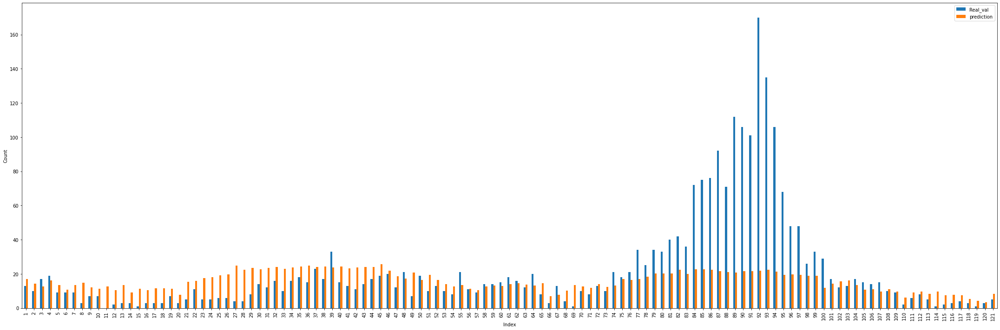

0.8
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_1', 'month_4',
       'month_5', 'month_6', 'month_8'],
      dtype='object')
0.15638895202504444
13.828243708729264
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index(['year'], dtype='object')
-0.03579877694903355
15.90759207042997


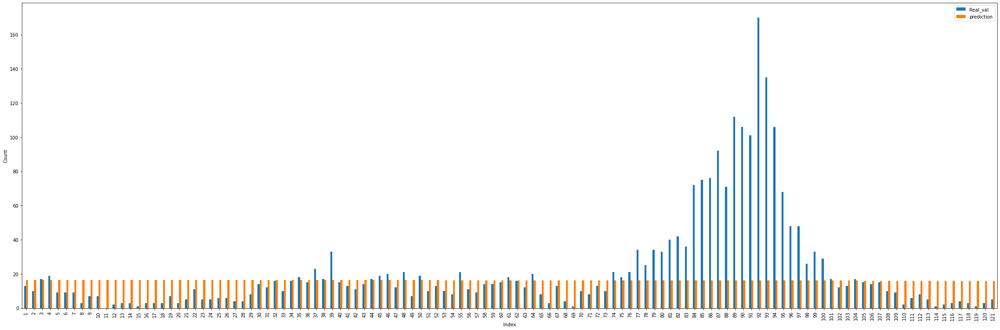

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.04424319456308856
15.766061994149045


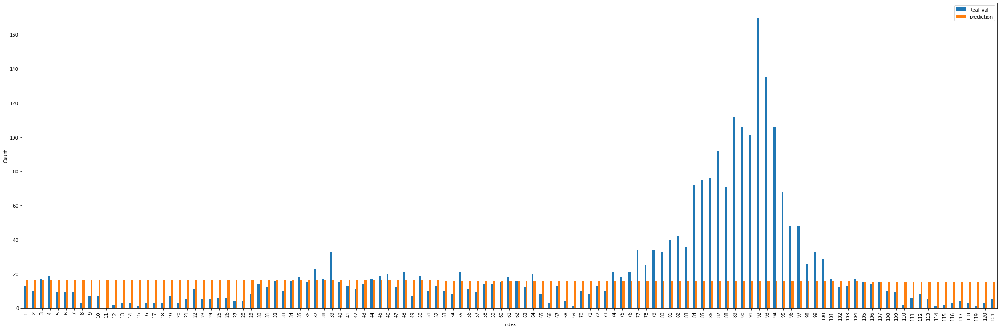

0.4
Selected features: Index(['year'], dtype='object')
-0.04855667363920402
15.717639819139224


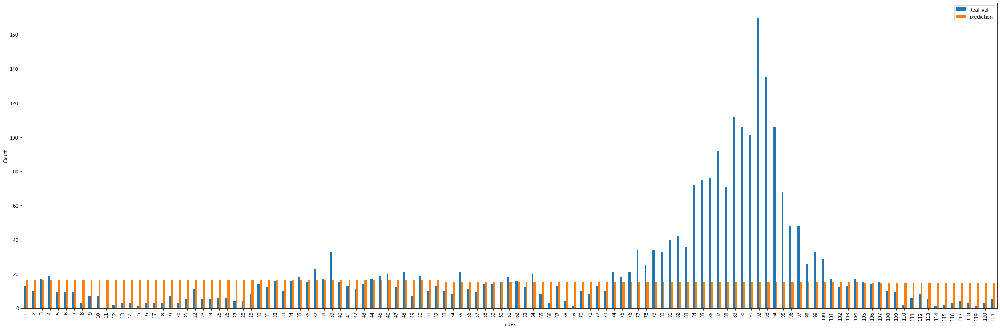

0.5
Selected features: Index(['year'], dtype='object')
-0.049463400903949184
15.730756570797054


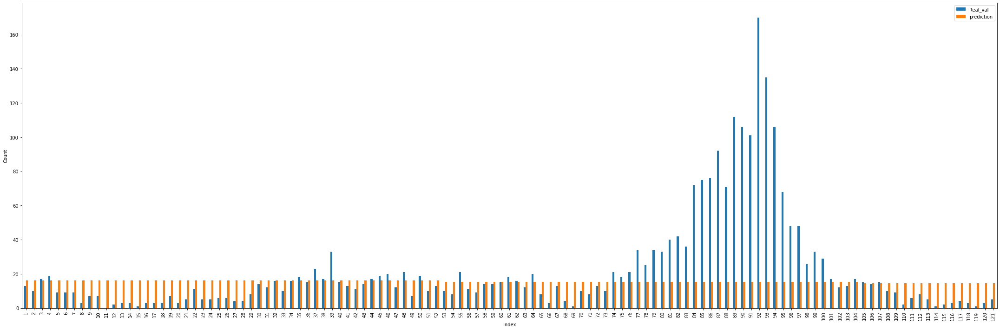

0.6
Selected features: Index(['year'], dtype='object')
-0.04773185025241666
15.785773431752592


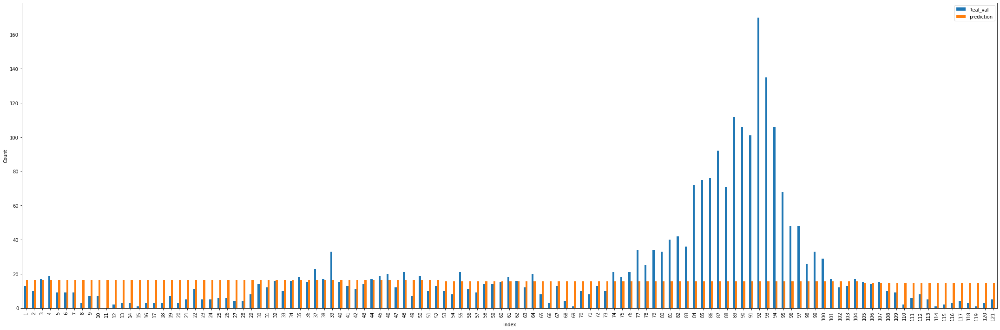

0.7000000000000001
Selected features: Index(['year'], dtype='object')
-0.04409603936307405
15.874854529360041


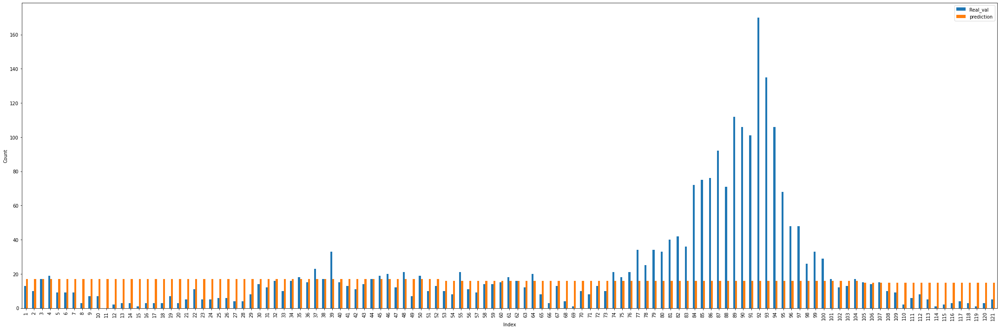

0.8
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4'], dtype='object')
0.00266923485510584
15.38055843541693


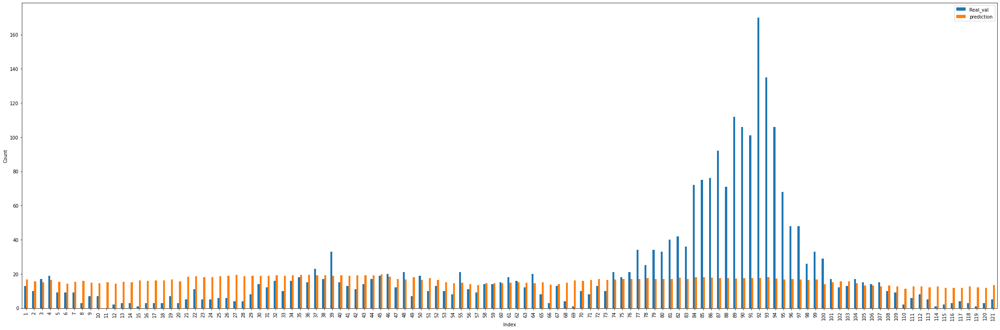

0.9
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6'],
      dtype='object')
0.07408615118416384
14.553107249974715


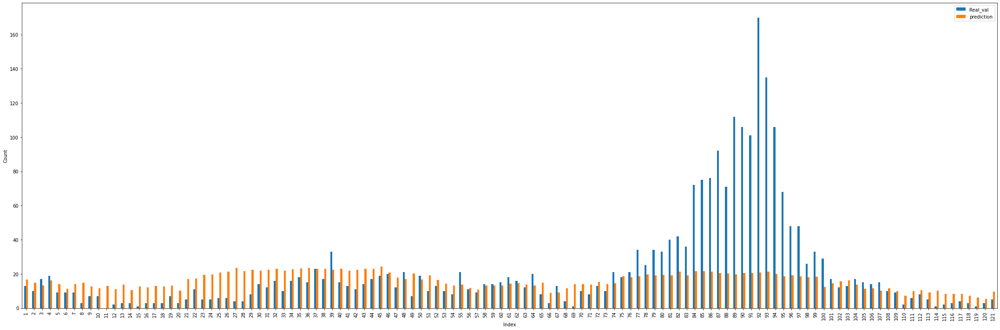

0.9
Selected features: Index(['year', 'reanalysis_max_air_temp_k',
       'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5',
       'month_6', 'month_8'],
      dtype='object')
0.14041273723093373
14.013331341759473
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index(['year'], dtype='object')
-0.02715695816170771
16.106461325389972


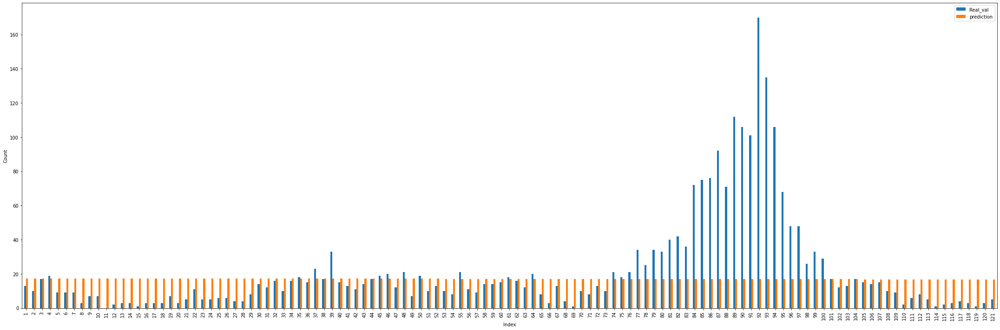

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.037200927071870504
15.90088466499121


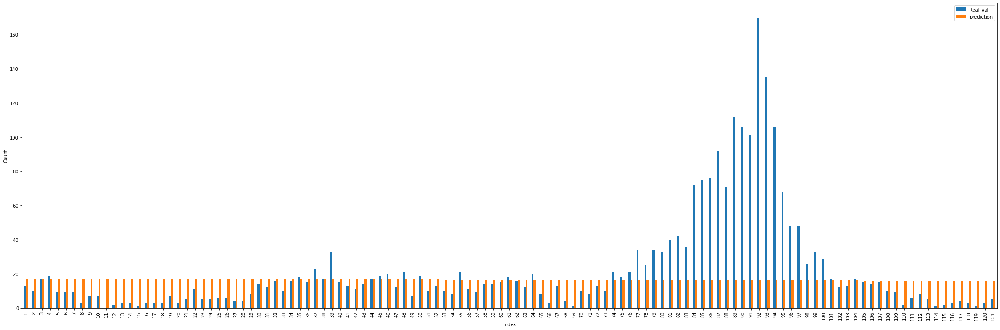

0.4
Selected features: Index(['year'], dtype='object')
-0.0430601023220516
15.809556687436894


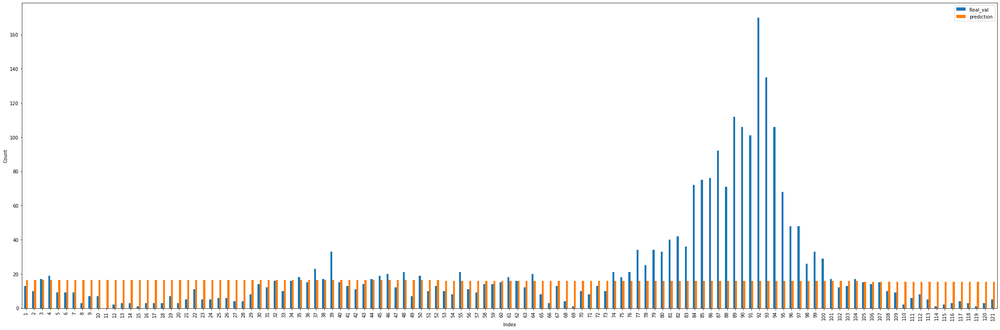

0.5
Selected features: Index(['year'], dtype='object')
-0.04529498792702302
15.793880006899494


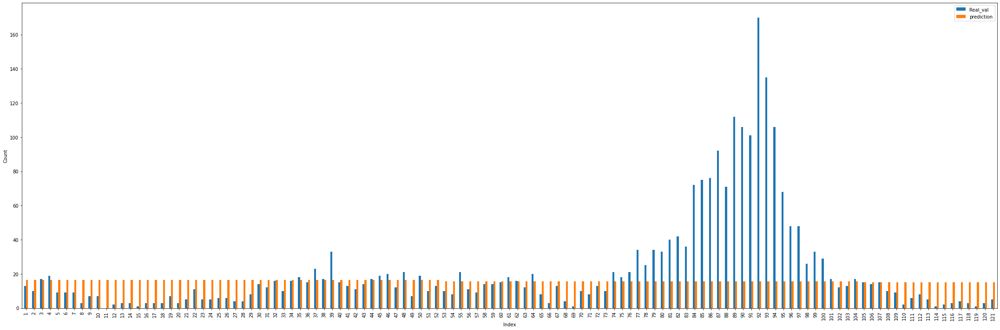

0.6
Selected features: Index(['year'], dtype='object')
-0.04464764548768074
15.833547723840699


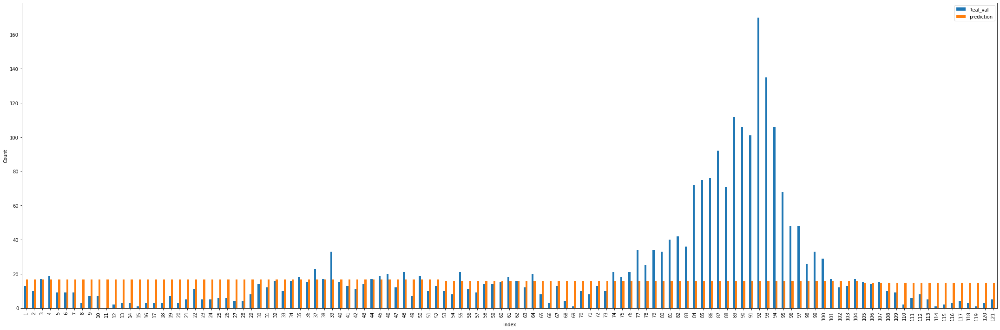

0.7000000000000001
Selected features: Index(['year'], dtype='object')
-0.04186952363301111
15.9141278036454


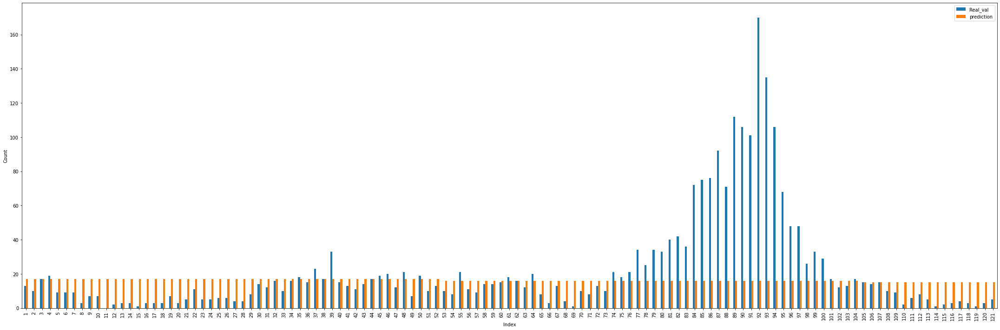

0.8
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg'], dtype='object')
-0.015326849808111609
15.697939664609292


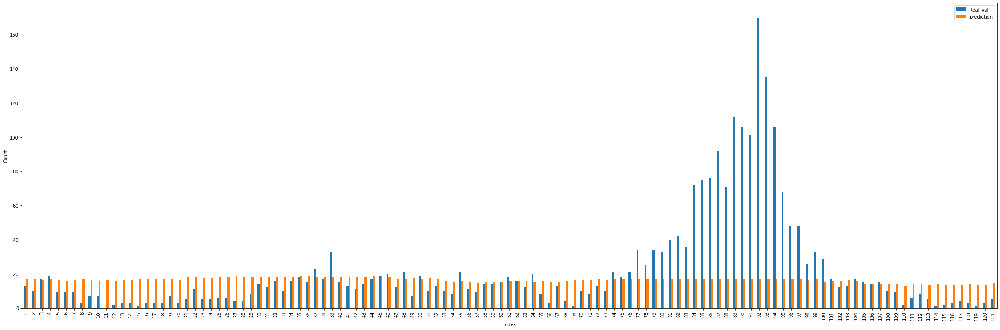

0.9
Selected features: Index(['year', 'reanalysis_specific_humidity_g_per_kg', 'month_4', 'month_5'], dtype='object')
0.05698541188581663
14.851733584427885


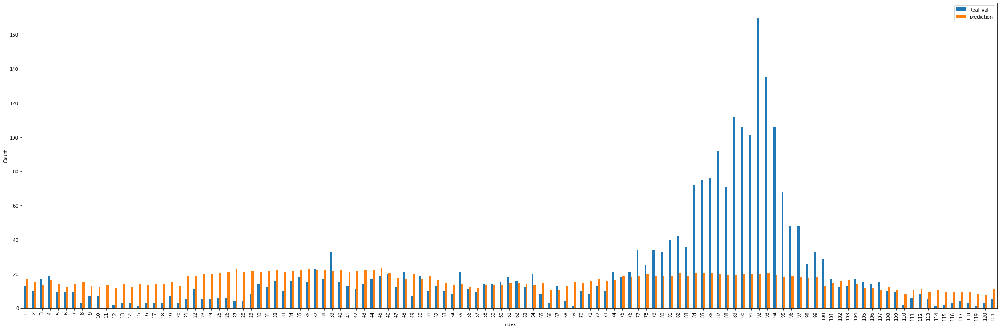

In [45]:
for lasso_alpha in np.arange(0.1, 1.0, 0.1):
    print(lasso_alpha)
    modeling_linear(train_sj,validate_sj,Lasso(alpha=lasso_alpha))

In [46]:
def modeling_linear_pca(train_x,validate_x,model):
    
  
    
    train = train_x.copy()
    validate = validate_x.copy()
    
    scaler = MinMaxScaler()
    scaler.fit(train[numerical_cols])
    train[numerical_cols] = scaler.transform(train[numerical_cols])
    
    pca = PCA(n_components=len(train[numerical_cols].columns)) # Decide on the number of components
    principalComponents = pca.fit_transform(train[numerical_cols])
    df_pca = pd.DataFrame(data=principalComponents, columns=['PC'+str(i+1) for i in range(principalComponents.shape[1])])
    
    train = pd.concat([train.drop(columns = numerical_cols),df_pca],axis=1)

    validate[numerical_cols] = scaler.transform(validate[numerical_cols])
    principalComponents_v = pca.transform(validate[numerical_cols])
    df_pca_v = pd.DataFrame(data=principalComponents_v, columns=['PC'+str(i+1) for i in range(principalComponents_v.shape[1])])
    validate = pd.concat([validate.drop(columns = numerical_cols),df_pca_v],axis=1)
    
    model.fit(train.drop(columns = identity_cols ),train['total_cases'])
    
    important_cols = train.drop(columns = identity_cols ).columns[(model.coef_ != 0)]
    print(f"Selected features: {important_cols}")
    
    
    
    model.fit(train[important_cols],train['total_cases'])
    

    
    
    predict = model.predict(validate[important_cols])
    
    print(r2_score(validate.total_cases,predict))
    print(mean_absolute_error(validate.total_cases,predict))
    
    
    for alpha in np.arange(0.1, 1.1, 0.1):
        
        try:
            print(alpha)

            train = train_x.copy()
            validate = validate_x.copy()

            train['total_cases'] = boxcox1p(train['total_cases'],alpha)



            scaler = MinMaxScaler()
            scaler.fit(train[numerical_cols])
            train[numerical_cols] = scaler.transform(train[numerical_cols])
            
            pca = PCA(n_components=len(train[numerical_cols].columns)) # Decide on the number of components
            principalComponents = pca.fit_transform(train[numerical_cols])
            df_pca = pd.DataFrame(data=principalComponents, columns=['PC'+str(i+1) for i in range(principalComponents.shape[1])])
    
            train = pd.concat([train.drop(columns = numerical_cols),df_pca],axis=1)

            validate[numerical_cols] = scaler.transform(validate[numerical_cols])
            principalComponents_v = pca.transform(validate[numerical_cols])
            df_pca_v = pd.DataFrame(data=principalComponents_v, columns=['PC'+str(i+1) for i in range(principalComponents_v.shape[1])])
            validate = pd.concat([validate.drop(columns = numerical_cols),df_pca_v],axis=1)
    

            model.fit(train.drop(columns = identity_cols ),train['total_cases'])


            important_cols = train.drop(columns = identity_cols ).columns[(model.coef_ != 0)]
            print(f"Selected features: {important_cols}")

            model.fit(train[important_cols],train['total_cases'])


            predict = model.predict(validate[important_cols])
            predict = inv_boxcox1p(predict,alpha)

            print(r2_score(validate.total_cases,predict))
            print(mean_absolute_error(validate.total_cases,predict))

            df = pd.DataFrame({
            'Real_val': validate.total_cases,
            'prediction': predict,
            'index': np.arange(1, len(predict)+1)})

            ax = df.plot(x='index', y=['Real_val', 'prediction'], kind='bar', figsize=(30, 10))
            ax.set_xlabel("Index")
            ax.set_ylabel("Count")
            plt.tight_layout()
            plt.show()
            
            
        except ValueError:
            continue

0.1
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_12', 'weekofyear_27',
       'weekofyear_32', 'weekofyear_36', 'weekofyear_38', 'weekofyear_42',
       'weekofyear_52', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
       'PC10', 'PC11'],
      dtype='object')
0.14084195935535682
15.942750189385896
0.1
Selected features: Index(['year', 'PC1'], dtype='object')
-0.08110046382641567
14.81931258918288


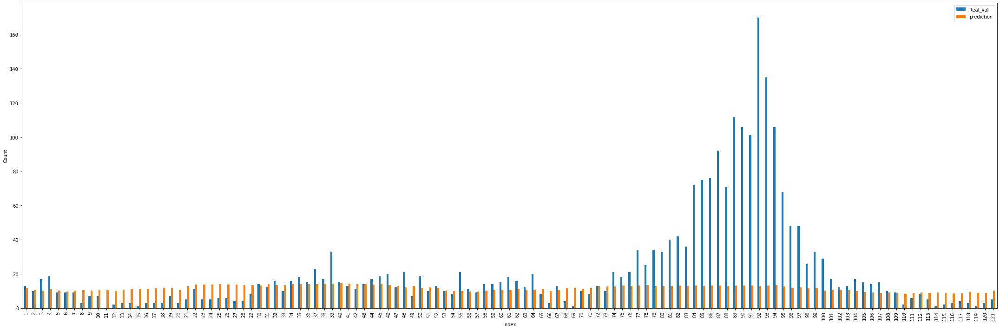

0.2
Selected features: Index(['year', 'month_4', 'month_5', 'PC1'], dtype='object')
-0.039960155114575624
14.306933535359118


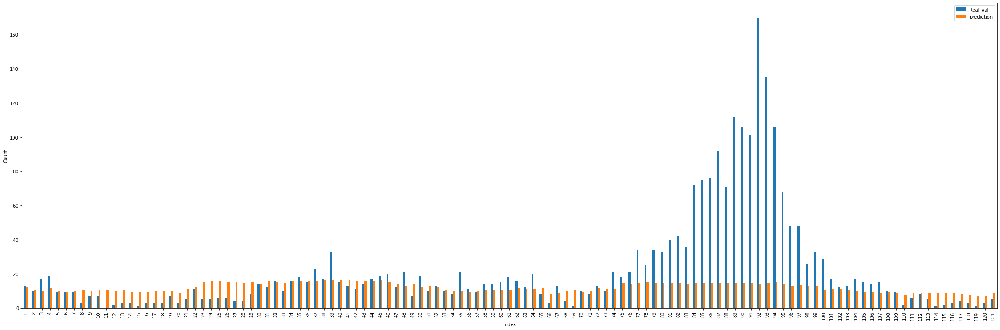

0.30000000000000004
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_10', 'PC1'], dtype='object')
0.009953929461933964
13.878654666250876


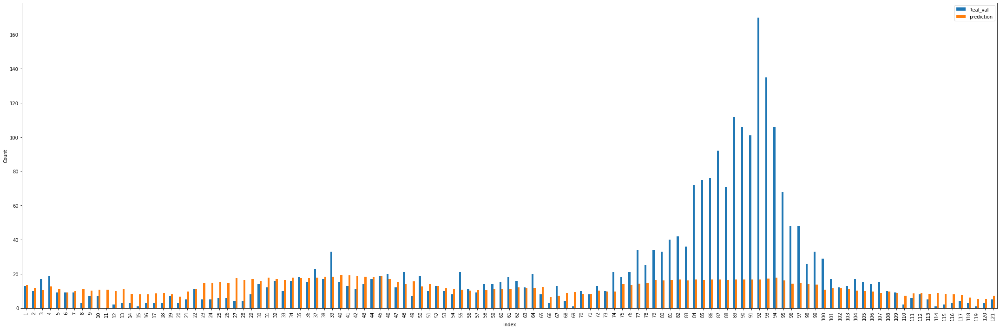

0.4
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_10', 'month_11', 'PC1'],
      dtype='object')
0.06525305463291653
13.666778848957692


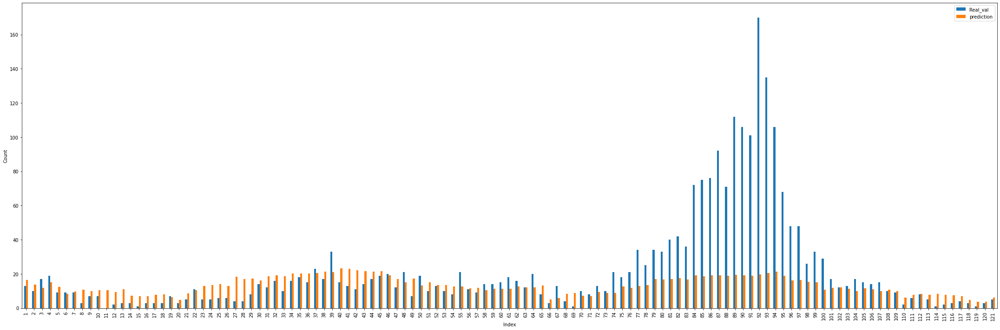

0.5
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_10', 'month_11', 'PC1', 'PC2'],
      dtype='object')
0.11089970784125025
13.588170450655149


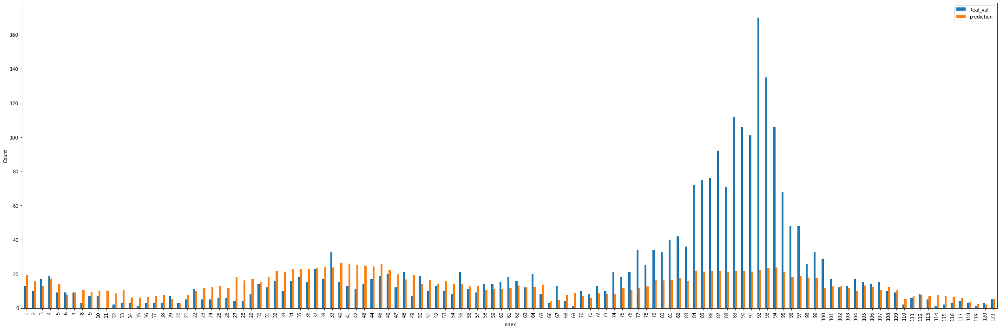

0.6
Selected features: Index(['year', 'month_1', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_10', 'month_11', 'PC1', 'PC2'],
      dtype='object')
0.14876710941642213
13.59749692104997


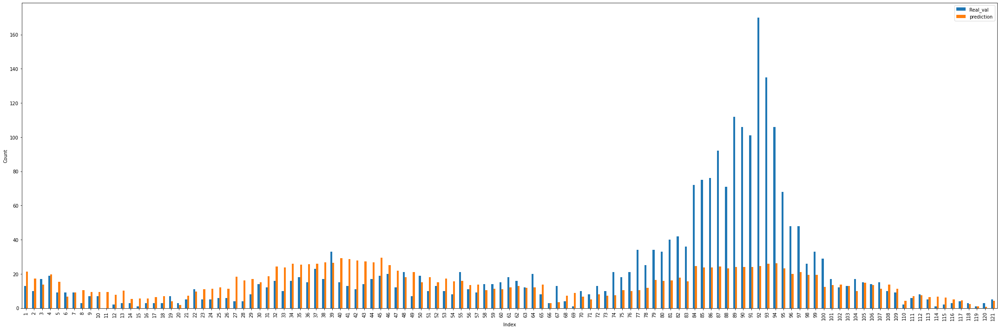

0.7000000000000001
Selected features: Index(['year', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_10', 'month_11', 'PC1', 'PC2', 'PC5',
       'PC6'],
      dtype='object')
0.1723146038764417
13.747560924996758


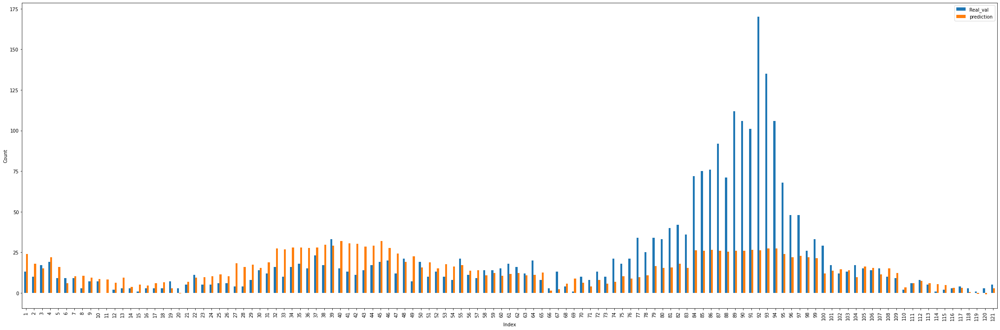

0.8
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_9', 'month_10', 'month_11', 'month_12', 'PC1', 'PC2',
       'PC5', 'PC6', 'PC10'],
      dtype='object')
0.9
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_9', 'month_12', 'weekofyear_27', 'weekofyear_38',
       'weekofyear_52', 'PC1', 'PC2', 'PC3', 'PC5', 'PC6', 'PC8', 'PC10',
       'PC11'],
      dtype='object')
1.0
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_12', 'weekofyear_27',
       'weekofyear_32', 'weekofyear_36', 'weekofyear_38', 'weekofyear_42',
       'weekofyear_52', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
       'PC10', 'PC11'],
      dtype='object')
0.2
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 

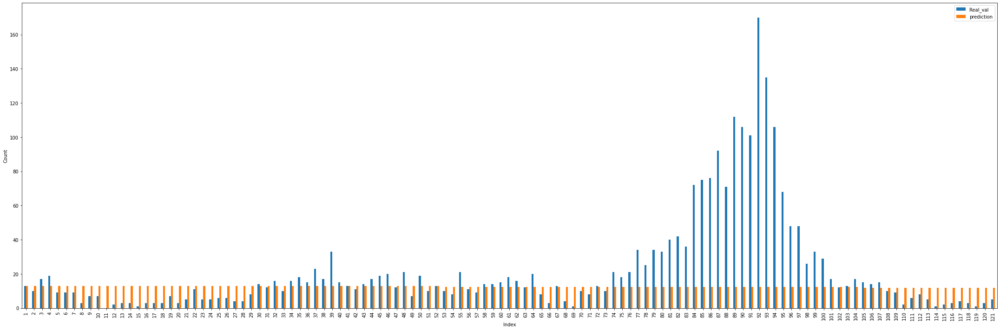

0.2
Selected features: Index(['year', 'PC1'], dtype='object')
-0.07691015198427942
14.997581968991891


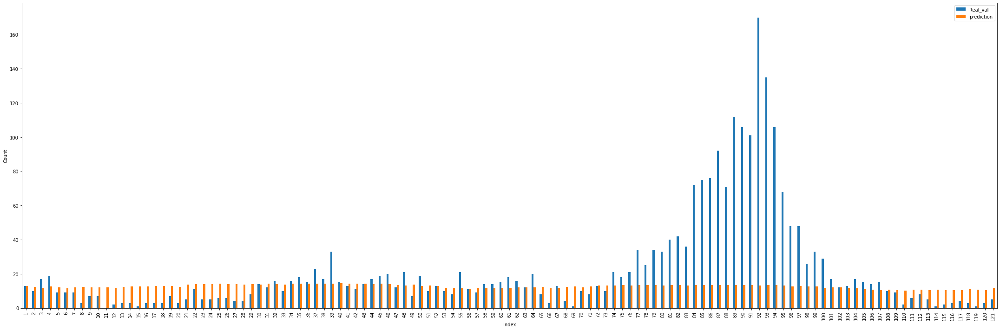

0.30000000000000004
Selected features: Index(['year', 'PC1'], dtype='object')
-0.041673265820923566
14.672456135190997


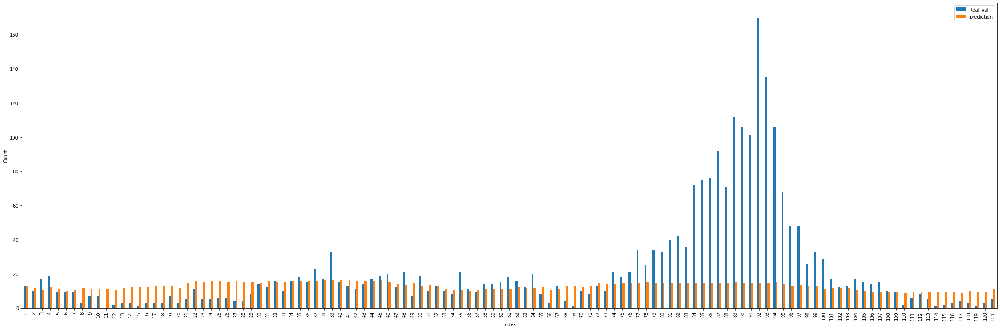

0.4
Selected features: Index(['year', 'month_4', 'month_5', 'PC1'], dtype='object')
-0.003841462013510988
14.360325182572852


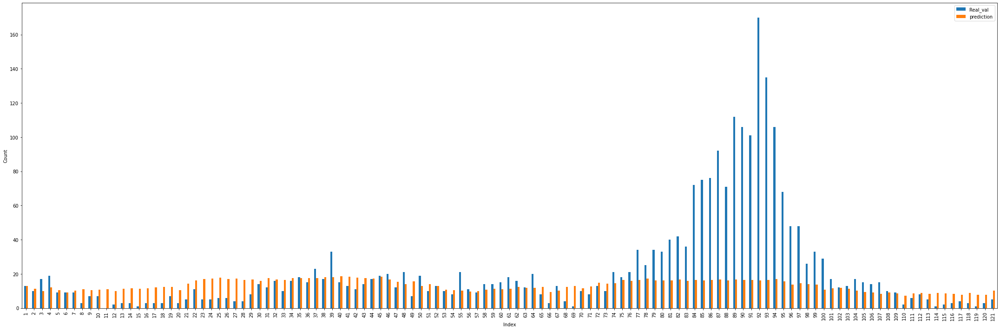

0.5
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.04919227283498517
13.913115738242439


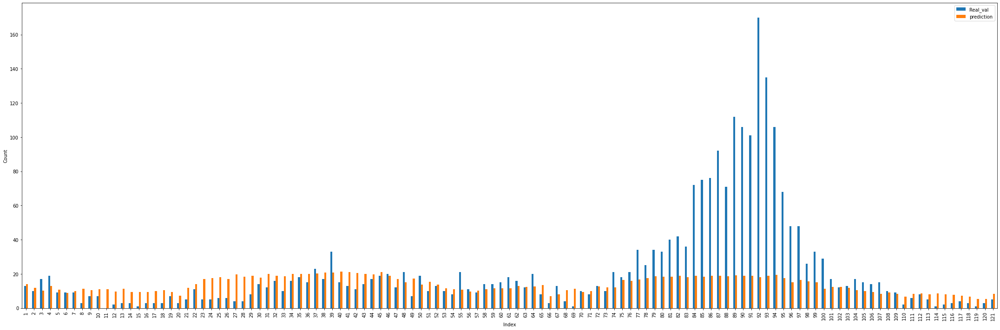

0.6
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_10', 'PC1'],
      dtype='object')
0.10568205322990165
13.592064013275769


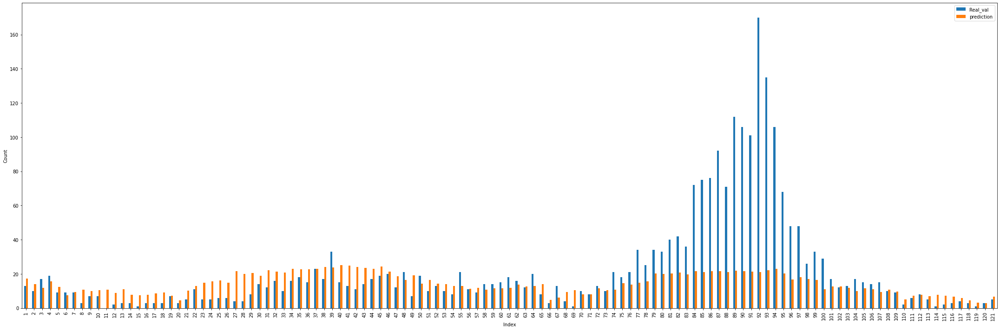

0.7000000000000001
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_10', 'PC1', 'PC2'],
      dtype='object')
0.15558701502651073
13.549270262636979


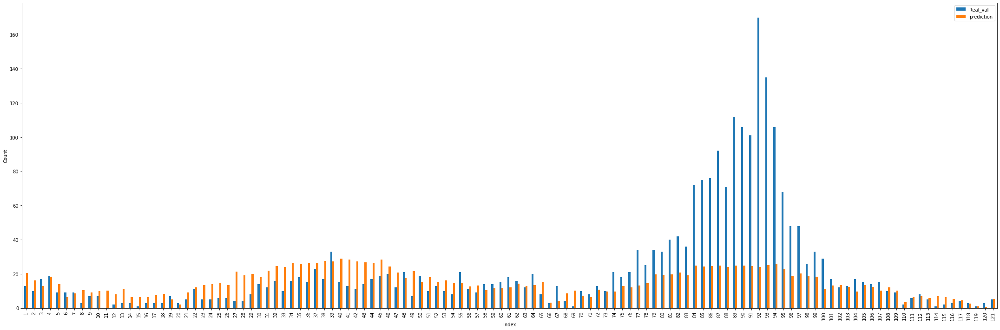

0.8
Selected features: Index(['year', 'month_1', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'PC1', 'PC2', 'PC5'],
      dtype='object')
0.9
Selected features: Index(['year', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'PC1', 'PC2', 'PC5', 'PC6'],
      dtype='object')
1.0
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_12', 'weekofyear_52', 'PC1',
       'PC2', 'PC5', 'PC6', 'PC8', 'PC10'],
      dtype='object')
0.30000000000000004
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'PC1', 'PC2', 'PC5', 'PC6'],
      dtype='object')
0.22069892736358
14.355397416338318
0.1
Selected features: Index(['year'], dtype='object')
-0.0900119523873939
15.360216376876581


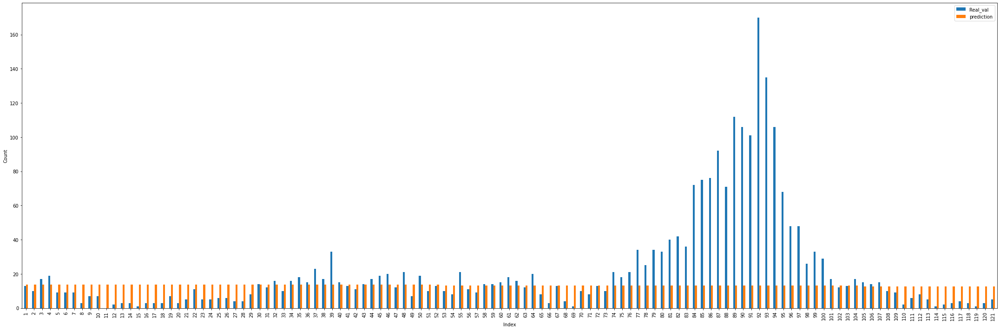

0.2
Selected features: Index(['year'], dtype='object')
-0.08874977608004819
15.371943037155491


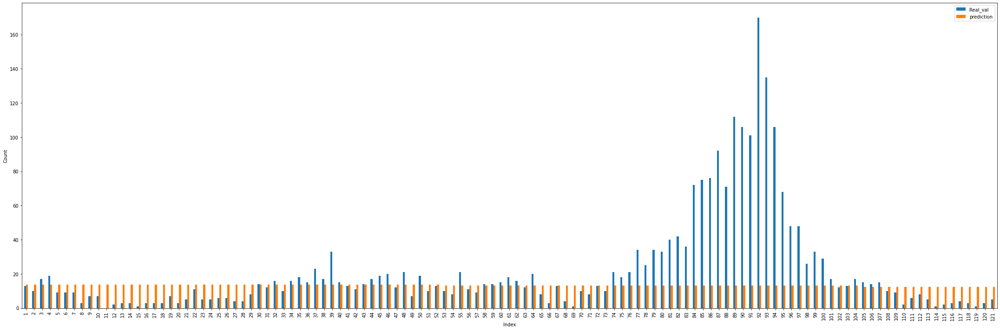

0.30000000000000004
Selected features: Index(['year', 'PC1'], dtype='object')
-0.06276061573385094
15.07387790080687


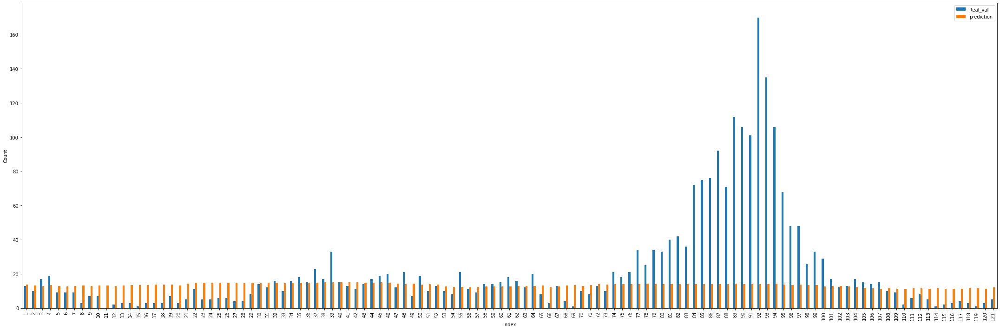

0.4
Selected features: Index(['year', 'PC1'], dtype='object')
-0.02339009064439046
14.690859496244231


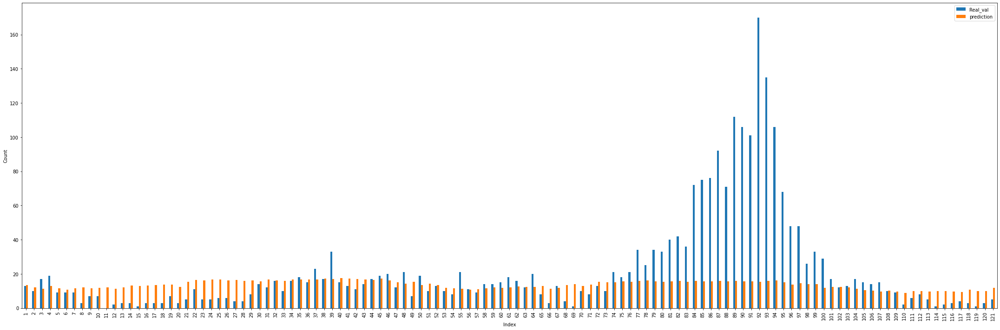

0.5
Selected features: Index(['year', 'PC1'], dtype='object')
0.011792459157699331
14.504261764700011


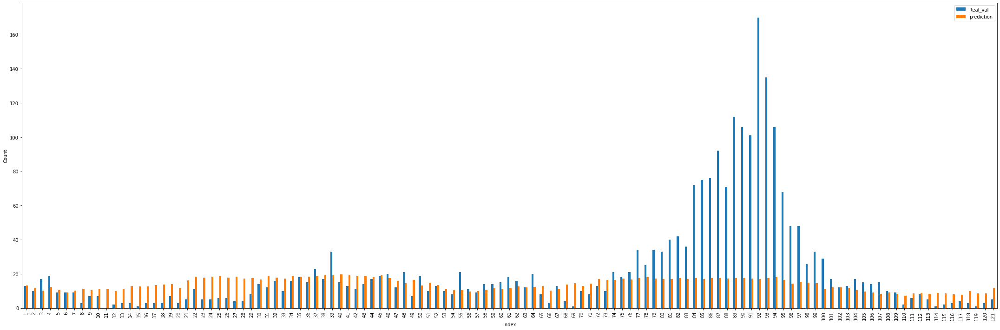

0.6
Selected features: Index(['year', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.06333394150464922
14.06630389092908


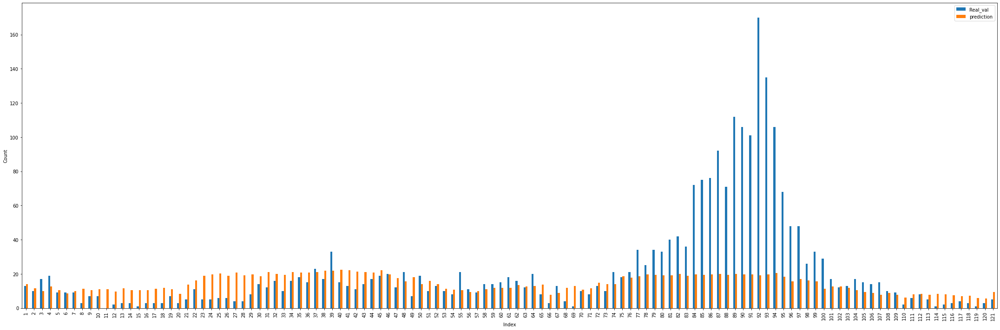

0.7000000000000001
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.1203779533036129
13.638724786643932


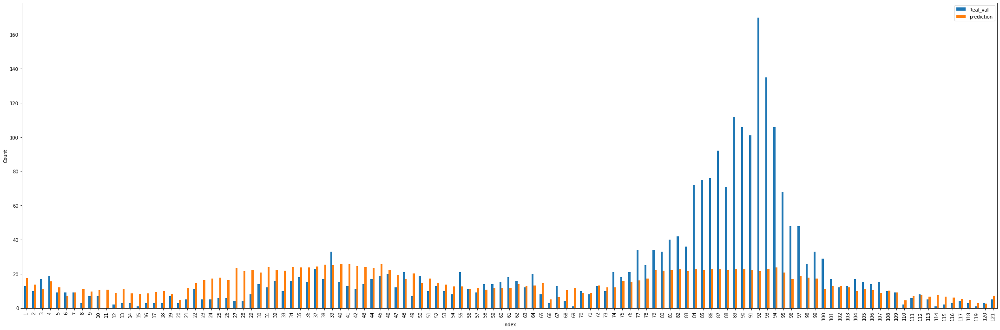

0.8
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7', 'PC1',
       'PC2'],
      dtype='object')
0.17378150938347947
13.565426630110183


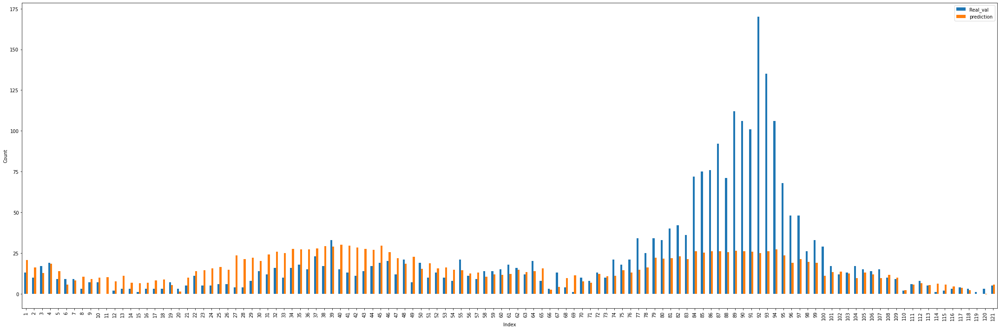

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7', 'PC1',
       'PC2'],
      dtype='object')
1.0
Selected features: Index(['year', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'PC1', 'PC2', 'PC5', 'PC6'],
      dtype='object')
0.4
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1', 'PC2', 'PC5'],
      dtype='object')
0.22422986904684283
14.145155147168609
0.1
Selected features: Index(['year'], dtype='object')
-0.07480005964336556
15.421714558555347


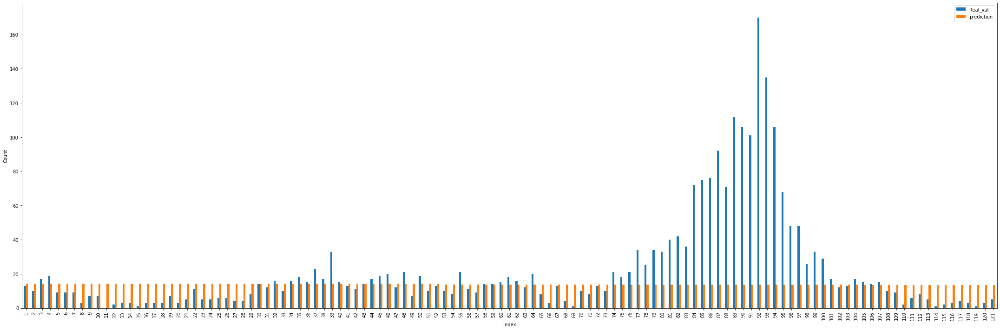

0.2
Selected features: Index(['year'], dtype='object')
-0.07712562312349736
15.421821223098048


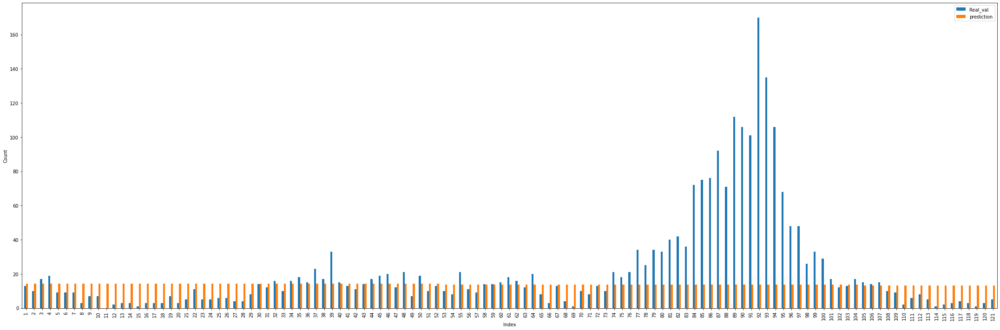

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.07622235427507706
15.43915678676489


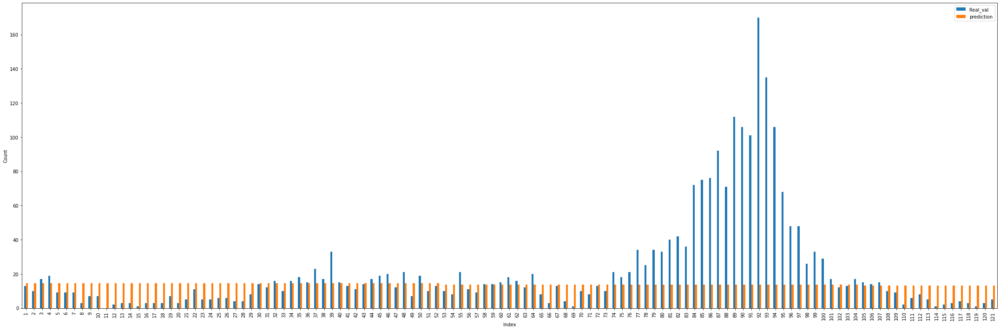

0.4
Selected features: Index(['year', 'PC1'], dtype='object')
-0.04006535655759813
15.015467139994282


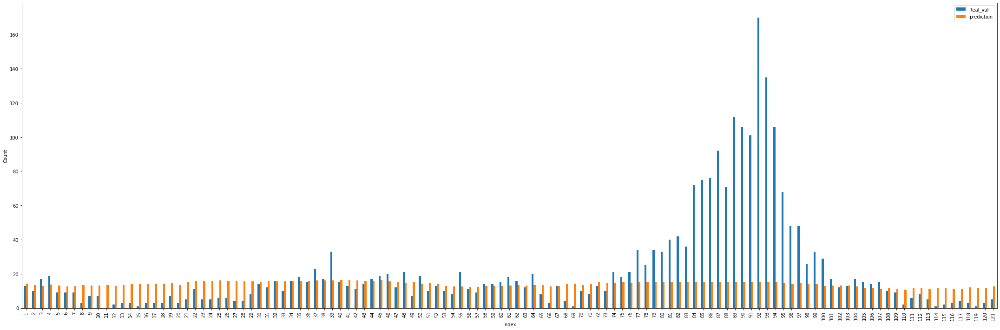

0.5
Selected features: Index(['year', 'PC1'], dtype='object')
0.0008020865530267152
14.668388064923578


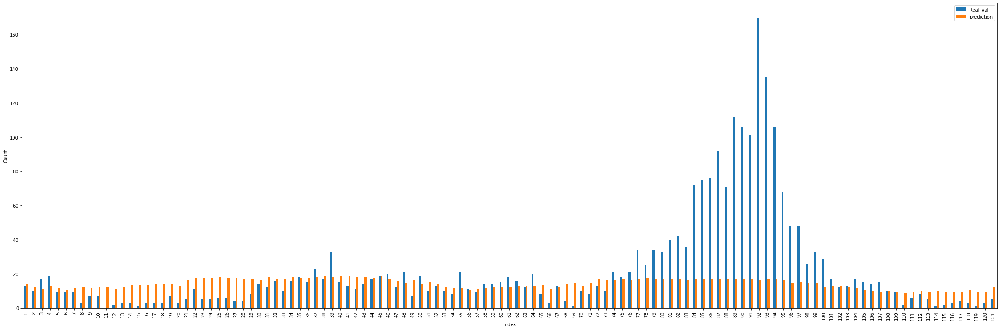

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
0.036370169466071745
14.529931636824843


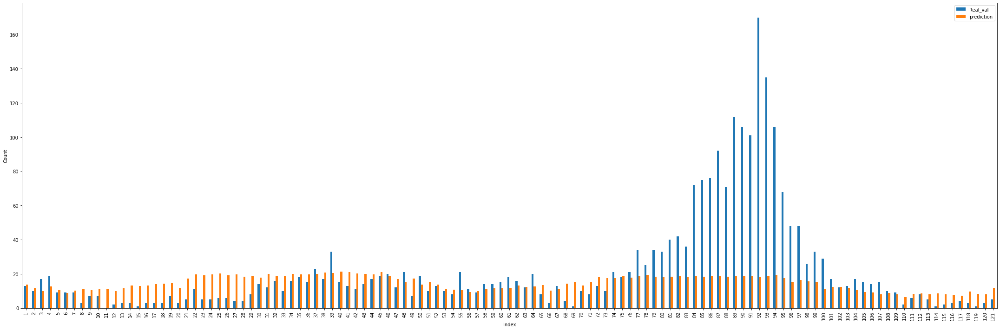

0.7000000000000001
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.09222644282464432
14.049437983117631


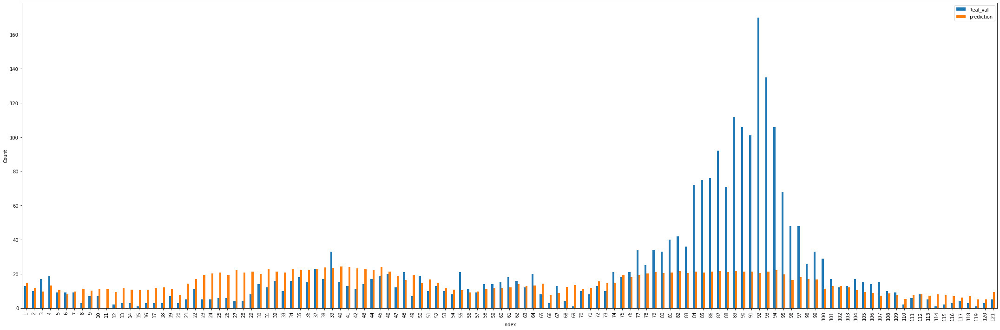

0.8
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.1476743598308724
13.616339842482224


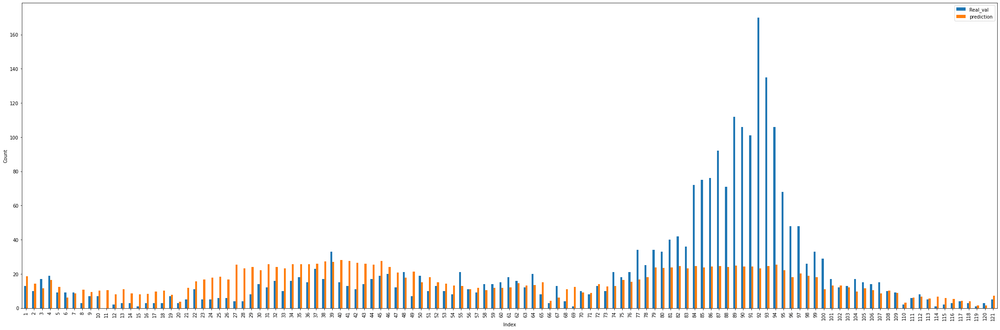

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7', 'PC1',
       'PC2'],
      dtype='object')
1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1', 'PC2', 'PC5'],
      dtype='object')
0.5
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1', 'PC2'],
      dtype='object')
0.22029803189741204
13.998396406439046
0.1
Selected features: Index(['year'], dtype='object')
-0.06028818834639793
15.526220513574634


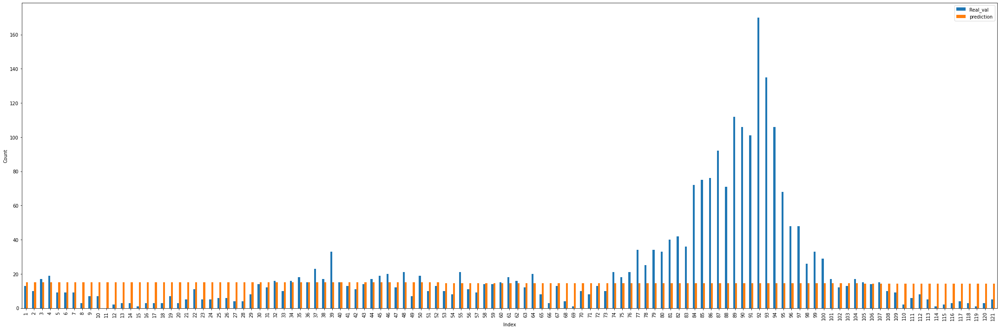

0.2
Selected features: Index(['year'], dtype='object')
-0.06594433488163798
15.49170446390478


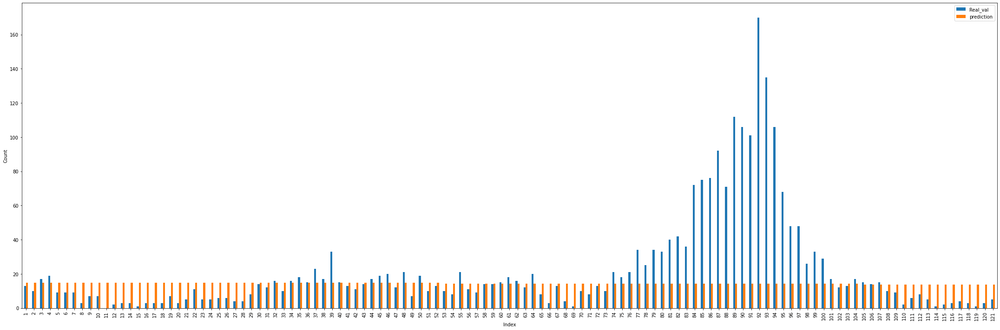

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.0677186044728133
15.49225615578249


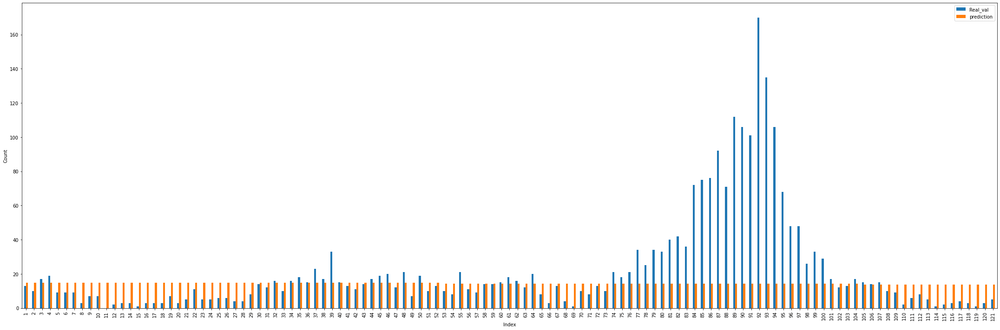

0.4
Selected features: Index(['year', 'PC1'], dtype='object')
-0.05939197706480481
15.418051471322922


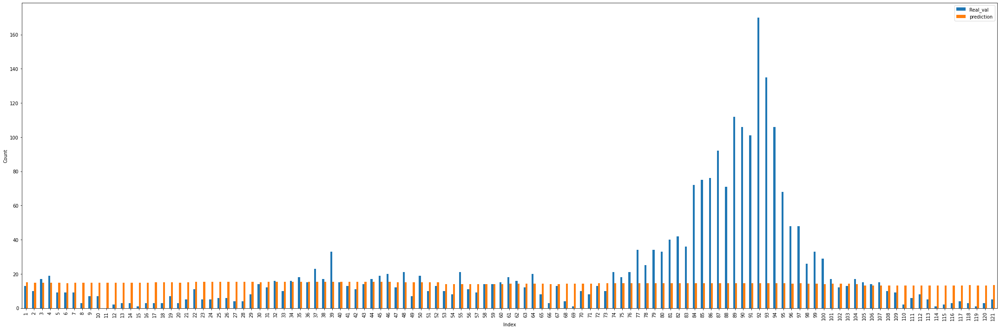

0.5
Selected features: Index(['year', 'PC1'], dtype='object')
-0.01157660194248411
14.898623555747196


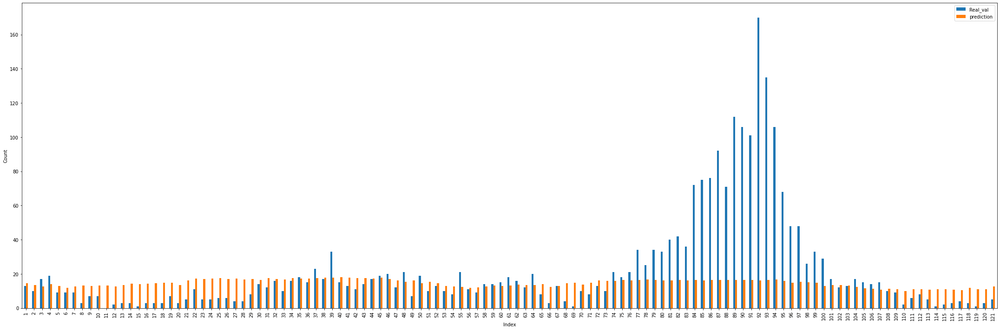

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
0.02848565624642785
14.633173418410806


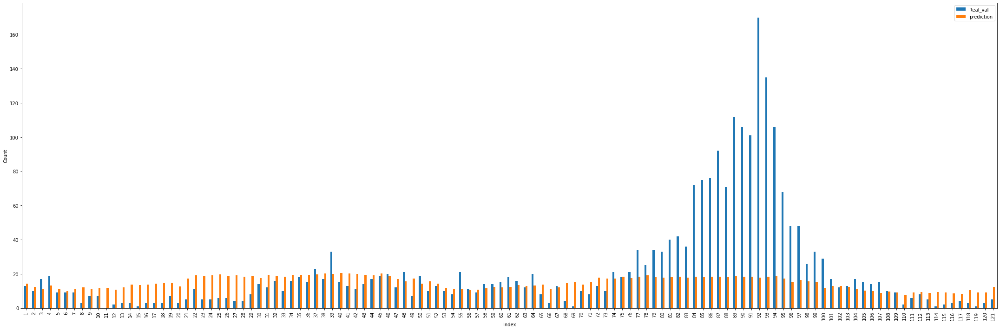

0.7000000000000001
Selected features: Index(['year', 'month_4', 'month_5', 'PC1'], dtype='object')
0.06644912039390505
14.470983213669657


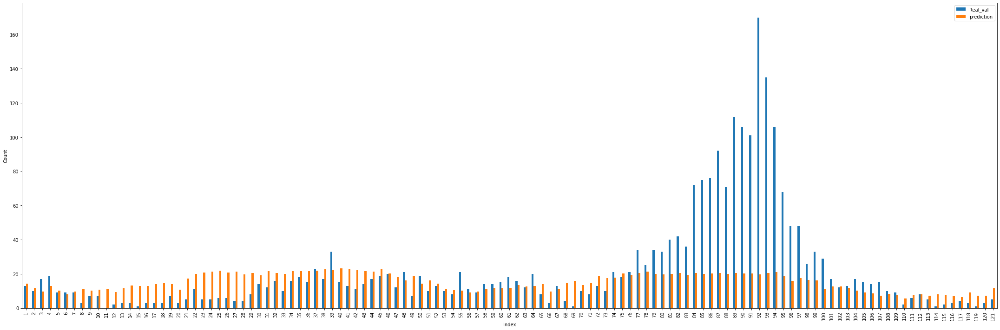

0.8
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.12855851658547568
13.904567869198598


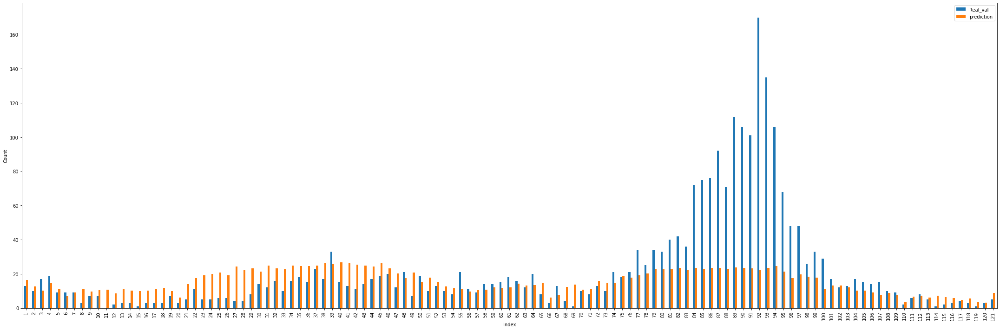

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7', 'PC1'], dtype='object')
0.18058875273636188
13.656316474692572


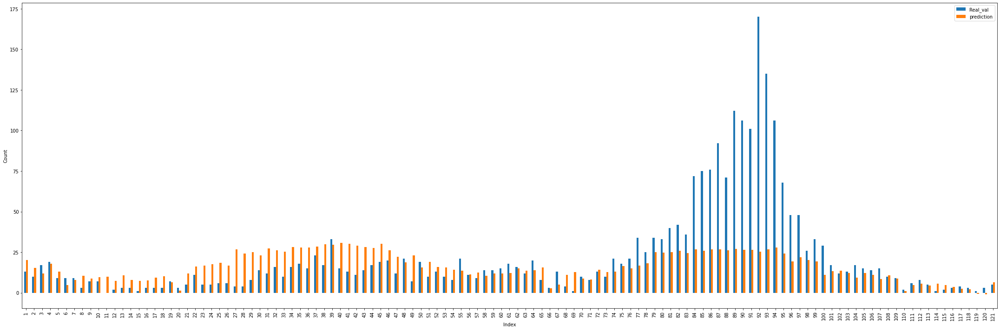

1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1', 'PC2'],
      dtype='object')
0.6
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1'],
      dtype='object')
0.21210365437315593
13.90534838362425
0.1
Selected features: Index(['year'], dtype='object')
-0.04665552569762599
15.693012959596414


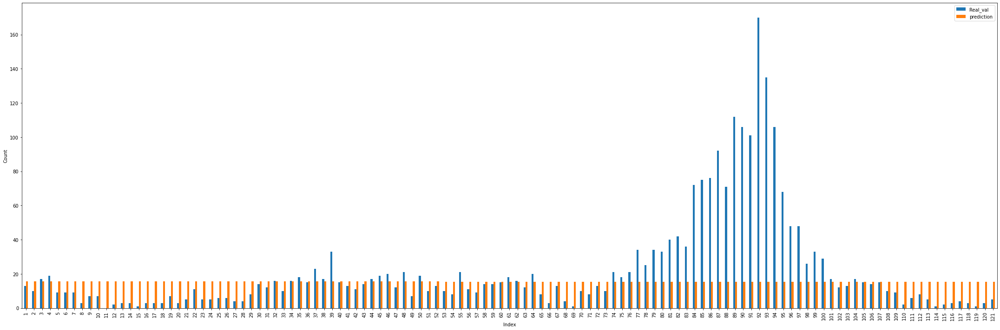

0.2
Selected features: Index(['year'], dtype='object')
-0.05527741692547594
15.595420297886813


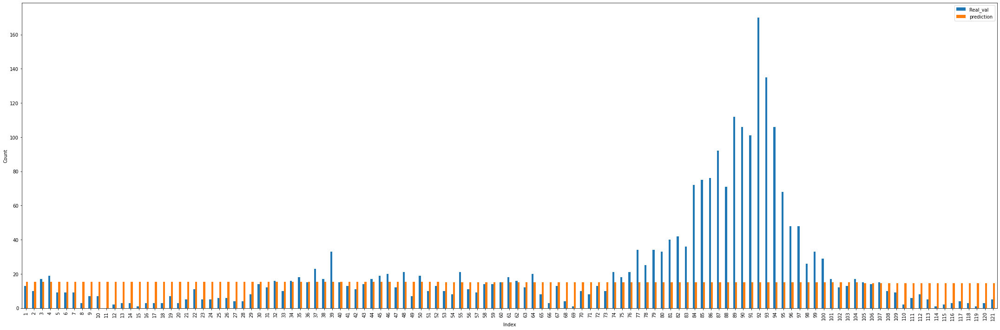

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.05953392432081195
15.566692388723537


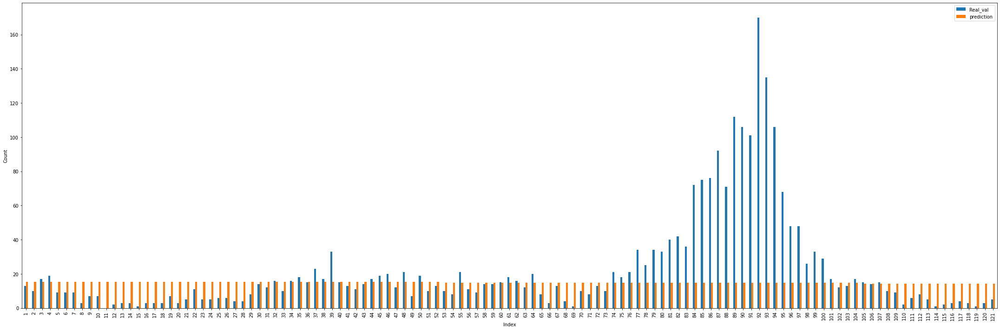

0.4
Selected features: Index(['year'], dtype='object')
-0.06025535278487282
15.57715073353828


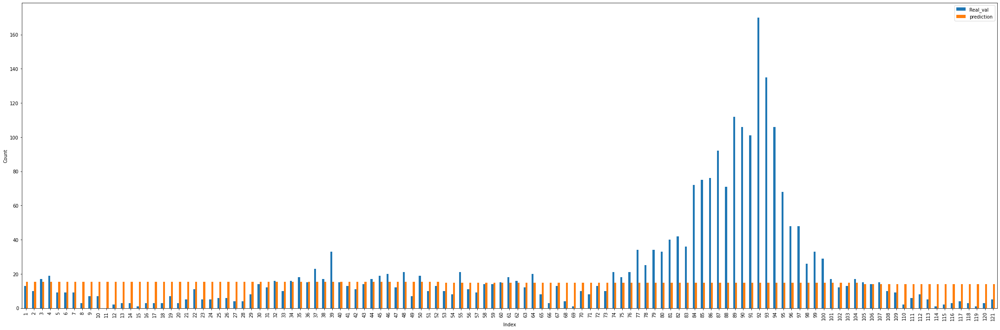

0.5
Selected features: Index(['year', 'PC1'], dtype='object')
-0.025494890521898572
15.169817122400964


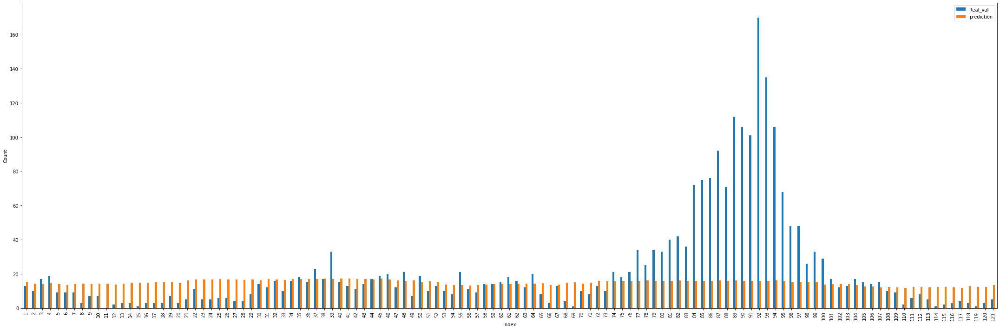

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
0.019777955271046865
14.775130054233442


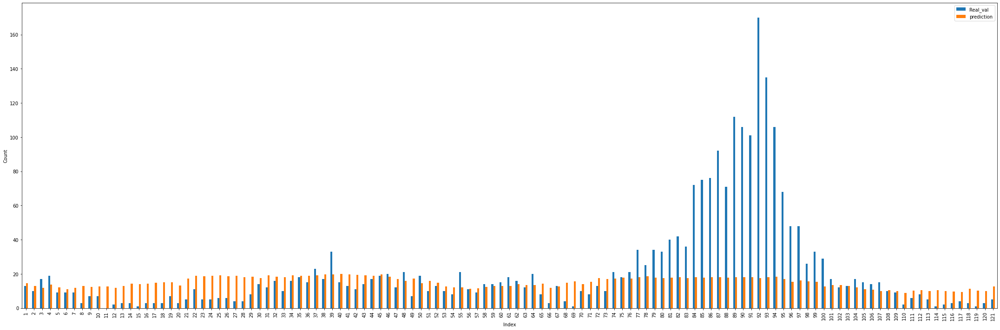

0.7000000000000001
Selected features: Index(['year', 'PC1'], dtype='object')
0.05730089838703989
14.605972328823055


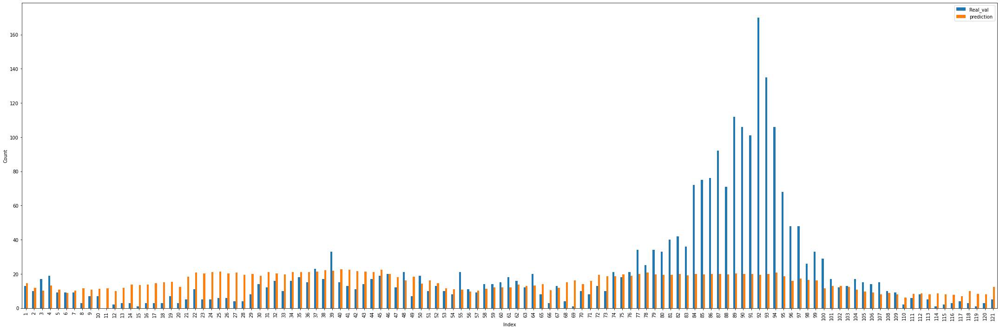

0.8
Selected features: Index(['year', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.10556161425125465
14.270734582024957


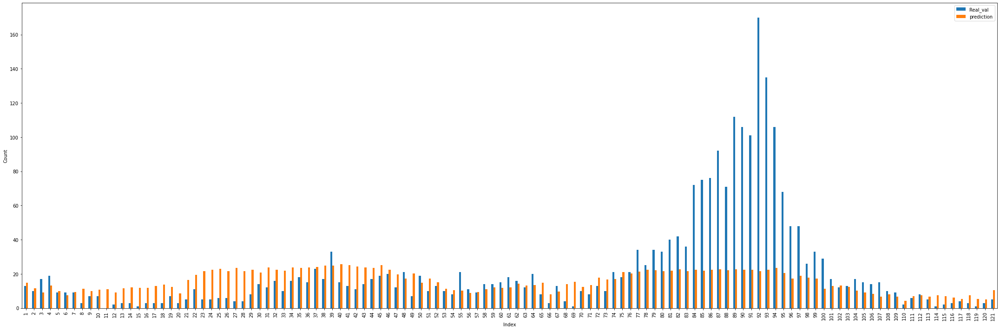

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.16553610551035391
13.742923504686507


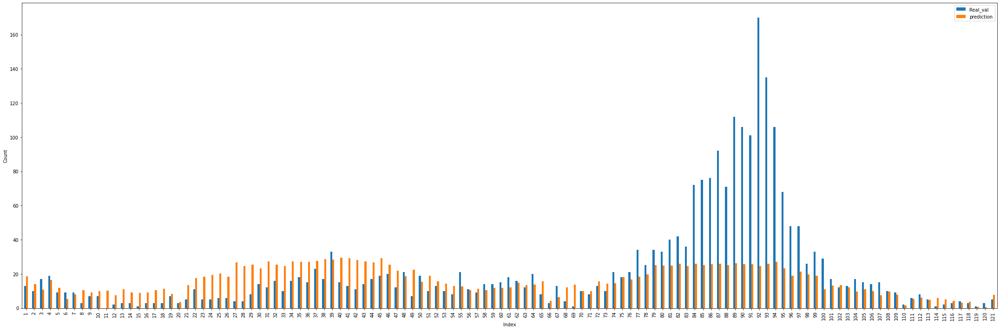

1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1'],
      dtype='object')
0.7000000000000001
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1'],
      dtype='object')
0.1995524253293578
13.8667670963627
0.1
Selected features: Index(['year'], dtype='object')
-0.03410276852528793
15.921788229142932


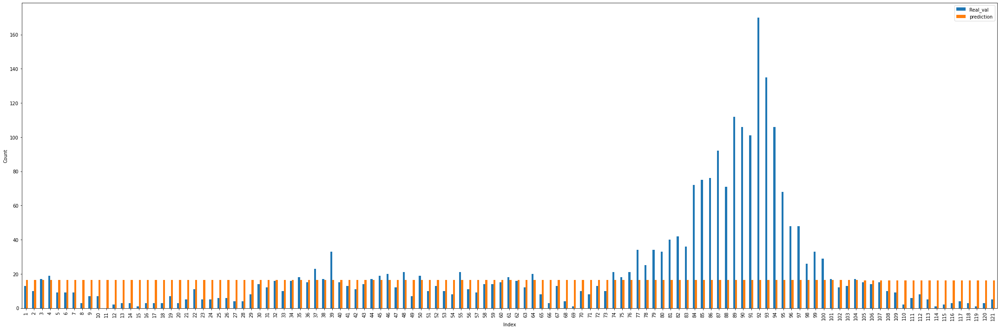

0.2
Selected features: Index(['year'], dtype='object')
-0.04520153286150763
15.72963812492022


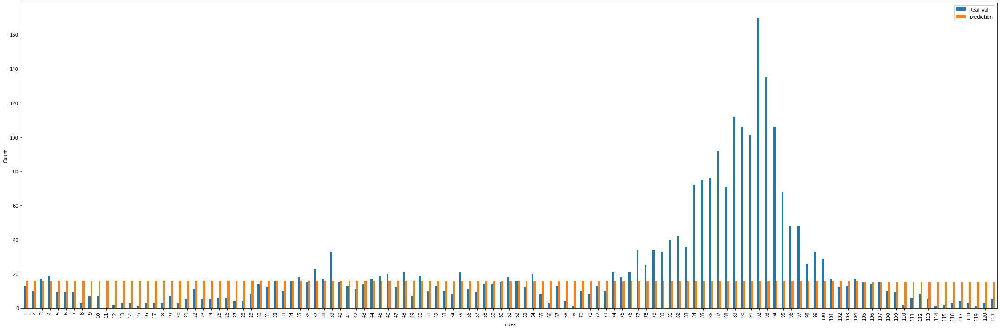

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.05169836514933435
15.65604254224241


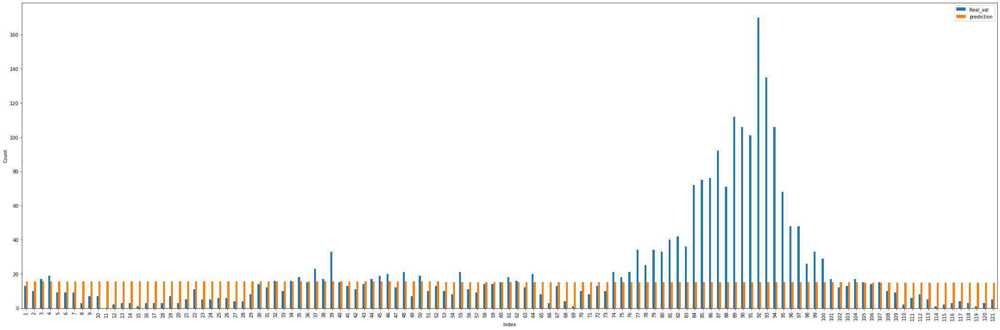

0.4
Selected features: Index(['year'], dtype='object')
-0.05429250584301659
15.643157089574963


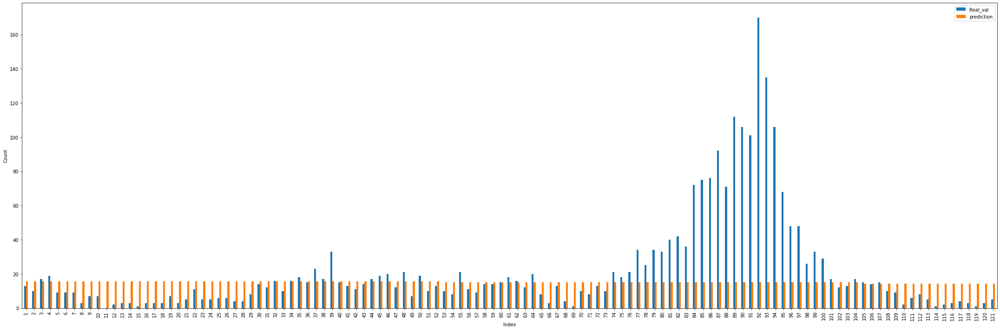

0.5
Selected features: Index(['year', 'PC1'], dtype='object')
-0.0411120984645299
15.49093421083201


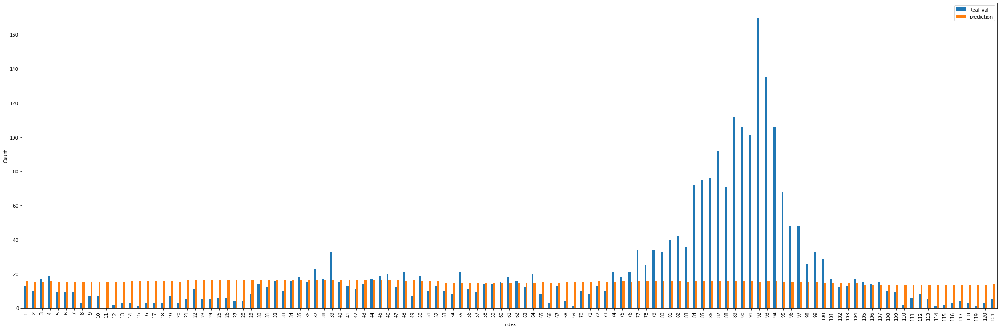

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
0.010191365031143818
14.957708891997274


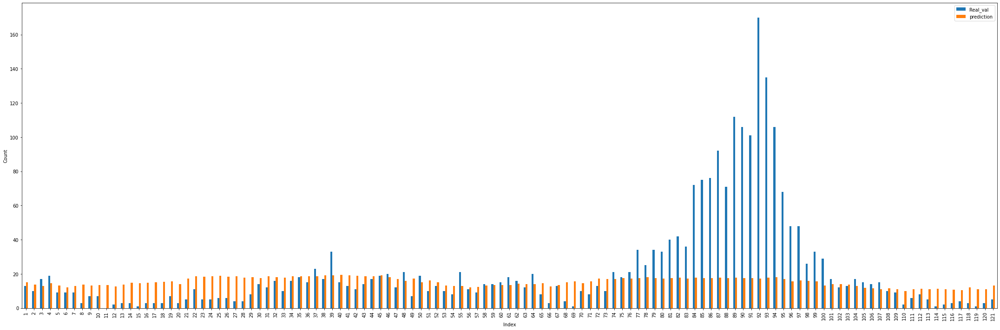

0.7000000000000001
Selected features: Index(['year', 'PC1'], dtype='object')
0.05149346329692994
14.685720430567079


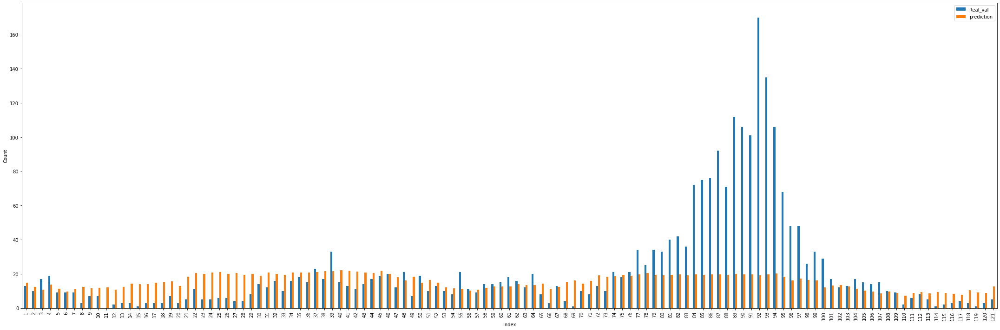

0.8
Selected features: Index(['year', 'month_5', 'PC1'], dtype='object')
0.08742520841072787
14.572797618318269


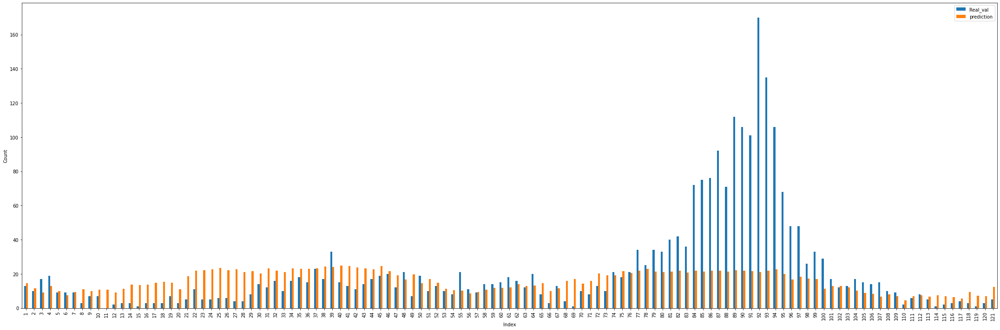

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.15147411853066817
13.97331193701818


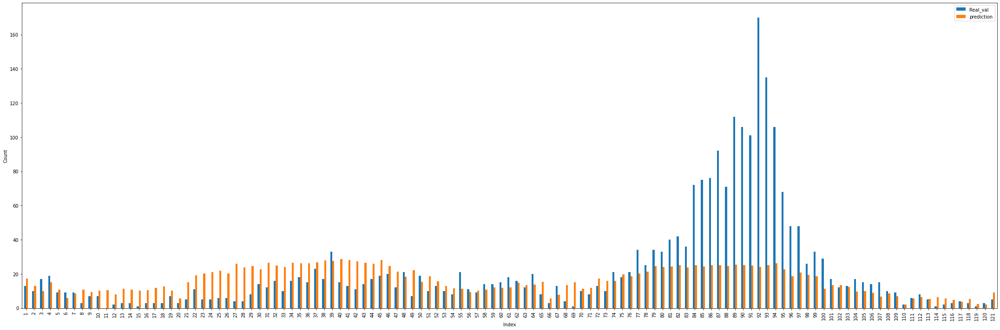

1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'PC1'],
      dtype='object')
0.8
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.19010830201854956
13.898882863945136
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index(['year'], dtype='object')
-0.03579877694903355
15.90759207042997


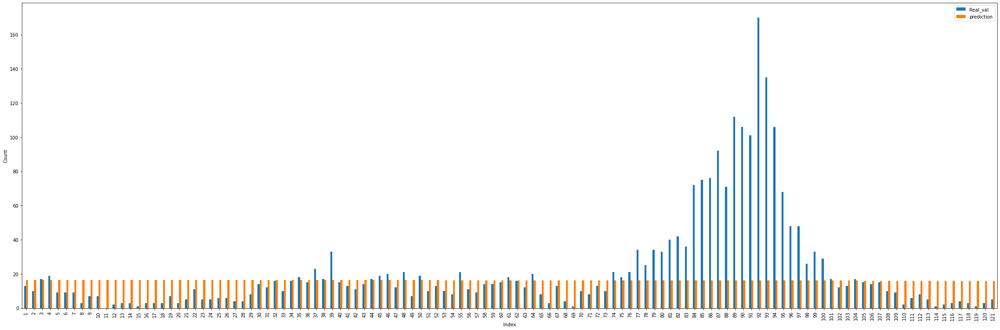

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.04424319456308856
15.766061994149045


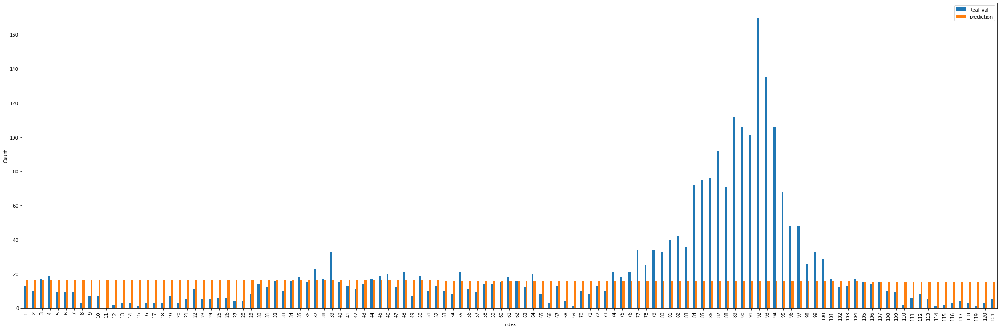

0.4
Selected features: Index(['year'], dtype='object')
-0.04855667363920402
15.717639819139224


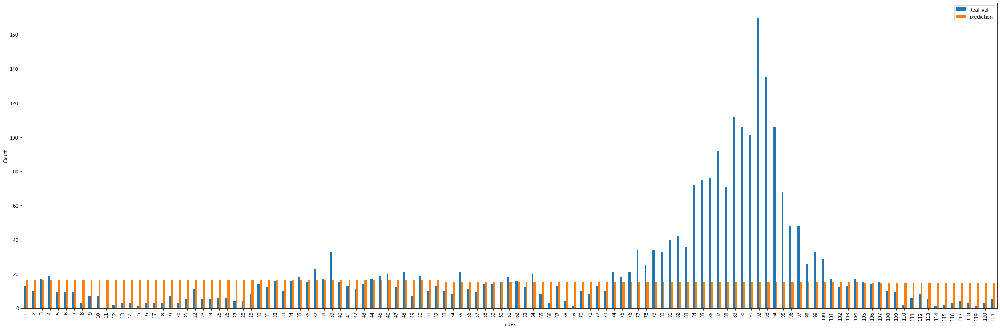

0.5
Selected features: Index(['year'], dtype='object')
-0.049463400903949184
15.730756570797054


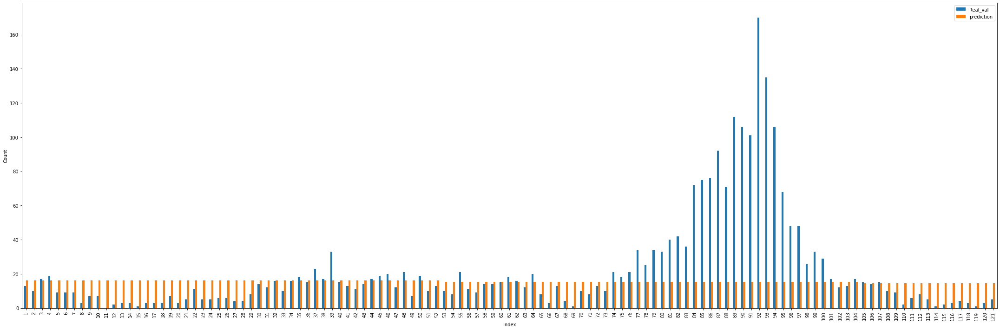

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
-0.0003305370628750026
15.158515430981737


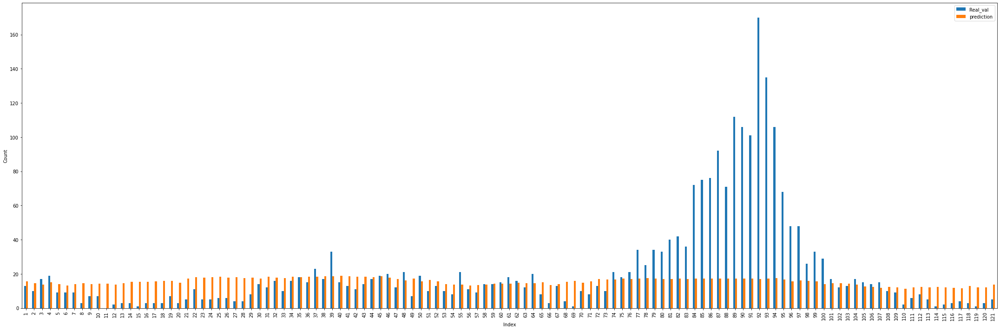

0.7000000000000001
Selected features: Index(['year', 'PC1'], dtype='object')
0.04518483611153956
14.790192471657432


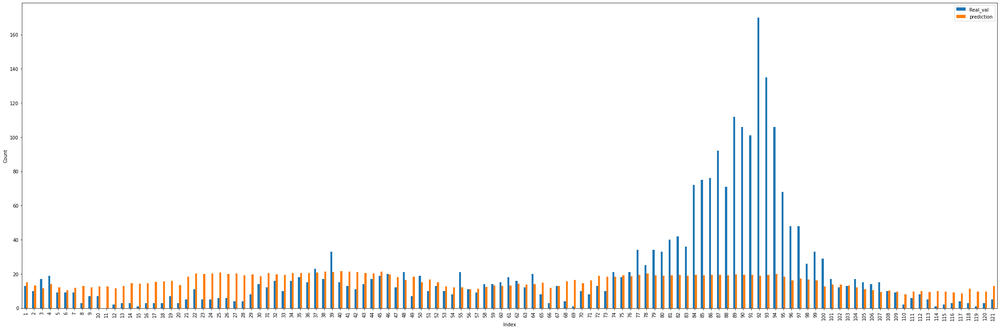

0.8
Selected features: Index(['year', 'PC1'], dtype='object')
0.08158816930404611
14.645434170880755


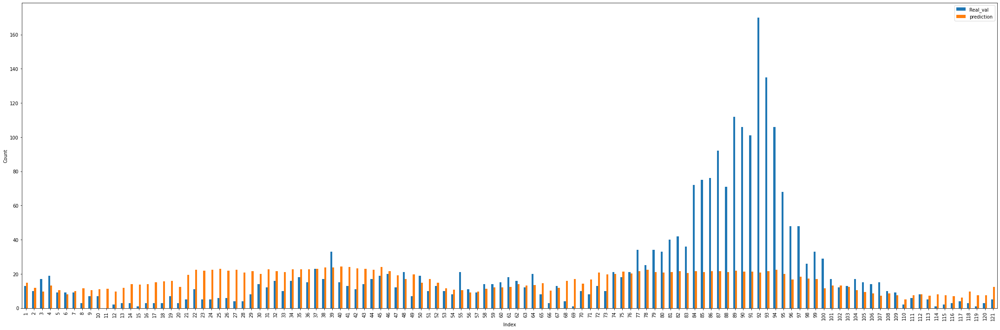

0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.13508835098167382
14.23801535636522


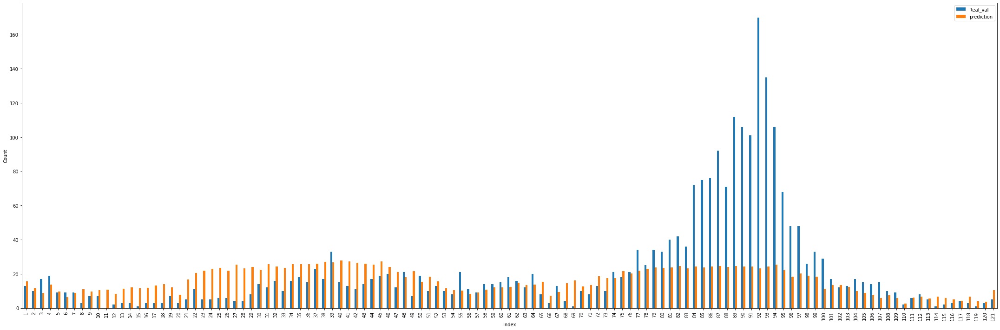

1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.9
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.18117073933286298
14.003118347451611
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index(['year'], dtype='object')
-0.02715695816170771
16.106461325389972


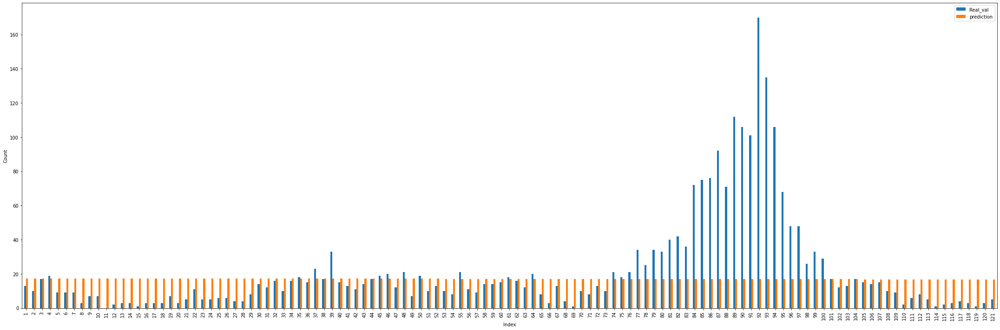

0.30000000000000004
Selected features: Index(['year'], dtype='object')
-0.037200927071870504
15.90088466499121


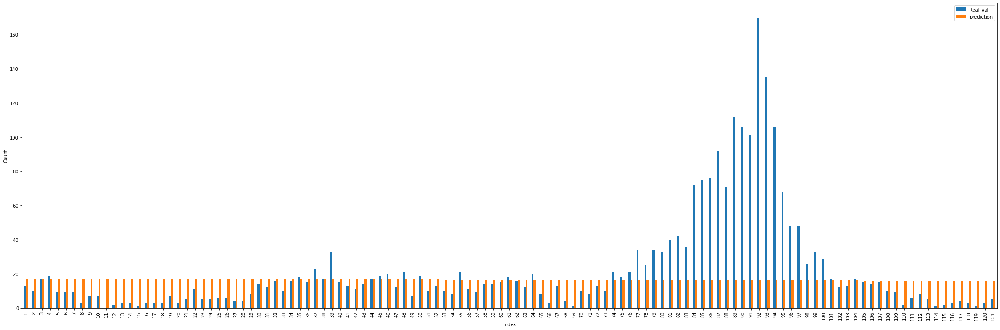

0.4
Selected features: Index(['year'], dtype='object')
-0.0430601023220516
15.809556687436894


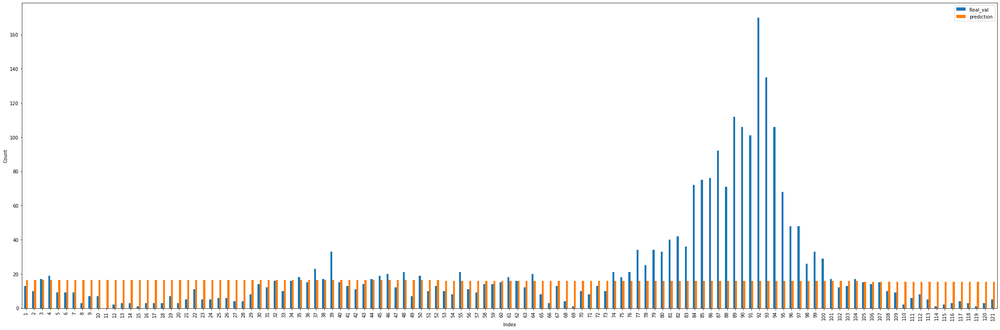

0.5
Selected features: Index(['year'], dtype='object')
-0.04529498792702302
15.793880006899494


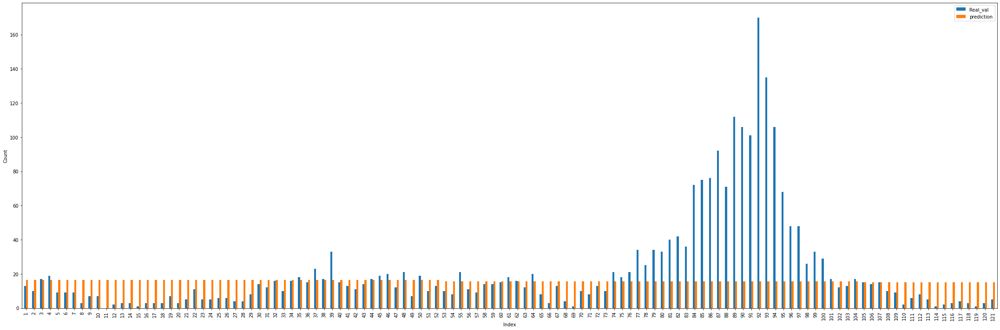

0.6
Selected features: Index(['year', 'PC1'], dtype='object')
-0.011844883507871495
15.38957731089091


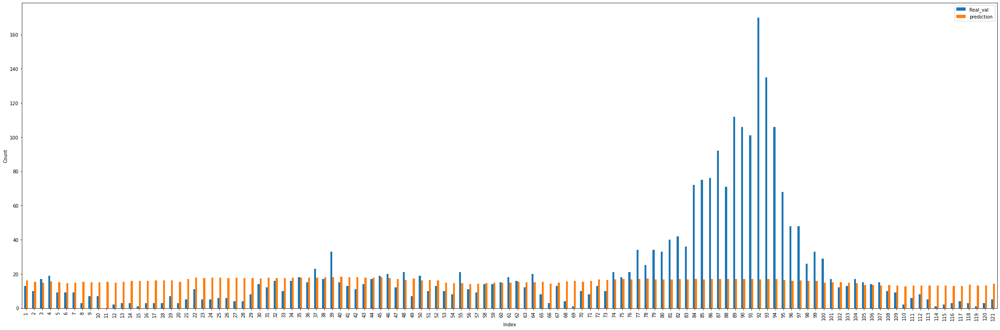

0.7000000000000001
Selected features: Index(['year', 'PC1'], dtype='object')
0.03835511751015053
14.927580701302462


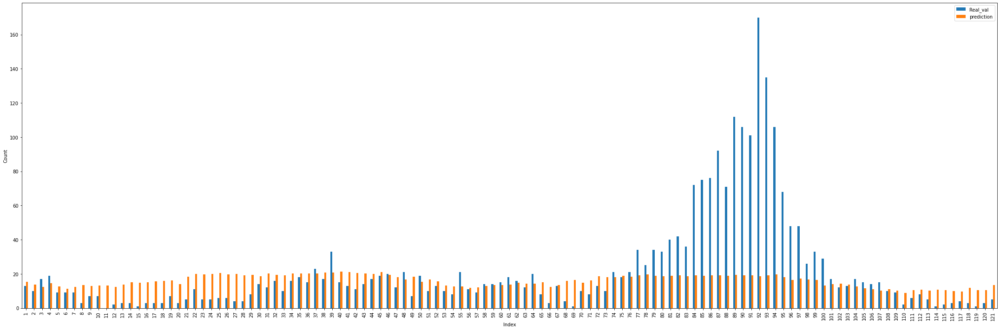

0.8
Selected features: Index(['year', 'PC1'], dtype='object')
0.07767384990800086
14.697914692390992


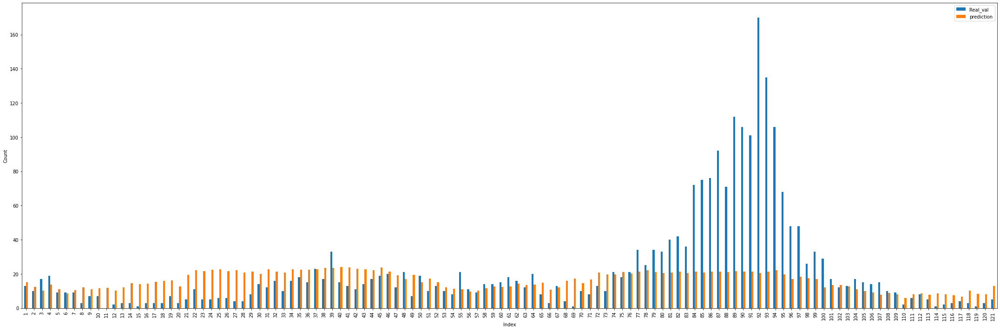

0.9
Selected features: Index(['year', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.11667283089795055
14.526255017372717


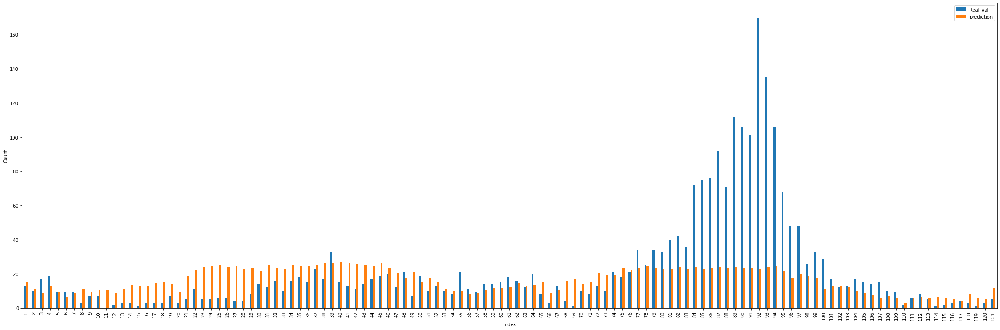

1.0
Selected features: Index(['year', 'month_1', 'month_4', 'month_5', 'month_6', 'PC1'], dtype='object')
0.18117073933286298
14.003118347451611


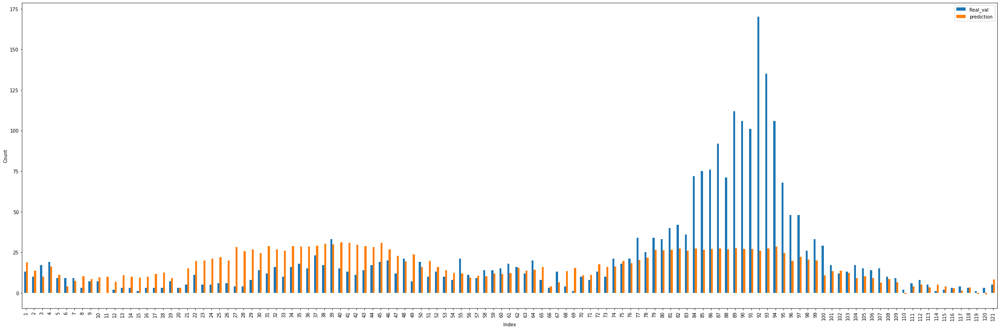

In [47]:
for lasso_alpha in np.arange(0.1, 1.0, 0.1):
    print(lasso_alpha)
    modeling_linear_pca(train_sj,validate_sj,Lasso(alpha=lasso_alpha))

In [48]:
'''
PCA does not improve performance
'''

'\nPCA does not improve performance\n'

In [49]:
def modeling_nonlinear(train_x,validate_x,model):
    
    train = train_x.copy()
    validate = validate_x.copy()
    
    scaler = MinMaxScaler()
    scaler.fit(train[numerical_cols])
    train[numerical_cols] = scaler.transform(train[numerical_cols])

    validate[numerical_cols] = scaler.transform(validate[numerical_cols])

    model.fit(train.drop(columns = identity_cols ),train['total_cases'])
    
    feature_names = [train.drop(columns = identity_cols).columns[i] for i in range(train.drop(columns = identity_cols ).shape[1])]
    result = permutation_importance(model,train.drop(columns = identity_cols ), 
                                train.total_cases,n_repeats = 200,
                                n_jobs=4,scoring = 'neg_mean_absolute_error')
    forest_importance = pd.DataFrame({'imp_score' : result.importances_mean, 'labels':feature_names})
    
    plt.figure(figsize=(30, 7))
    plt.plot(forest_importance.labels,forest_importance.imp_score)
    plt.show()
        
    important_cols = list(forest_importance['labels'][forest_importance.imp_score > 0])
    print('selected_feat: ', important_cols)
    
    model.fit(train[important_cols],train['total_cases'])
    predict = model.predict(validate[important_cols])
    
    print(r2_score(validate.total_cases,predict))
    print(mean_absolute_error(validate.total_cases,predict))
    
    for alpha in np.arange(0.1, 1.0, 0.1):
        
        
        print(alpha)
        
        train = train_x.copy()
        validate = validate_x.copy()
        
        train['total_cases'] = boxcox1p(train['total_cases'],alpha)
        
        

        scaler = MinMaxScaler()
        scaler.fit(train[numerical_cols])
        train[numerical_cols] = scaler.transform(train[numerical_cols])

        validate[numerical_cols] = scaler.transform(validate[numerical_cols])

        model.fit(train.drop(columns = identity_cols ),train['total_cases'])
        
        feature_names = [train.drop(columns = identity_cols).columns[i] for i in range(train.drop(columns = identity_cols ).shape[1])]
        result = permutation_importance(model,train.drop(columns = identity_cols ), 
                                train.total_cases,n_repeats = 20,random_state = 42,
                                n_jobs=4,scoring = 'neg_mean_absolute_error')
        forest_importance = pd.DataFrame({'imp_score' : result.importances_mean, 'labels':feature_names})
        
        plt.figure(figsize=(30, 7))
        plt.plot(forest_importance.labels,forest_importance.imp_score)
        plt.show()
        
        important_cols = list(forest_importance['labels'][forest_importance.imp_score > 0])
        print('selected_feat: ', important_cols)
        
        model.fit(train[important_cols],train['total_cases'])
        

        predict = model.predict(validate[important_cols])
        predict = inv_boxcox1p(predict,alpha)

        print(r2_score(validate.total_cases,predict))
        print(mean_absolute_error(validate.total_cases,predict))

        df = pd.DataFrame({
        'Real_val': validate.total_cases,
        'prediction': predict,
        'index': np.arange(1, len(predict)+1)})

        ax = df.plot(x='index', y=['Real_val', 'prediction'], kind='bar', figsize=(30, 10))
        ax.set_xlabel("Index")
        ax.set_ylabel("Count")
        plt.tight_layout()
        plt.show()

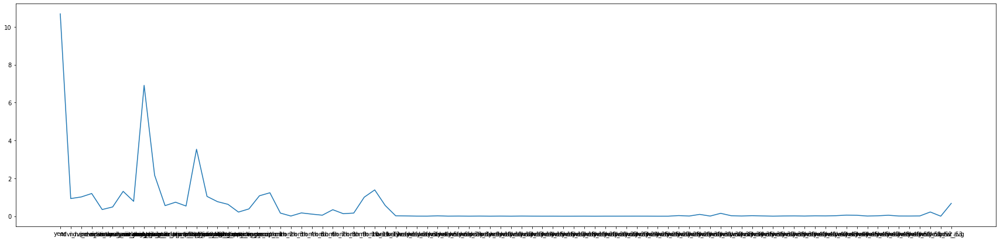

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_18', 'weekofyear_19', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 

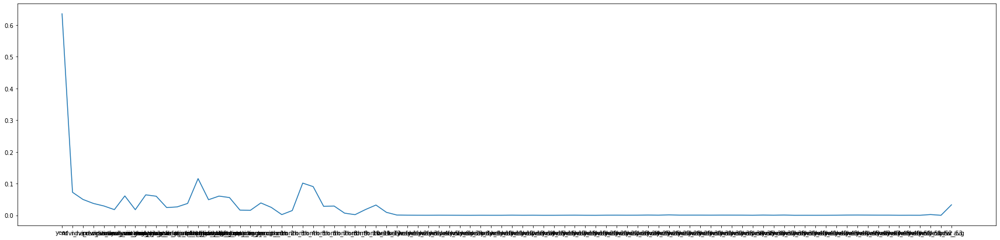

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

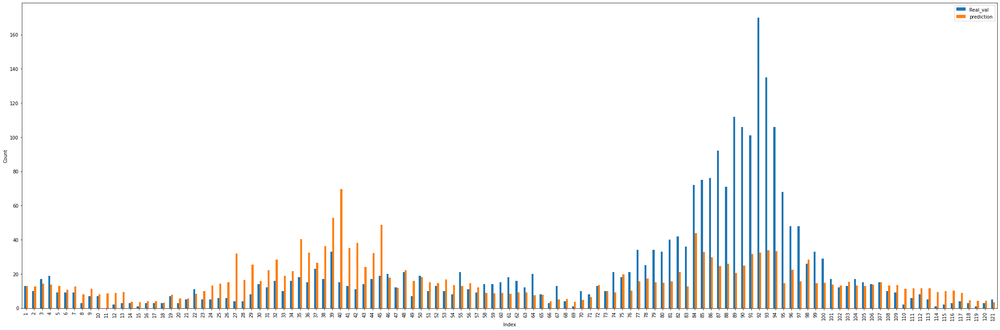

0.2


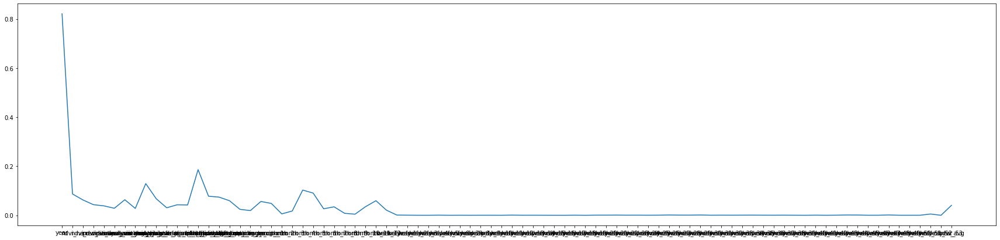

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

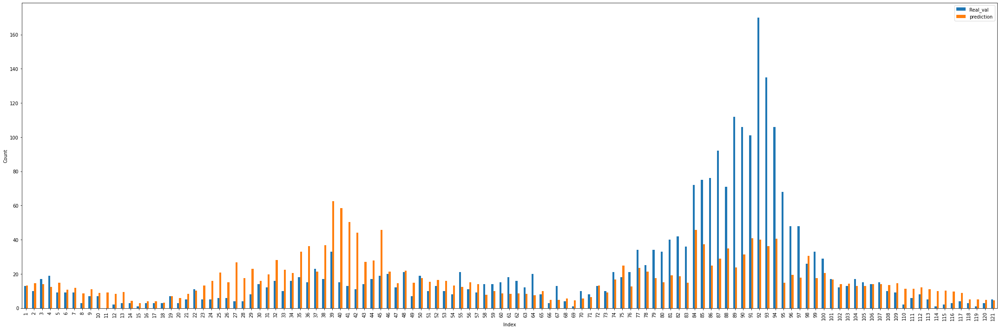

0.30000000000000004


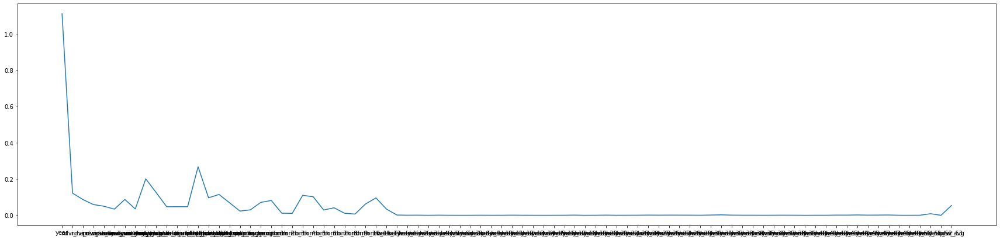

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

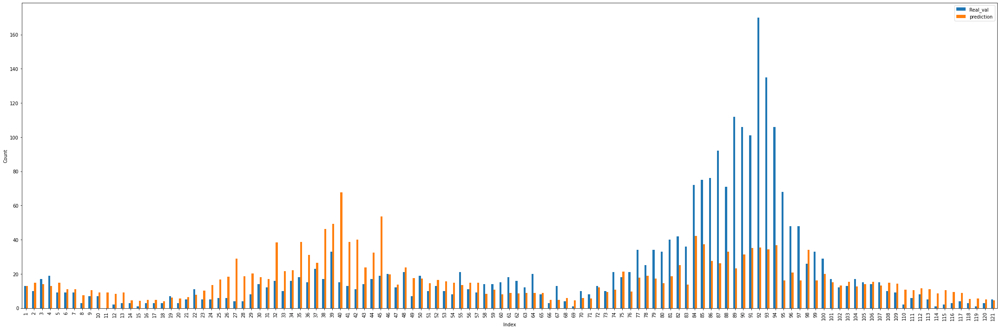

0.4


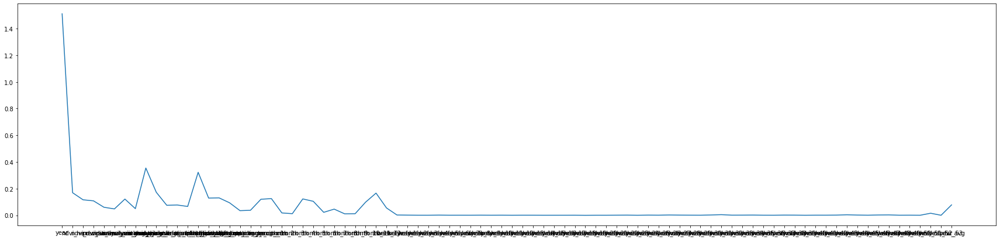

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 

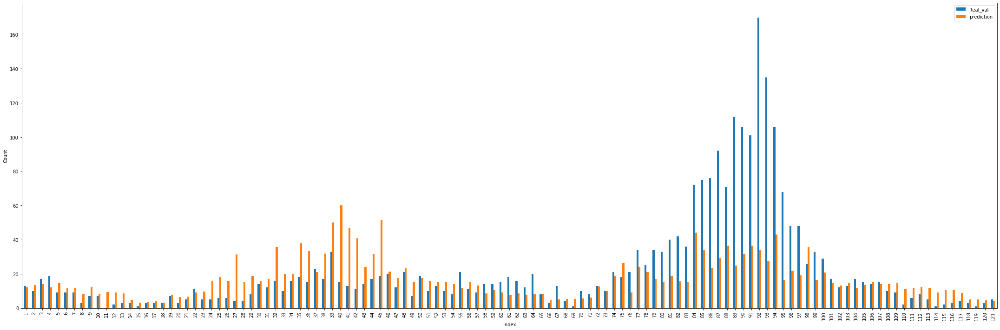

0.5


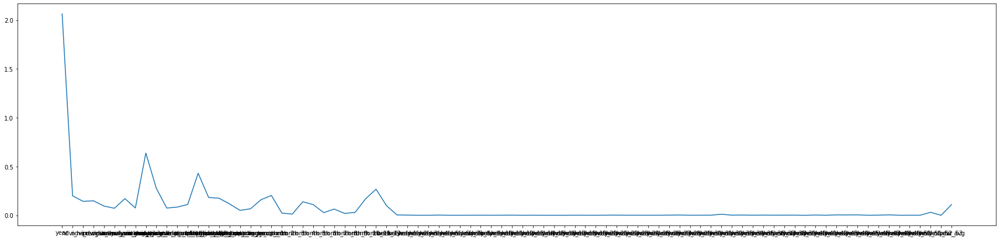

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

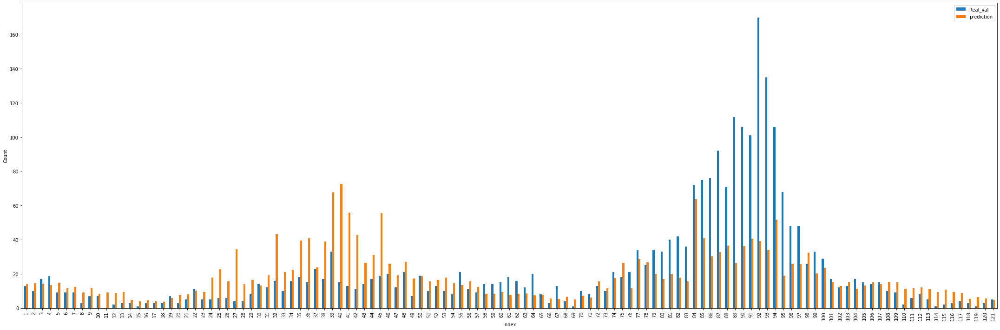

0.6


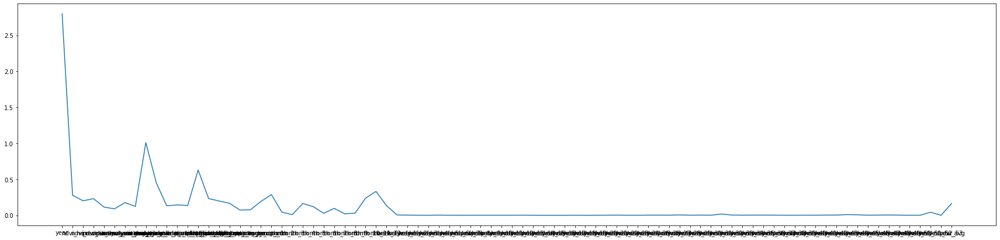

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

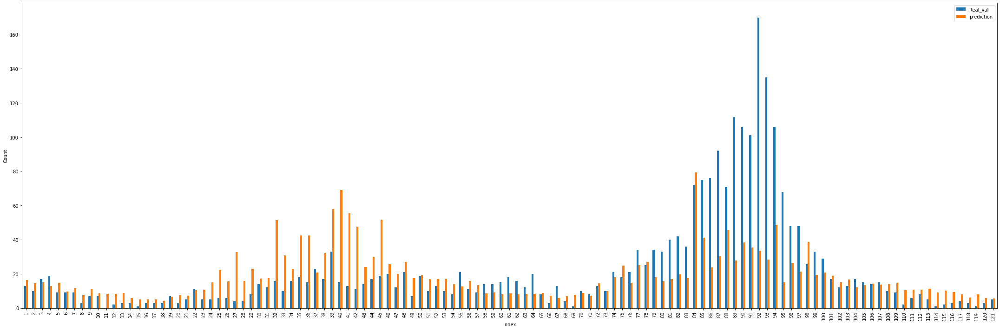

0.7000000000000001


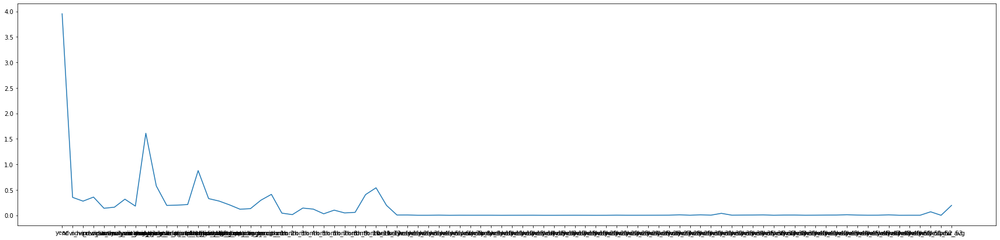

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

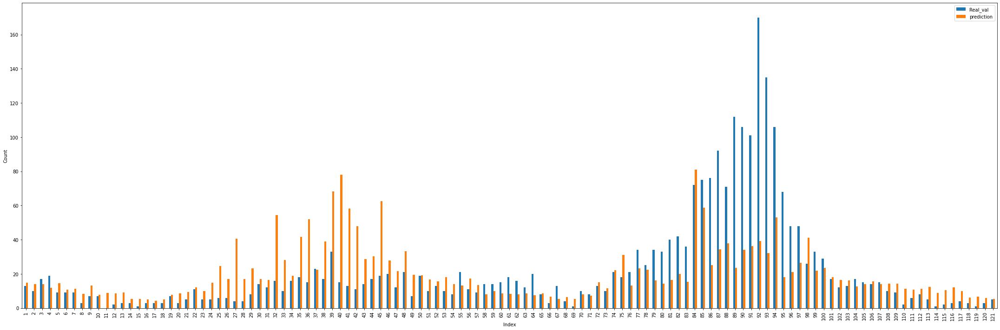

0.8


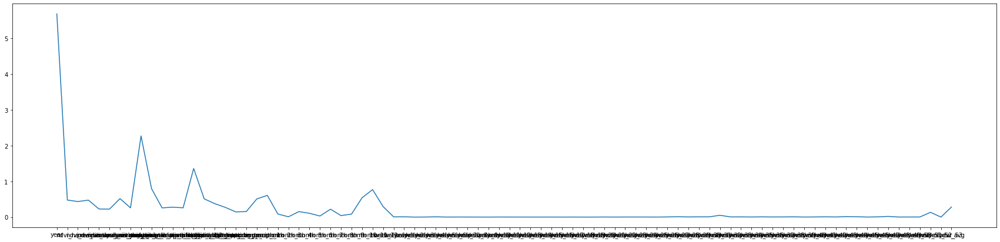

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 

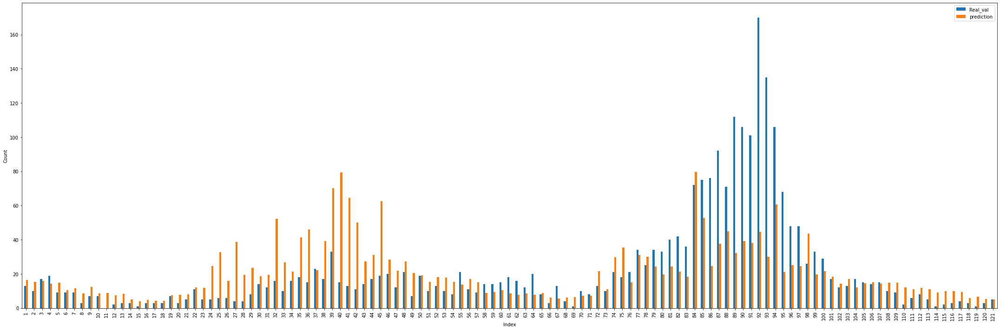

0.9


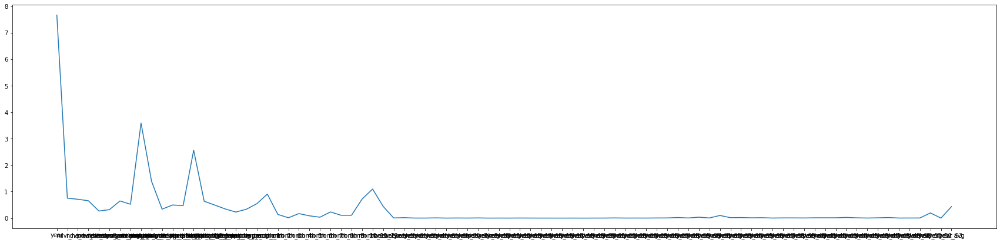

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 

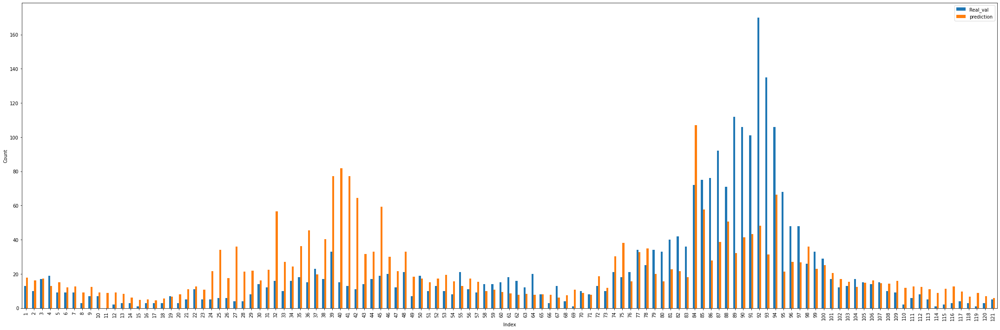

In [50]:
modeling_nonlinear(train_sj,validate_sj,RandomForestRegressor())

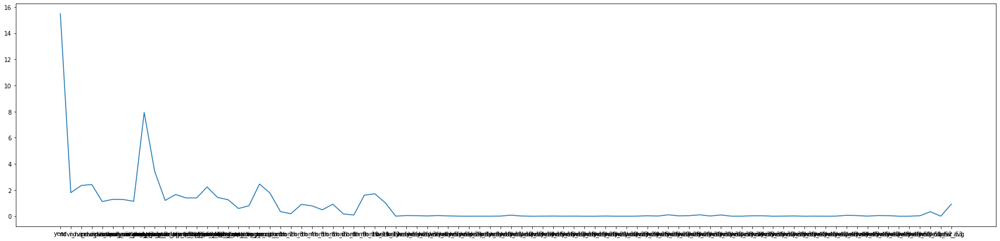

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27',

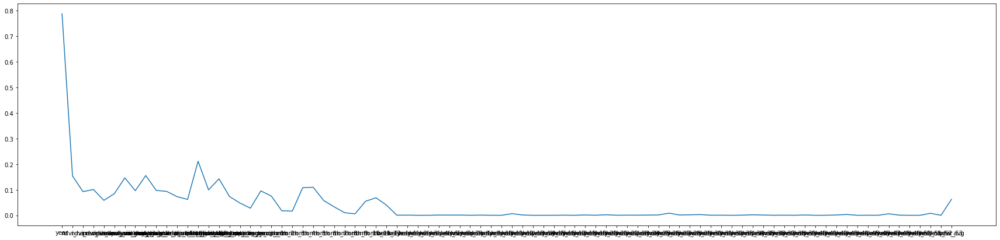

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26',

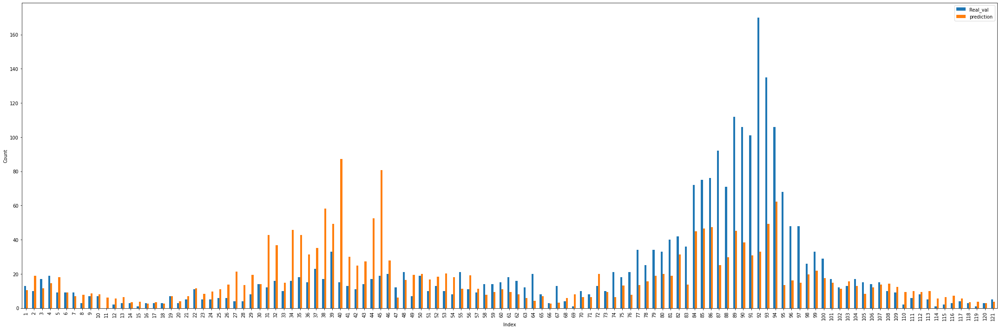

0.2


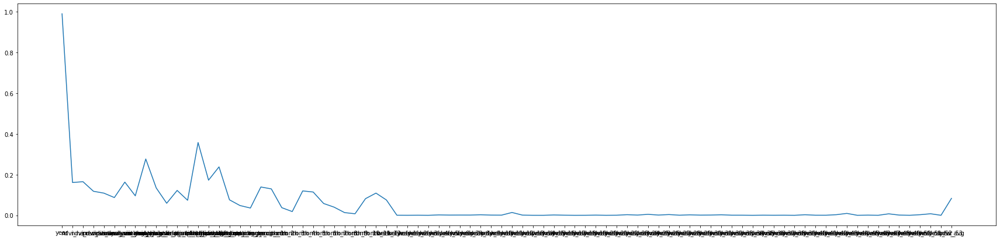

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24',

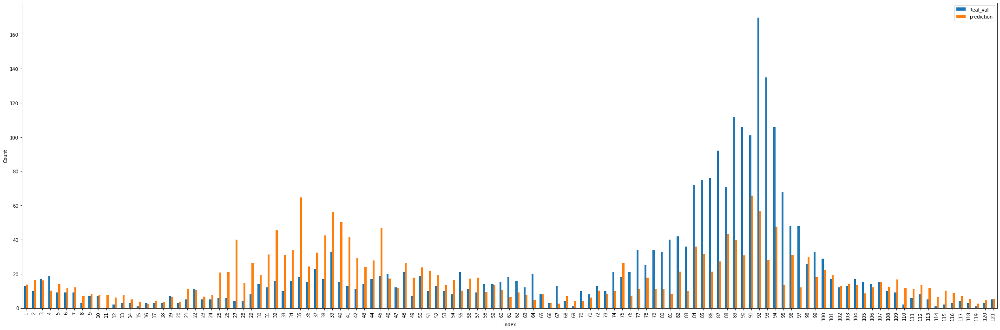

0.30000000000000004


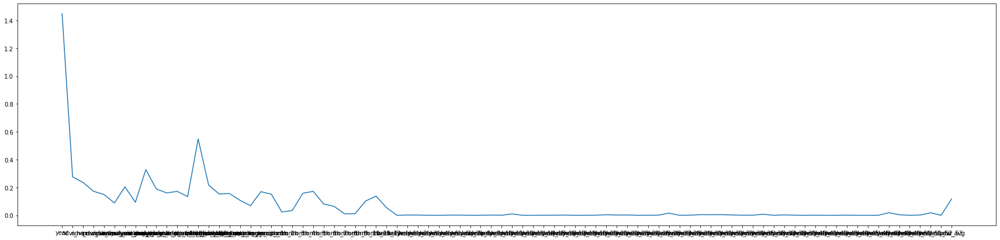

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_6', 'weekofyear_7', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26'

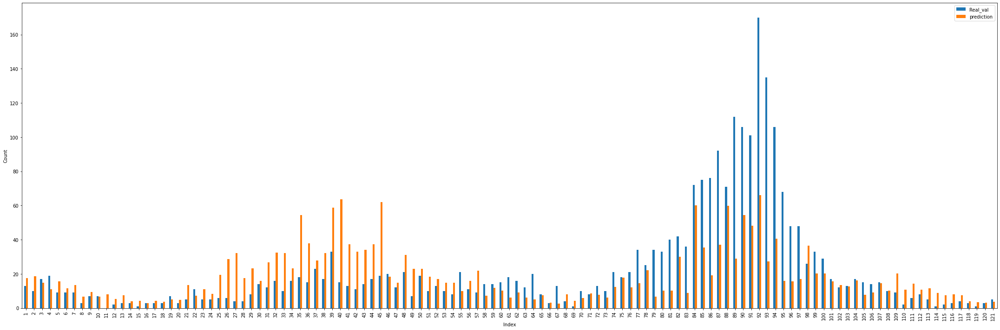

0.4


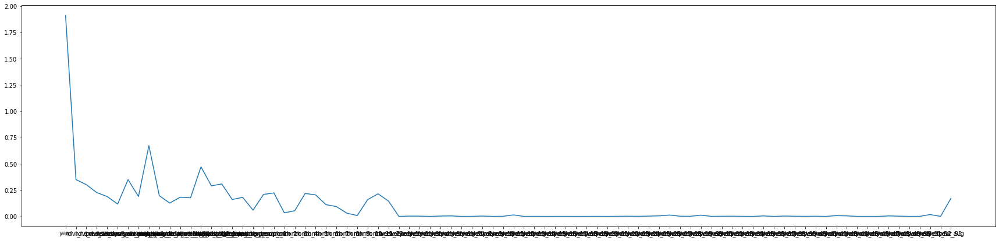

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_2', 'weekofyear_3', 'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29

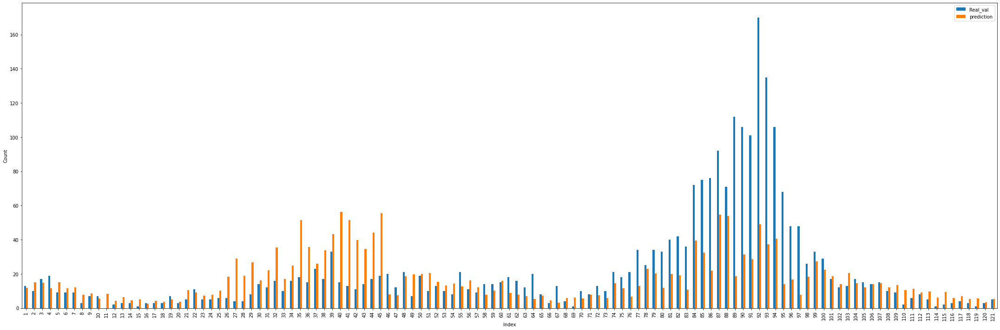

0.5


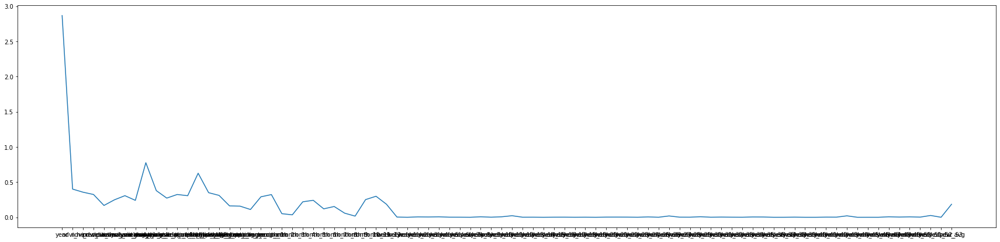

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 

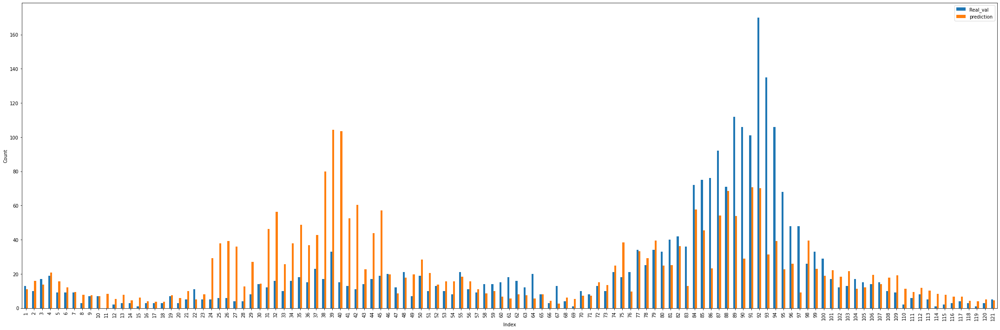

0.6


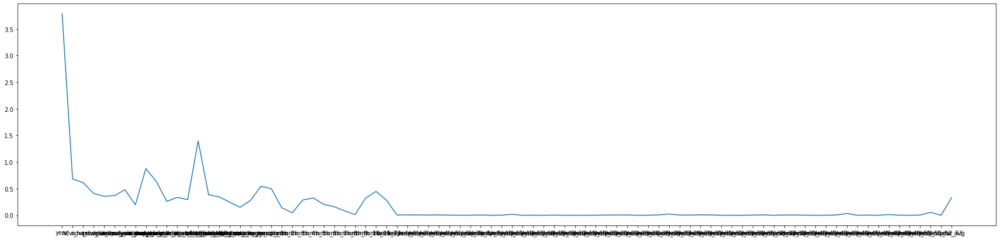

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_25', 'weekofyear_26', 

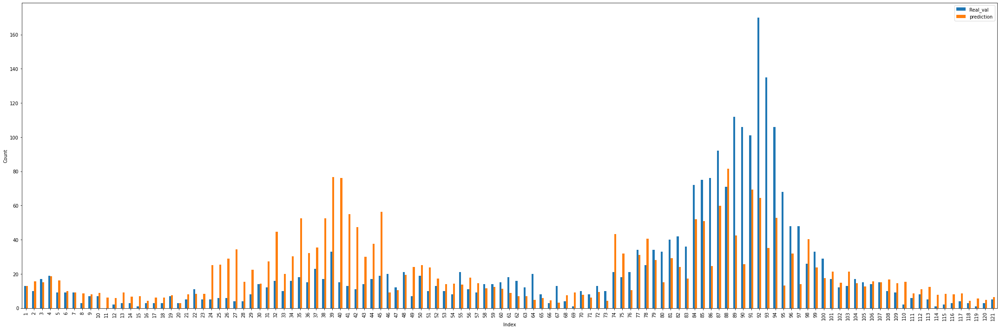

0.7000000000000001


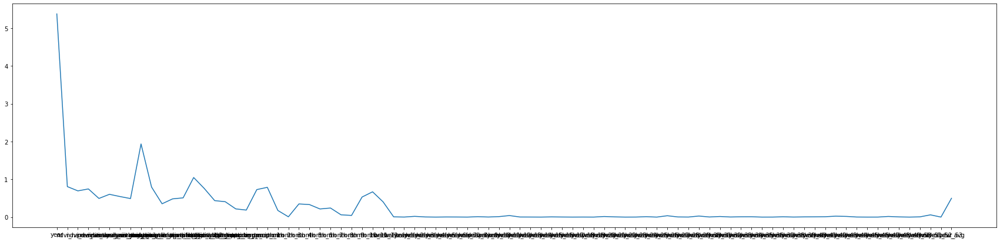

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_24', 

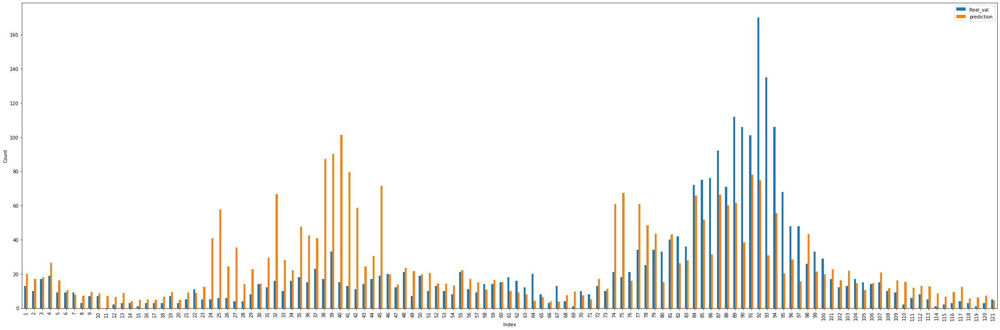

0.8


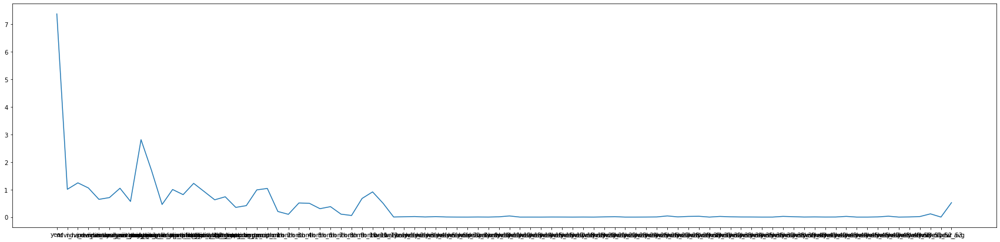

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27',

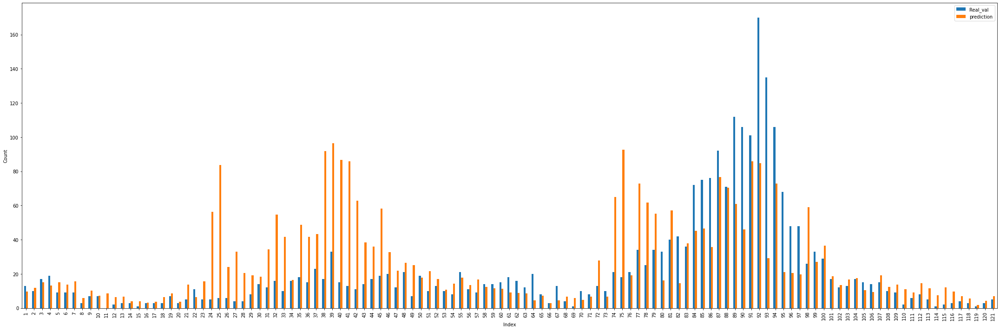

0.9


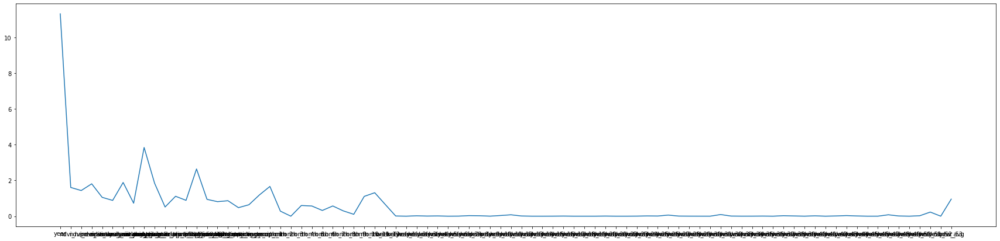

selected_feat:  ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofye

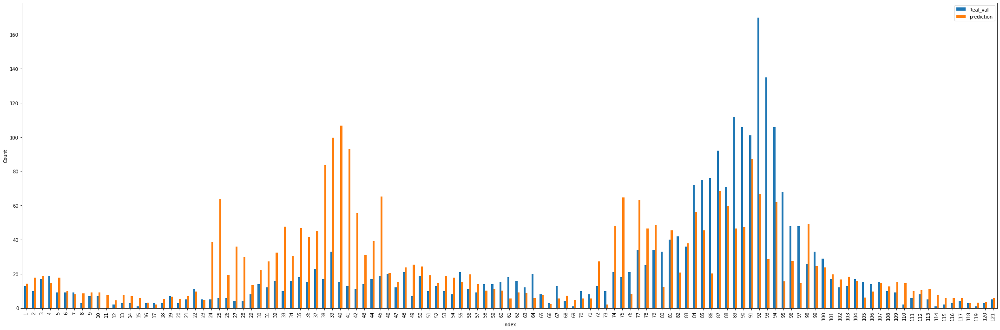

In [51]:
modeling_nonlinear(train_sj,validate_sj,xgb.XGBRegressor())

SJ
Best model = XGBRegressor



Best features = ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 'weekofyear_46', 'weekofyear_48', 'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 'weekofyear_52', 'weekofyear_53', 'ndvi_avg']



best alpha in box cox = 0.6

# IQ

In [77]:
cat_cols = ['month','weekofyear']
identity_cols = ['year','city','week_start_date','total_cases']
numerical_cols = ['year','ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm',
 'ndvi_avg']

0.1
Selected features: Index(['ndvi_sw', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_10', 'month_11', 'month_12',
       'weekofyear_42', 'weekofyear_49', 'weekofyear_50', 'weekofyear_52'],
      dtype='object')
-0.03796147489407575
5.324657790917437
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index(['reanalysis_min_air_temp_k'], dtype='object')
0.005564647857035365
5.172261457128276


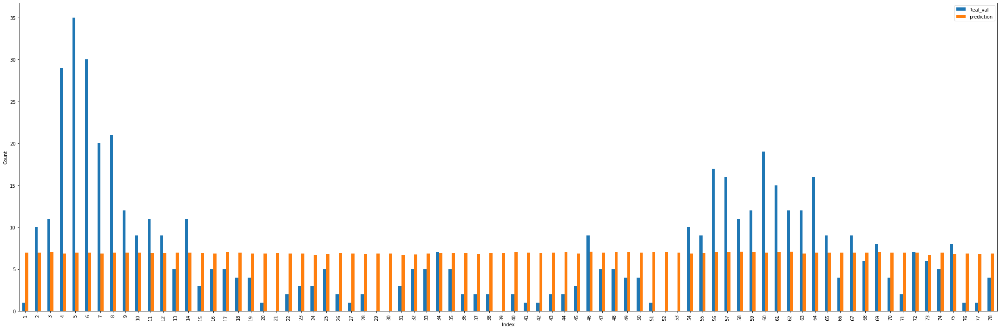

0.5
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_6', 'month_7', 'month_8',
       'month_12'],
      dtype='object')
0.0336369019427486
5.158905393724134


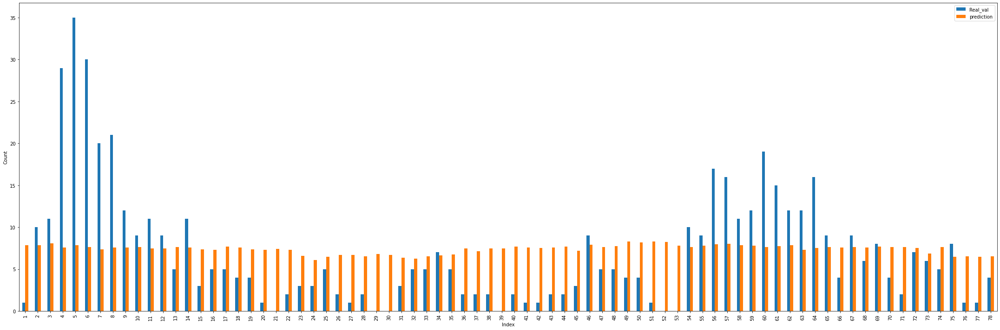

0.6
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12'],
      dtype='object')
0.05107326603595663
5.134039850971561


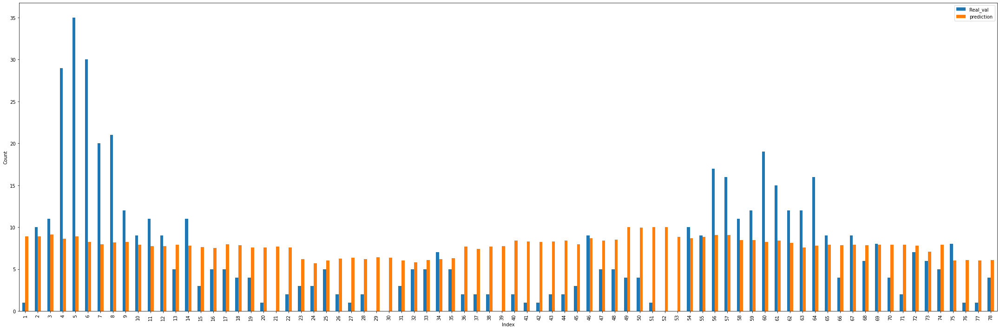

0.7000000000000001
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12'],
      dtype='object')
0.059653832943088236
5.126857855143776


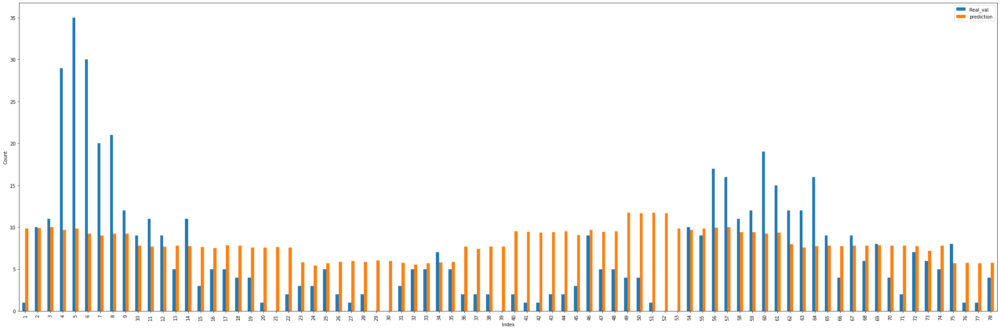

0.8
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_4', 'month_6',
       'month_7', 'month_8', 'month_10', 'month_11', 'month_12',
       'weekofyear_50'],
      dtype='object')
0.04449714424526108
5.186405390331644


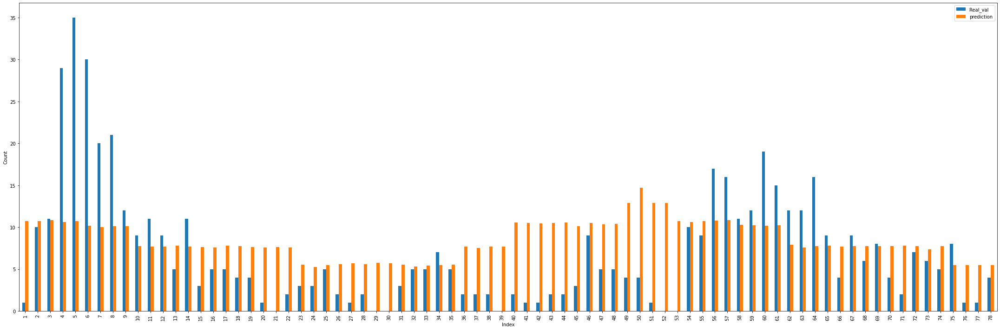

0.9
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_4', 'month_5',
       'month_6', 'month_7', 'month_8', 'month_10', 'month_11', 'month_12',
       'weekofyear_49', 'weekofyear_50'],
      dtype='object')
0.01541482926133797
5.238869870904206


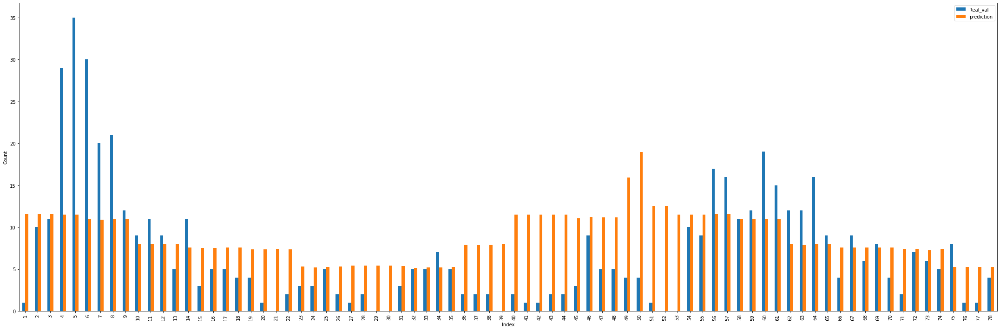

0.2
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12', 'weekofyear_50'],
      dtype='object')
-0.054908976799594056
5.586717827516607
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index(['reanalysis_min_air_temp_k', 'month_7', 'month_12'], dtype='object')
-0.023951204099485368
5.5097977705867285


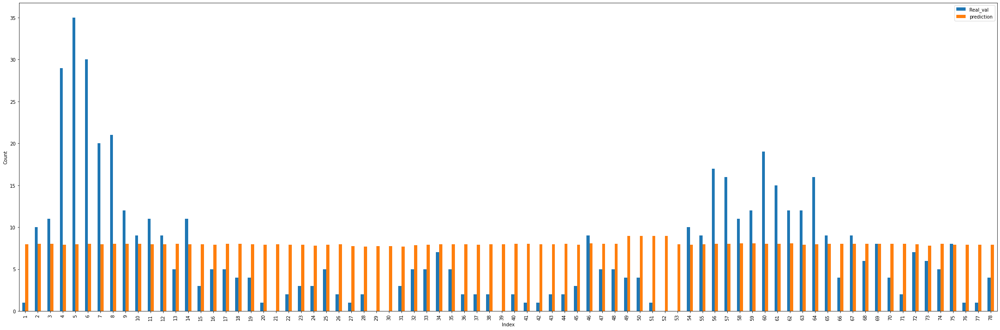

0.8
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_6', 'month_7', 'month_8',
       'month_10', 'month_12'],
      dtype='object')
-0.02491953825298654
5.517550718383321


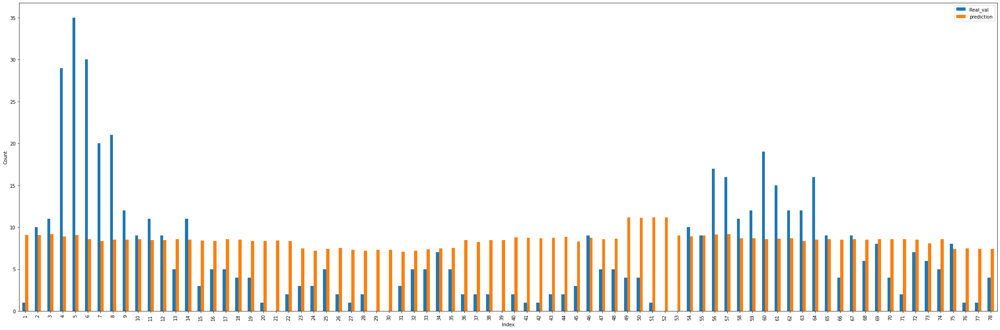

0.9
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12'],
      dtype='object')
-0.03429706559351264
5.532884548695308


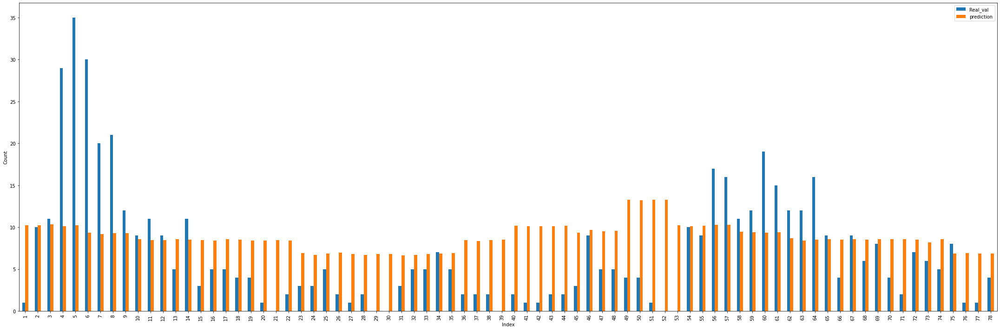

0.30000000000000004
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_2', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12'],
      dtype='object')
-0.11085772369156732
5.829525582173982
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index(['month_12'], dtype='object')
-0.04473949887718631
5.648942429436298


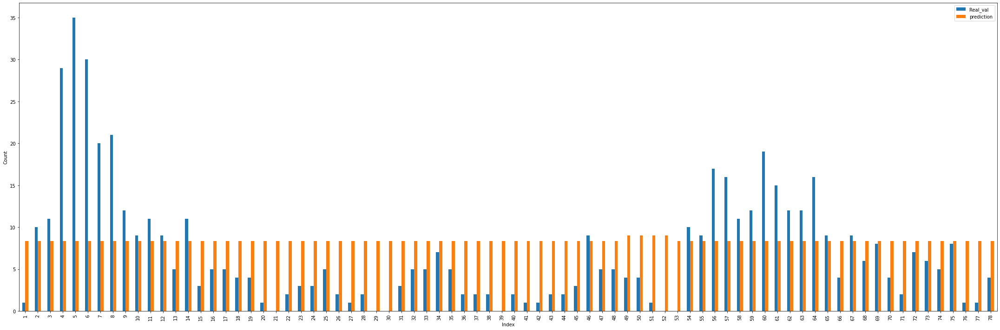

0.9
Selected features: Index(['reanalysis_min_air_temp_k', 'month_1', 'month_6', 'month_7', 'month_8',
       'month_12'],
      dtype='object')
-0.07892979742305806
5.77557366339977


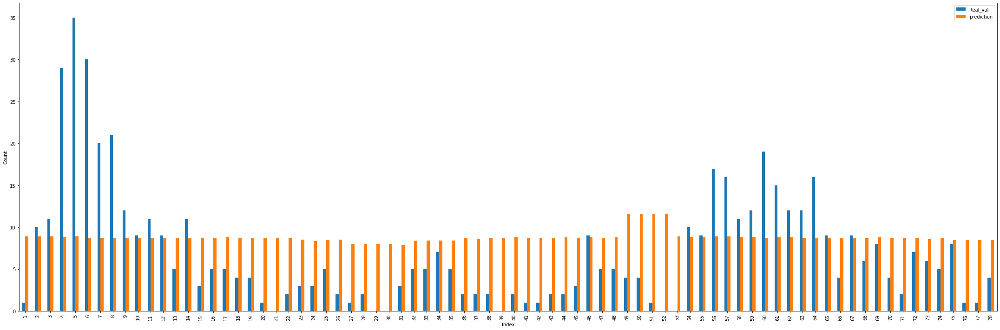

0.4
Selected features: Index(['month_1', 'month_6', 'month_7', 'month_8', 'month_10', 'month_12'], dtype='object')
-0.1309984142482976
5.983525101284483
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index(['month_12'], dtype='object')
-0.07619749585583024
5.80142492110734


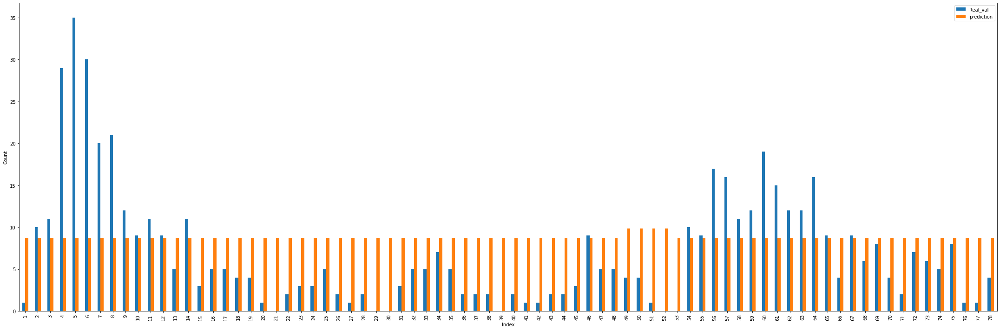

0.5
Selected features: Index(['month_12'], dtype='object')
-0.1231494474379029
5.9881715506715505
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index([], dtype='object')
0.6
Selected features: Index(['month_12'], dtype='object')
-0.10831253173459365
5.968727106227108
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Sel

ValueError: at least one array or dtype is required

In [78]:
for lasso_alpha in np.arange(0.1, 1.0, 0.1):
    print(lasso_alpha)
    modeling_linear(train_iq,validate_iq,Lasso(alpha=lasso_alpha))

0.1
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12', 'weekofyear_42',
       'weekofyear_49', 'weekofyear_50', 'weekofyear_52', 'PC1', 'PC2'],
      dtype='object')
-0.04048313956858629
5.32502500868929
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index(['PC2'], dtype='object')
-0.01199955148338172
5.035357432624641


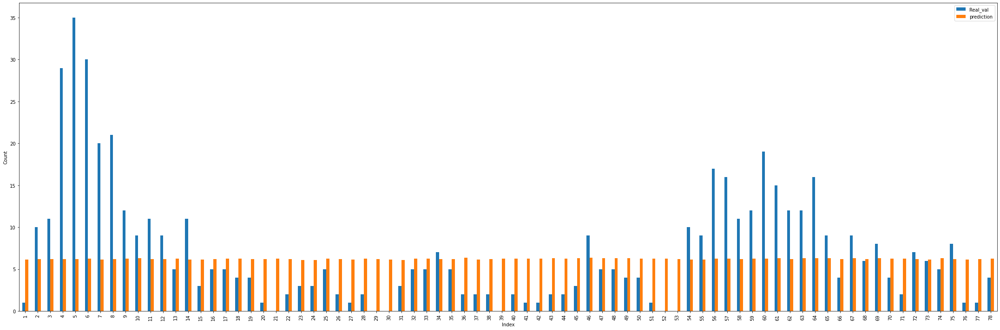

0.30000000000000004
Selected features: Index(['PC2'], dtype='object')
-0.0019642194514128963
5.110685133626946


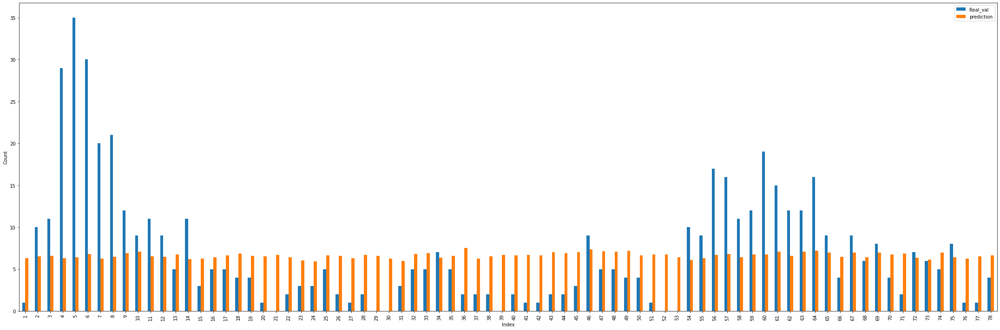

0.4
Selected features: Index(['PC2', 'PC3'], dtype='object')
0.00603797767397618
5.160431311126251


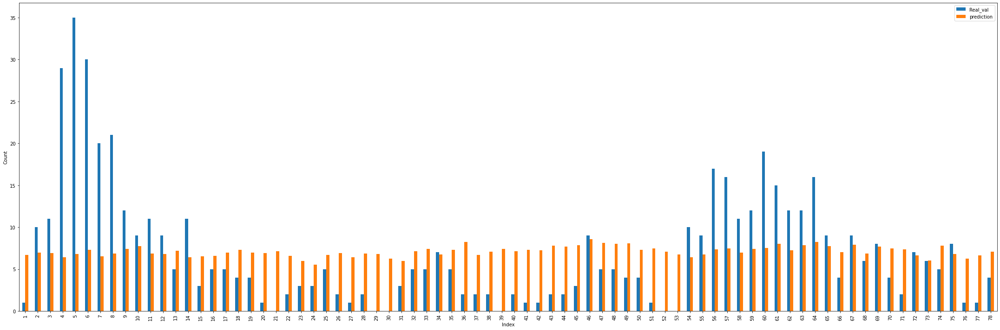

0.5
Selected features: Index(['month_1', 'month_8', 'month_12', 'PC2', 'PC3'], dtype='object')
0.00741618217534068
5.221960549164625


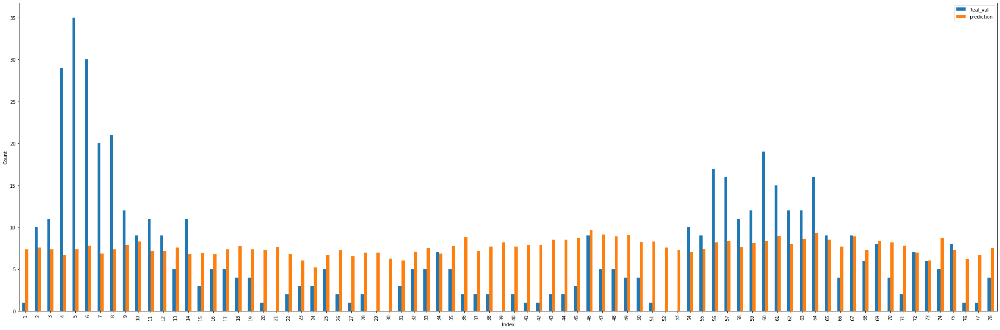

0.6
Selected features: Index(['month_1', 'month_2', 'month_6', 'month_7', 'month_8', 'month_12',
       'PC2', 'PC3'],
      dtype='object')
0.02928934616248391
5.208163215097648


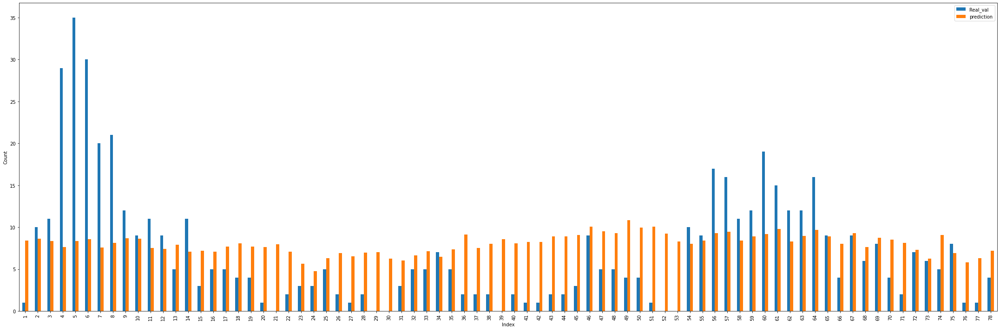

0.7000000000000001
Selected features: Index(['month_1', 'month_2', 'month_6', 'month_7', 'month_8', 'month_10',
       'month_11', 'month_12', 'PC2', 'PC3'],
      dtype='object')
0.04634182454047309
5.1675912324938675


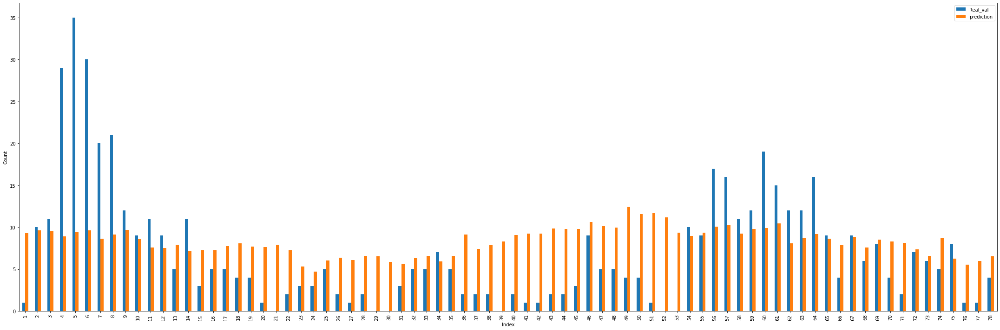

0.8
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_6', 'month_7', 'month_8',
       'month_10', 'month_11', 'month_12', 'weekofyear_50', 'PC2', 'PC3'],
      dtype='object')
0.03793100217649337
5.184235960917701


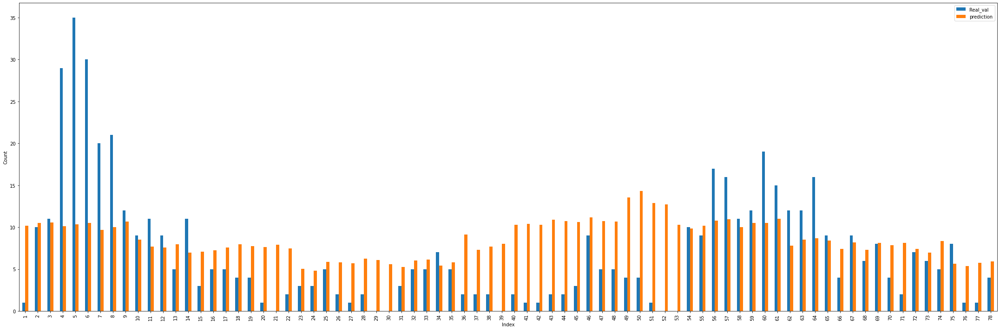

0.9
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12', 'weekofyear_49',
       'weekofyear_50', 'PC2'],
      dtype='object')
0.007496294240135315
5.2512921037447775


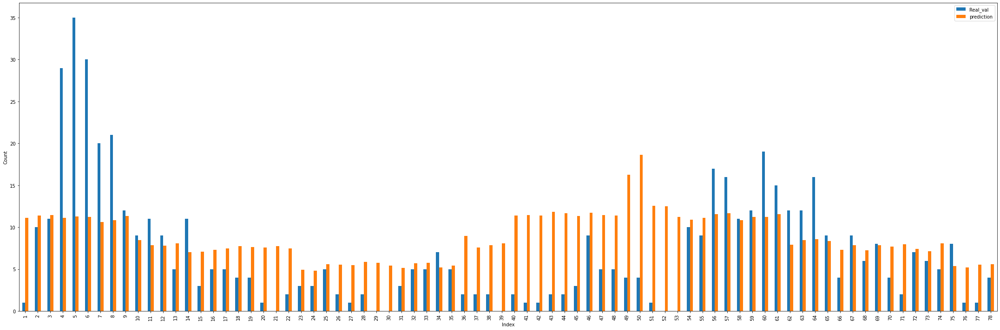

1.0
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_7',
       'month_8', 'month_10', 'month_11', 'month_12', 'weekofyear_42',
       'weekofyear_49', 'weekofyear_50', 'weekofyear_52', 'PC1', 'PC2'],
      dtype='object')
-0.04048313956858629
5.325025008689291


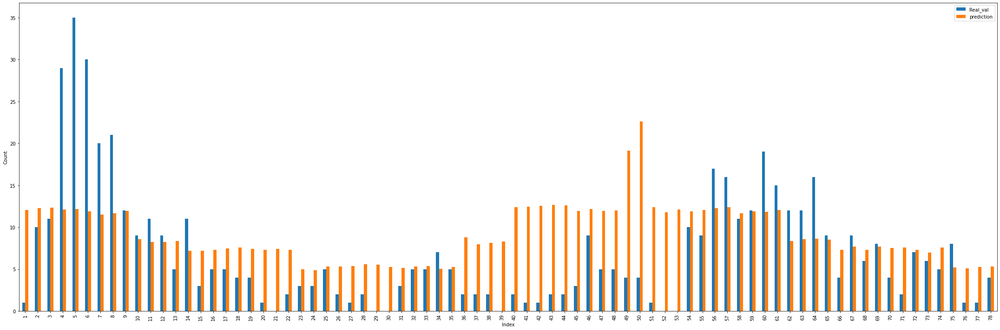

0.2
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_6', 'month_7', 'month_8',
       'month_10', 'month_11', 'month_12', 'weekofyear_50', 'PC2'],
      dtype='object')
-0.07074692503659397
5.614591960948968
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index(['PC2'], dtype='object')
-0.0005038750616110921
5.2807924163111855


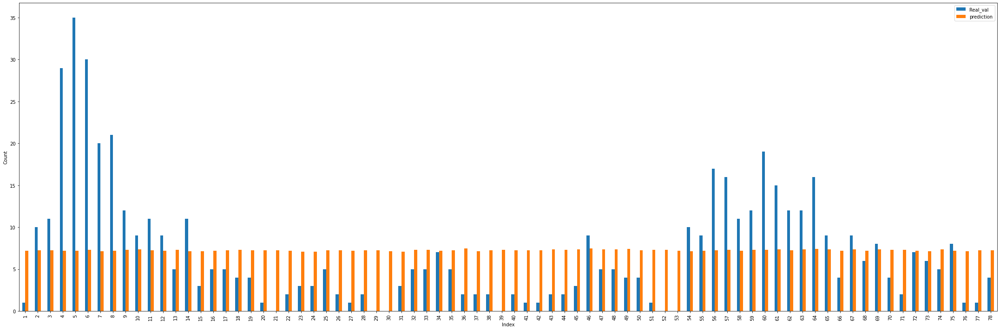

0.6
Selected features: Index(['PC2'], dtype='object')
-0.00970731139973835
5.379338325817161


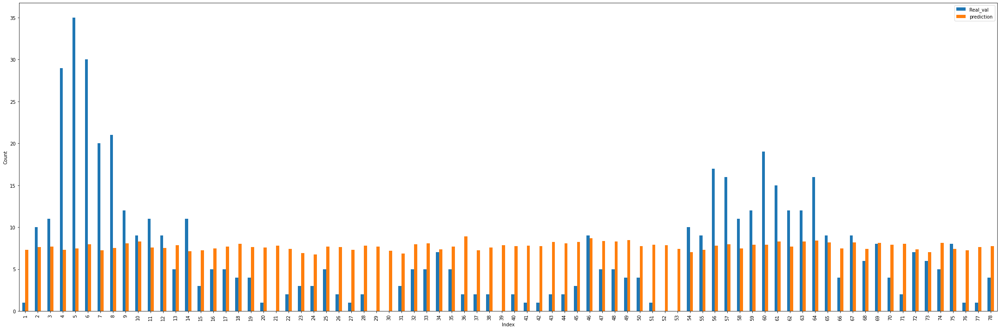

0.7000000000000001
Selected features: Index(['month_12', 'PC2', 'PC3'], dtype='object')
-0.031195958271855284
5.52186301769561


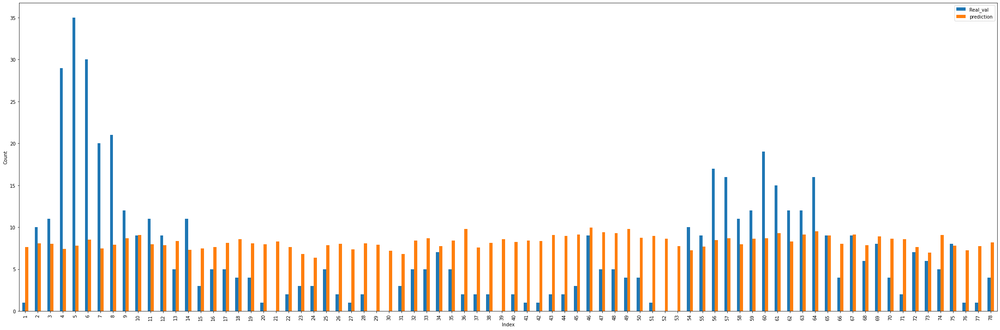

0.8
Selected features: Index(['month_1', 'month_8', 'month_12', 'PC2', 'PC3'], dtype='object')
-0.06630634763115273
5.695243266266622


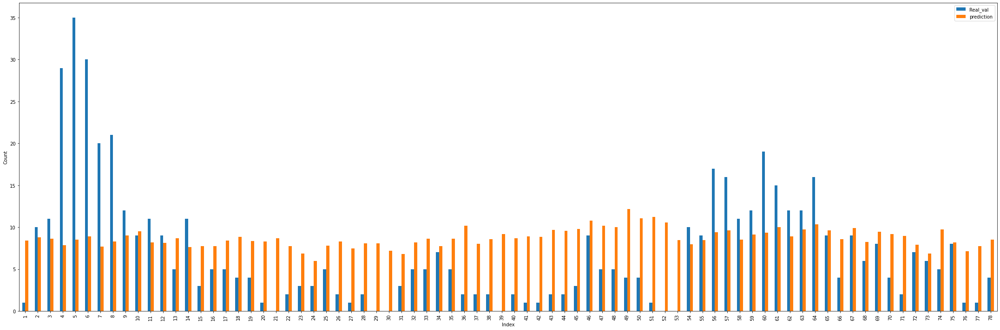

0.9
Selected features: Index(['month_1', 'month_2', 'month_6', 'month_7', 'month_8', 'month_10',
       'month_11', 'month_12', 'PC2', 'PC3'],
      dtype='object')
-0.0620681989621239
5.644151450499125


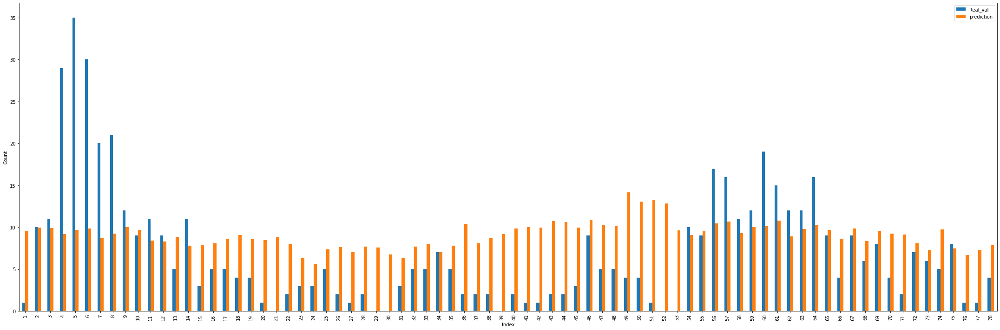

1.0
Selected features: Index(['month_1', 'month_2', 'month_4', 'month_6', 'month_7', 'month_8',
       'month_10', 'month_11', 'month_12', 'weekofyear_50', 'PC2'],
      dtype='object')
-0.07074692503659397
5.614591960948967


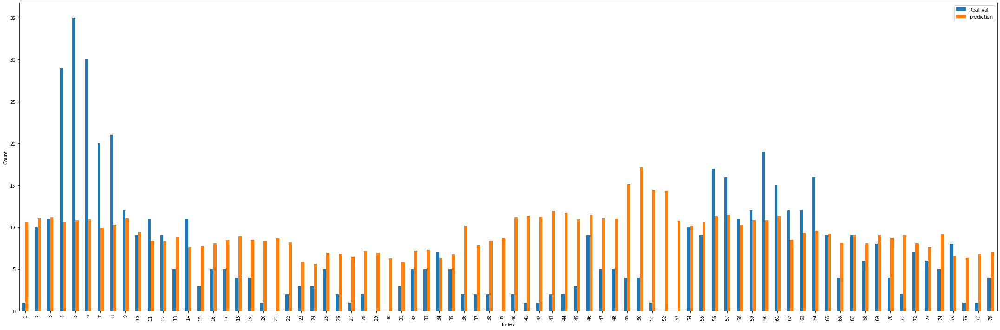

0.30000000000000004
Selected features: Index(['month_1', 'month_2', 'month_6', 'month_7', 'month_8', 'month_10',
       'month_12', 'PC2', 'PC3'],
      dtype='object')
-0.14823149066746177
6.00630991037386
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index(['PC2'], dtype='object')
-0.02100397048395175
5.497644144641597


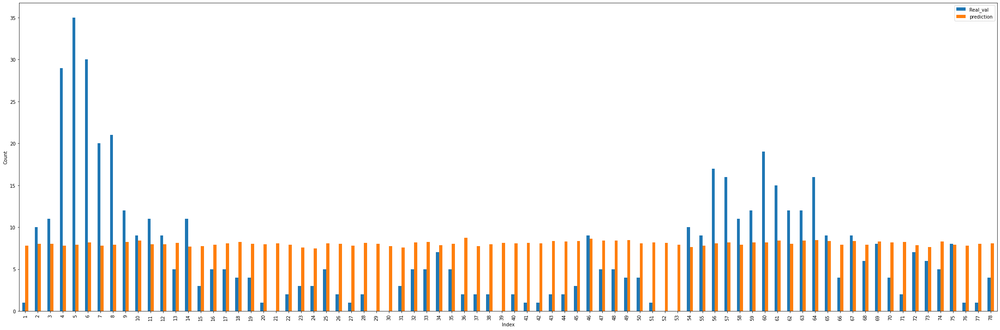

0.8
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.0519438447494629
5.677137618008799


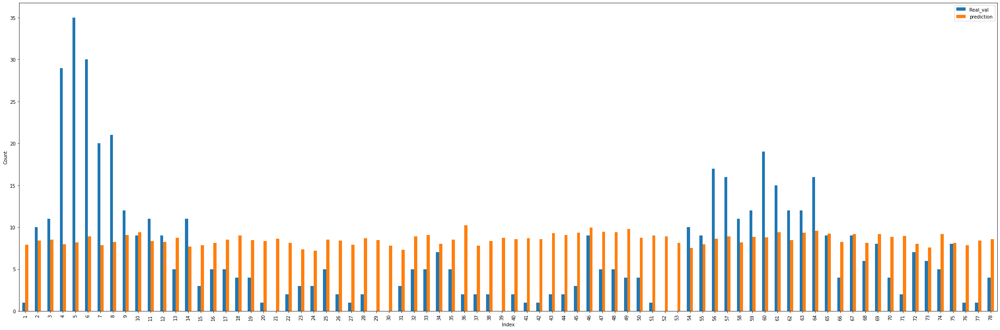

0.9
Selected features: Index(['month_12', 'PC2', 'PC3'], dtype='object')
-0.11150612584549746
5.927332765559391


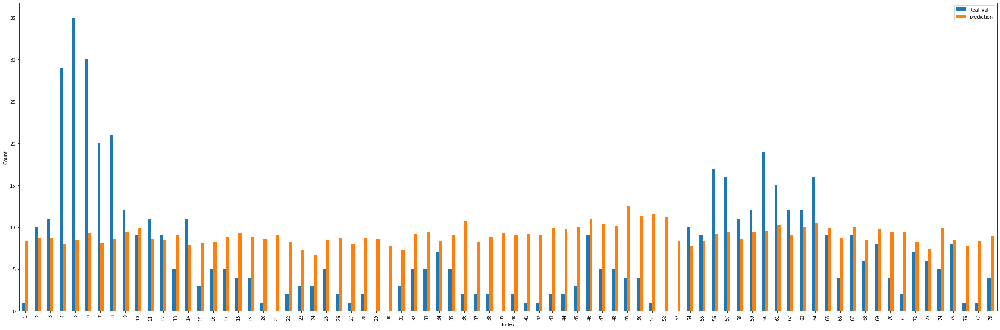

1.0
Selected features: Index(['month_1', 'month_2', 'month_6', 'month_7', 'month_8', 'month_10',
       'month_12', 'PC2', 'PC3'],
      dtype='object')
-0.14823149066746177
6.006309910373859


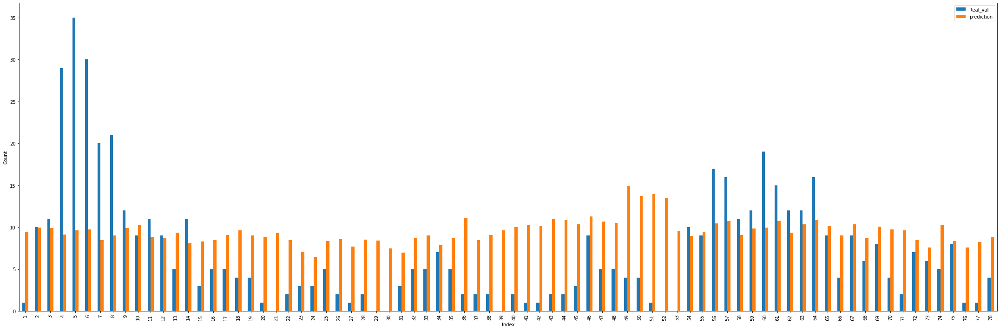

0.4
Selected features: Index(['month_12', 'PC2', 'PC3'], dtype='object')
-0.16144540280285358
6.133160751542747
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index(['PC2'], dtype='object')
-0.04111329975014111
5.629556609683527


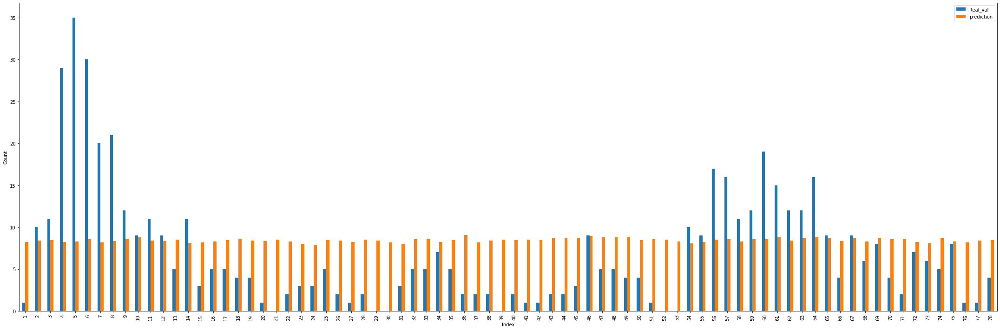

0.9
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.08599688867512478
5.867156169191464


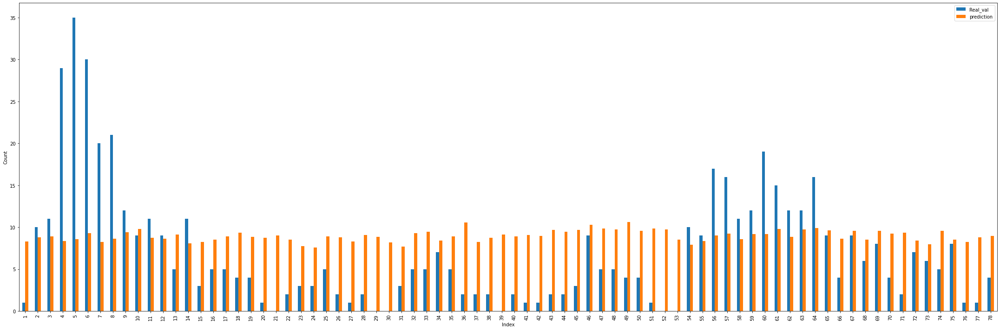

1.0
Selected features: Index(['month_12', 'PC2', 'PC3'], dtype='object')
-0.16144540280285402
6.133160751542749


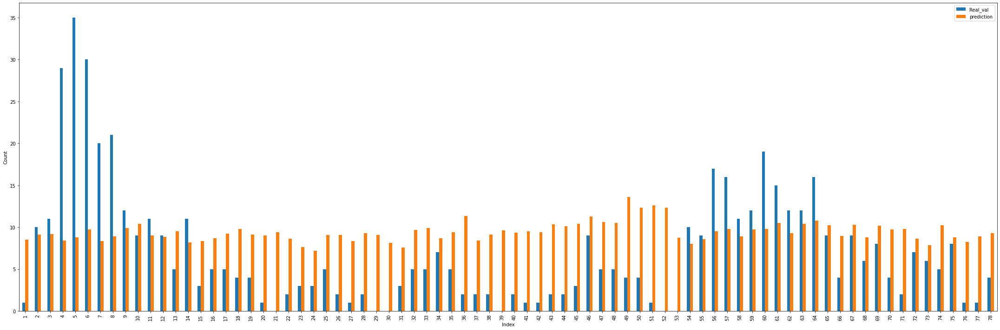

0.5
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.13758179800026826
6.085183213911397
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index(['PC2'], dtype='object')
-0.07147048469670025
5.808326573641172


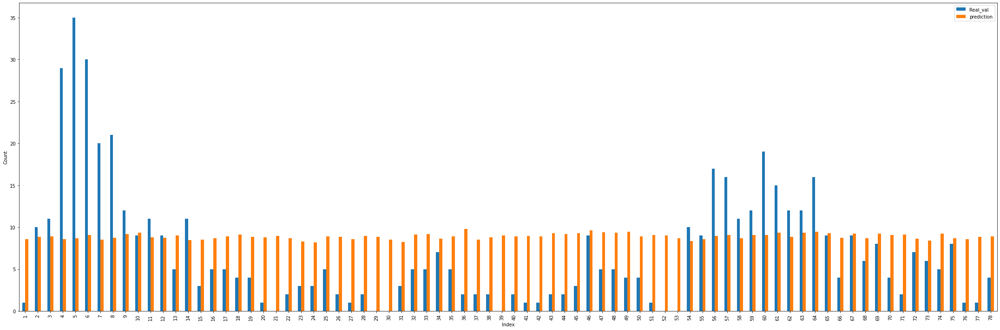

1.0
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.13758179800026826
6.085183213911397


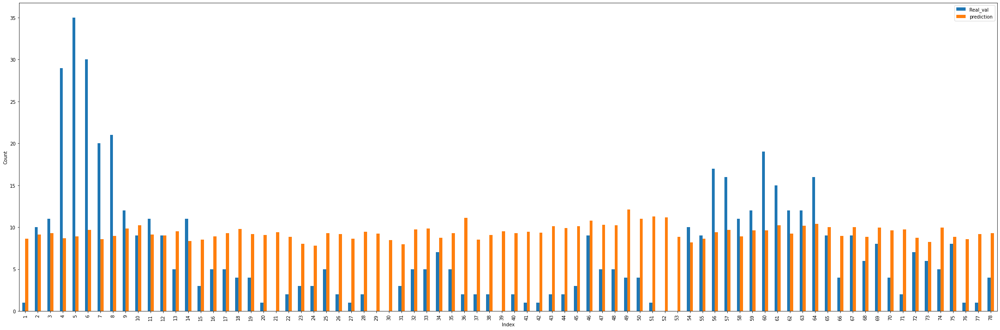

0.6
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.11729988706757188
6.035499292822601
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index(['PC2'], dtype='object')
-0.06595968865008861
5.772017070967542


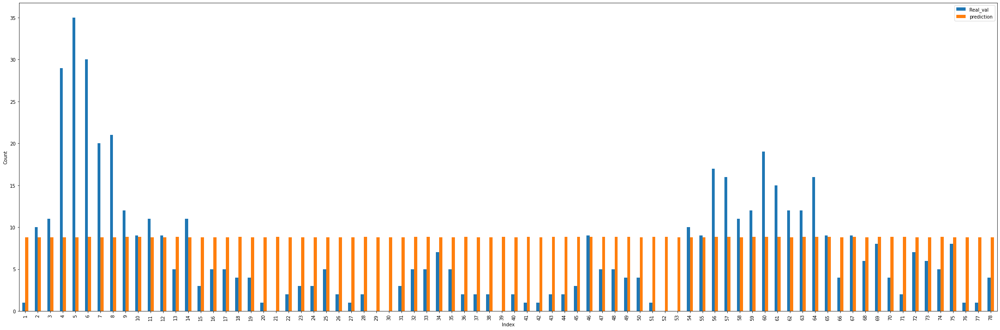

1.0
Selected features: Index(['month_12', 'PC2'], dtype='object')
-0.11729988706757188
6.035499292822601


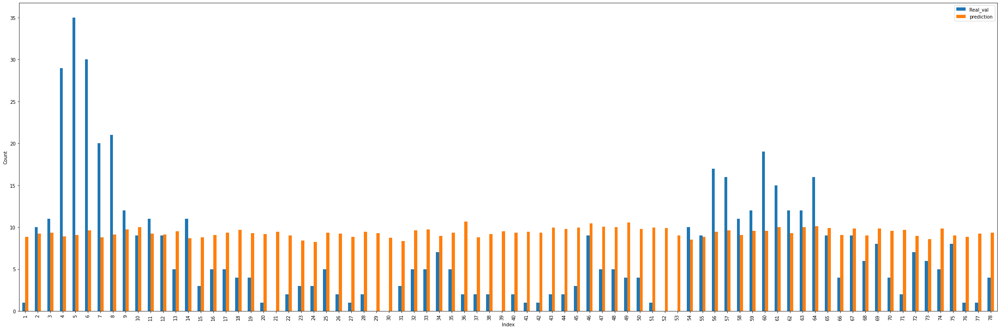

0.7000000000000001
Selected features: Index(['PC2'], dtype='object')
-0.10692596090020201
5.994266792518783
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index([], dtype='object')
1.0
Selected features: Index(['PC2'], dtype='object')
-0.10692596090020201
5.994266792518784


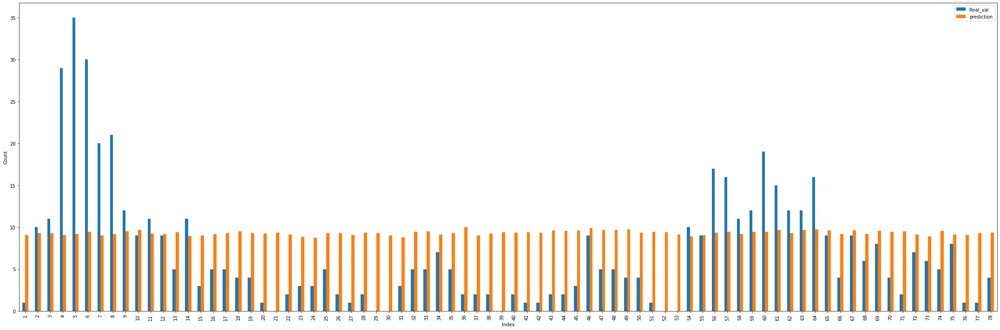

0.8
Selected features: Index(['PC2'], dtype='object')
-0.10181507061829631
5.958766226552854
0.1
Selected features: Index([], dtype='object')
0.2
Selected features: Index([], dtype='object')
0.30000000000000004
Selected features: Index([], dtype='object')
0.4
Selected features: Index([], dtype='object')
0.5
Selected features: Index([], dtype='object')
0.6
Selected features: Index([], dtype='object')
0.7000000000000001
Selected features: Index([], dtype='object')
0.8
Selected features: Index([], dtype='object')
0.9
Selected features: Index([], dtype='object')
1.0
Selected features: Index(['PC2'], dtype='object')
-0.10181507061829631
5.958766226552854


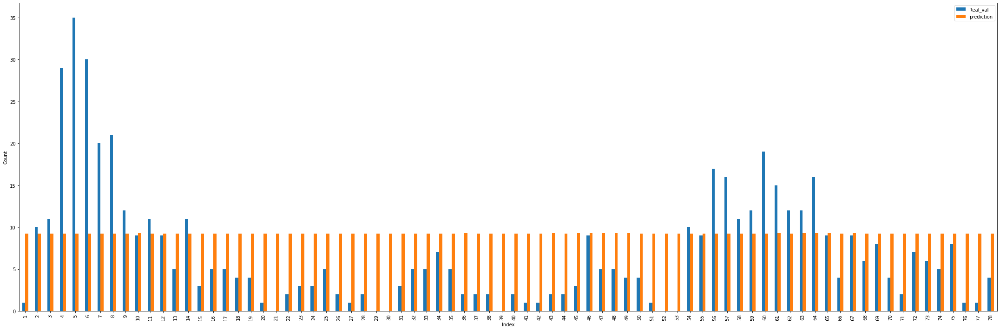

0.9
Selected features: Index([], dtype='object')


ValueError: at least one array or dtype is required

In [58]:
for lasso_alpha in np.arange(0.1, 1.0, 0.1):
    print(lasso_alpha)
    modeling_linear_pca(train_iq,validate_iq,Lasso(alpha=lasso_alpha))

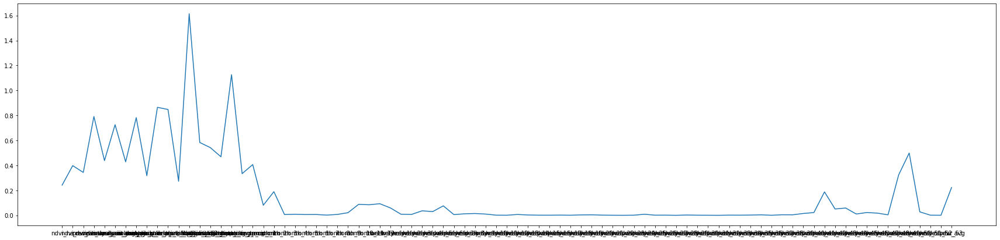

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_24', 'weekofy

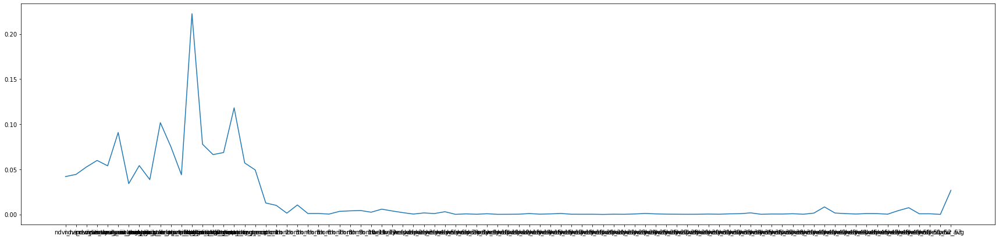

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofy

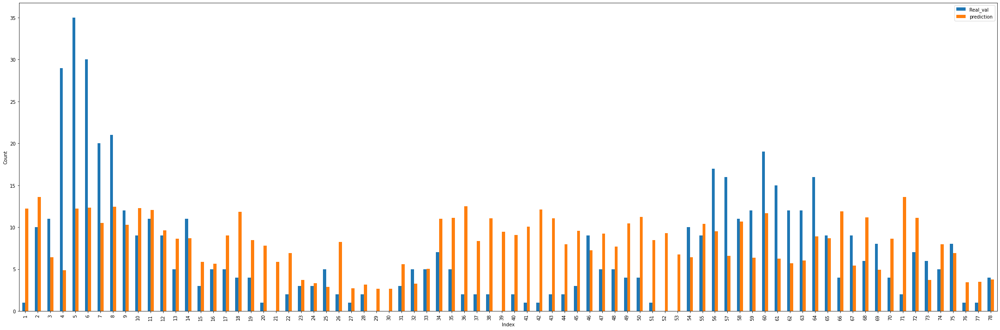

0.2


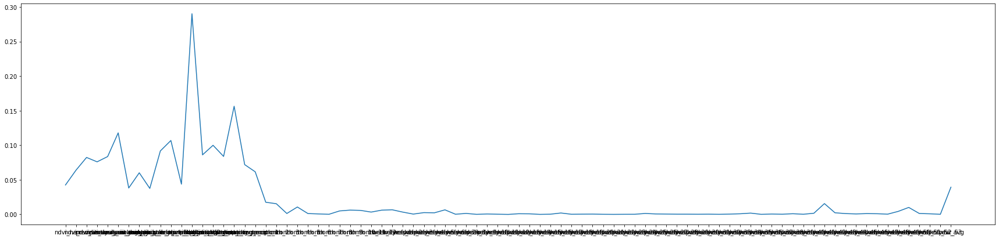

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofy

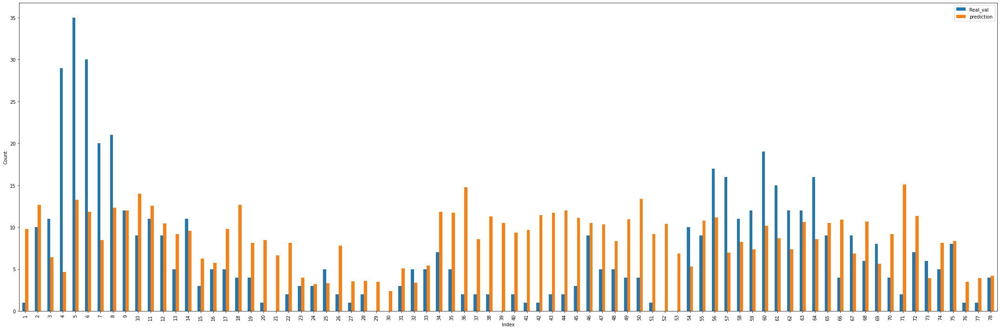

0.30000000000000004


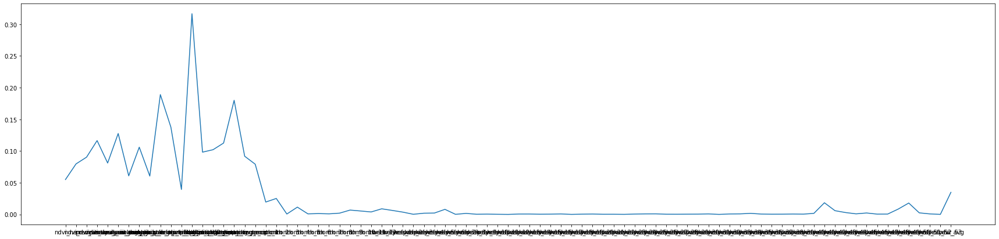

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofy

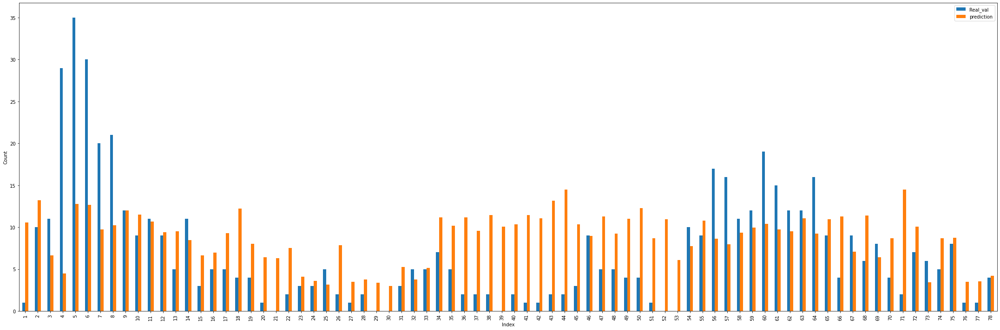

0.4


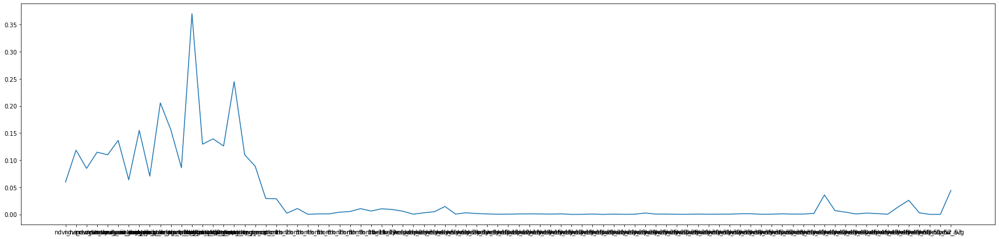

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofy

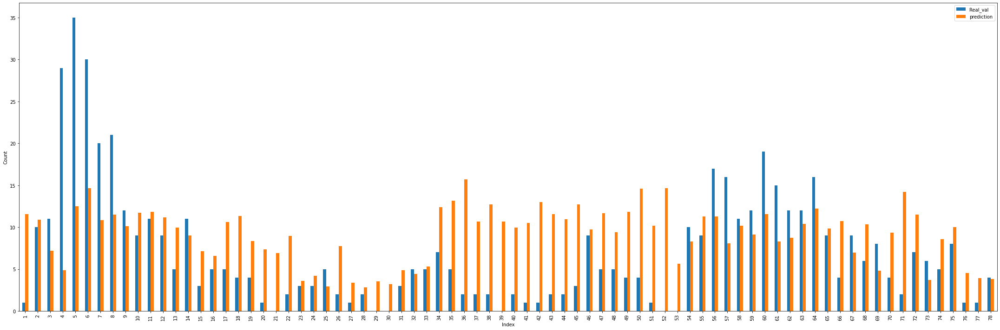

0.5


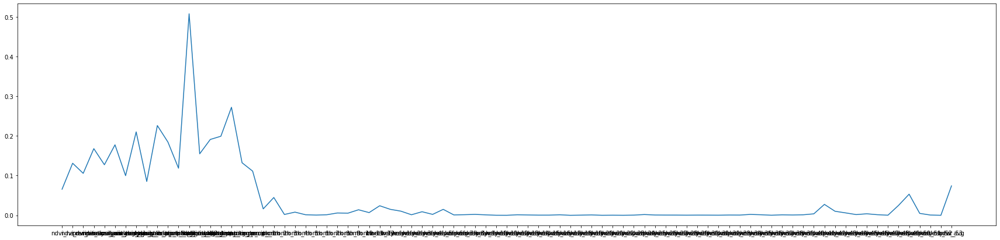

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofy

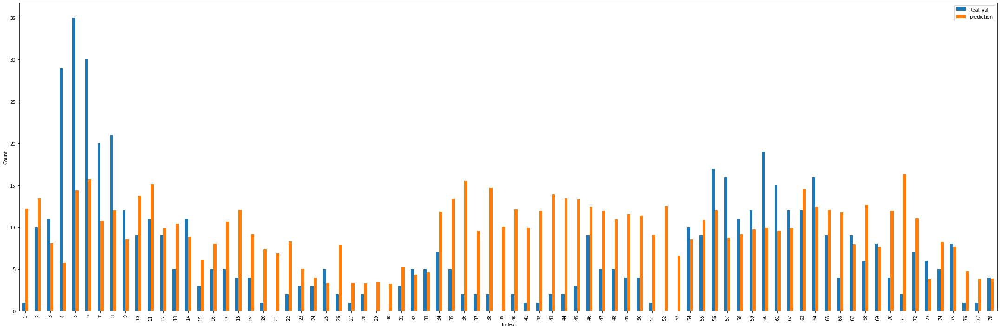

0.6


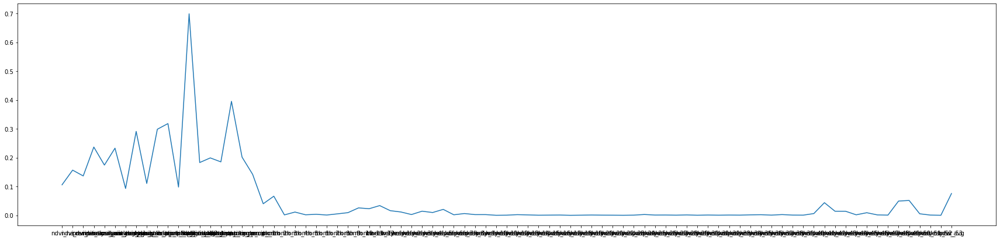

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofy

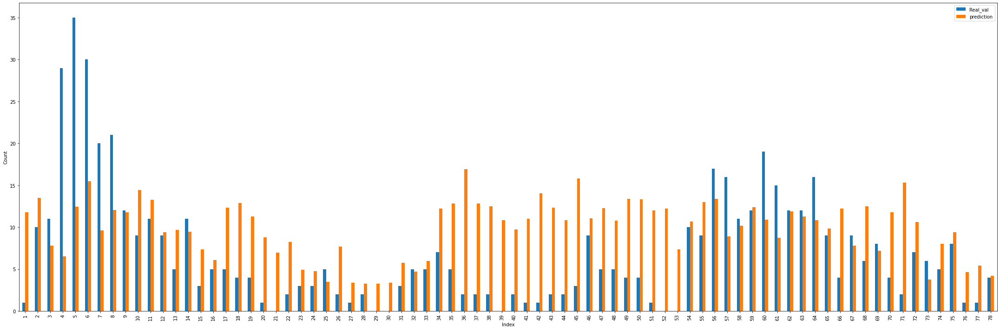

0.7000000000000001


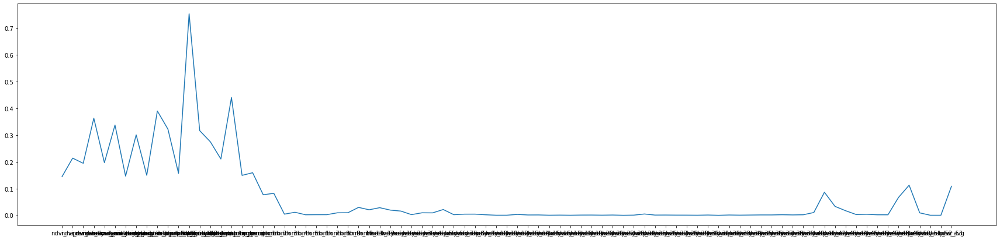

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

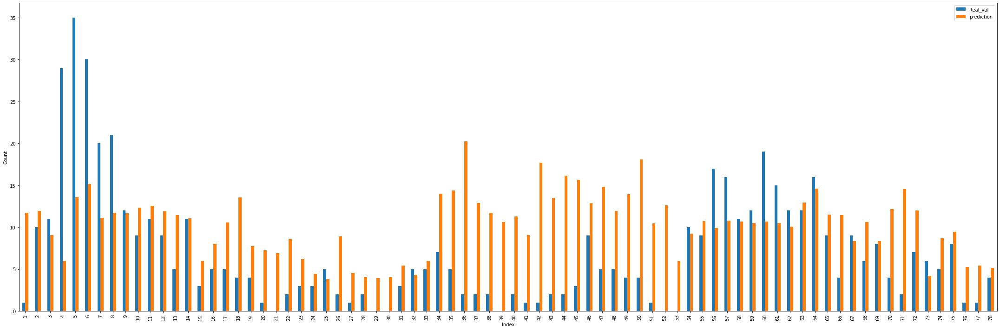

0.8


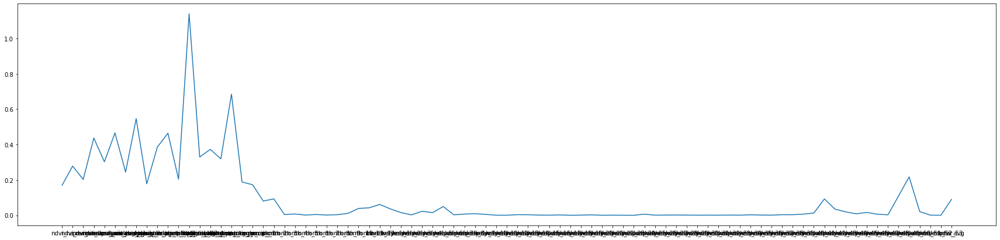

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_22', 'weekofyear_23', 'weekofyear_25', 'weekofyear_26', 'weekofy

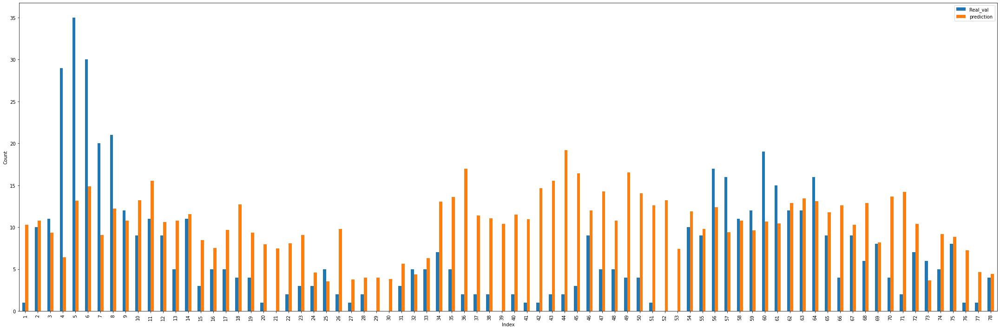

0.9


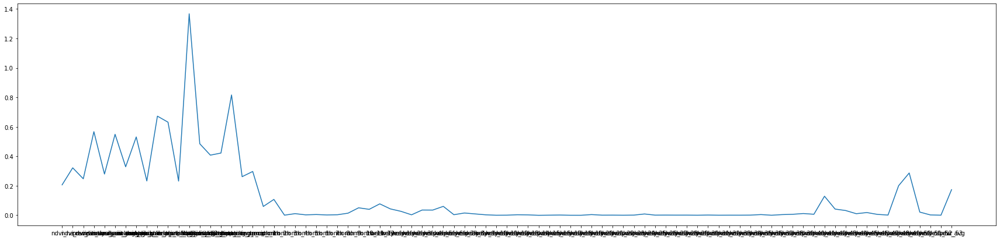

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofy

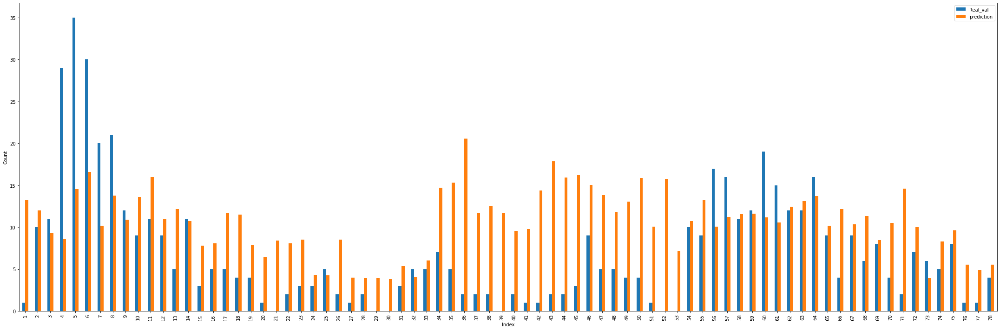

In [59]:
modeling_nonlinear(train_iq,validate_iq,RandomForestRegressor())

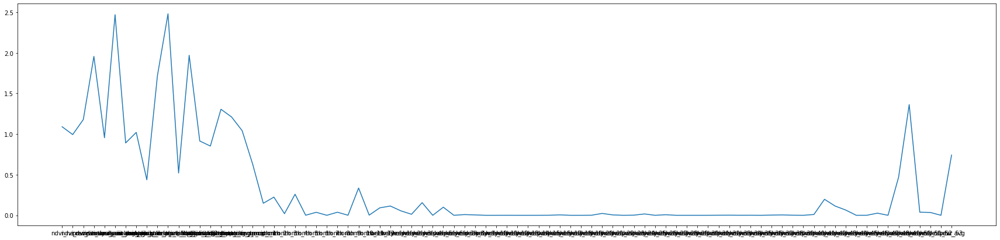

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_12', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_24', 'weekofyear_25', 'weekofyear_27', 'weekofyear_29', 'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekof

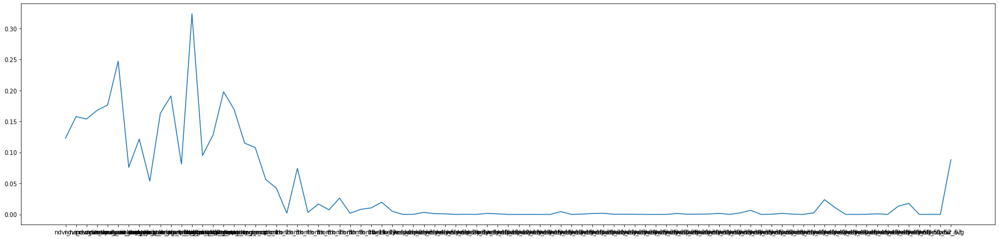

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 'weekof

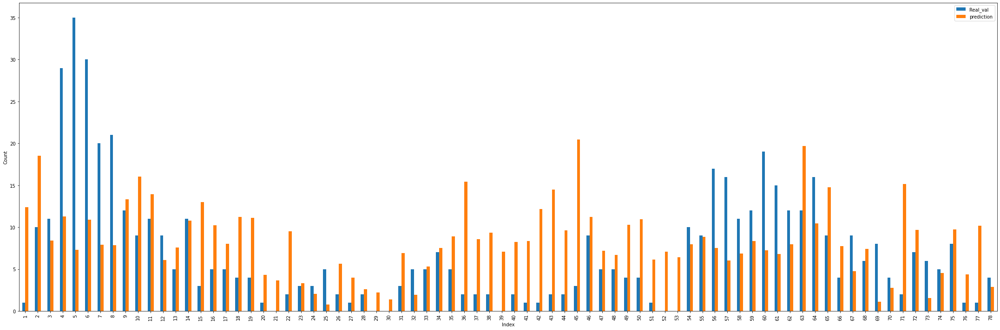

0.2


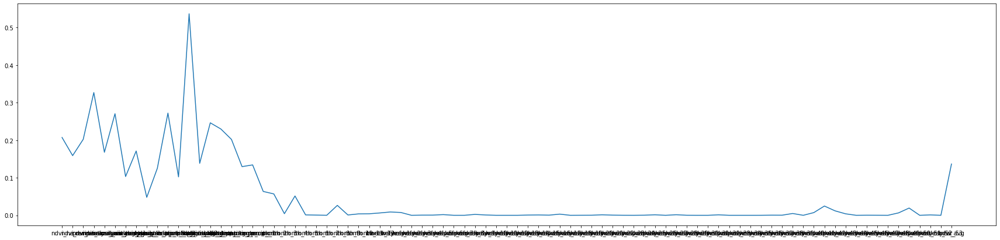

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_28', 'weeko

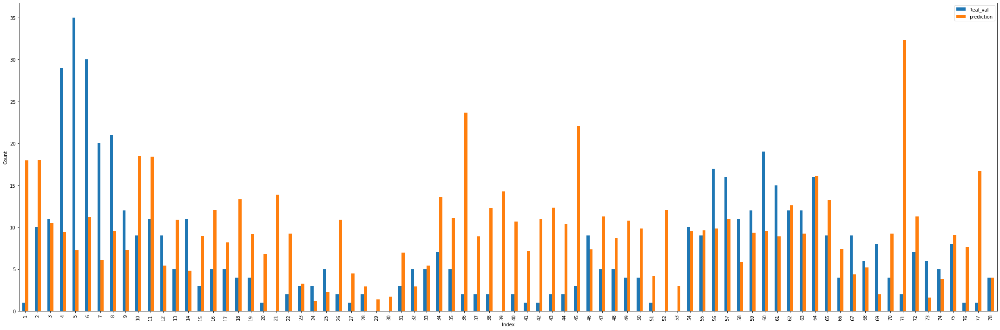

0.30000000000000004


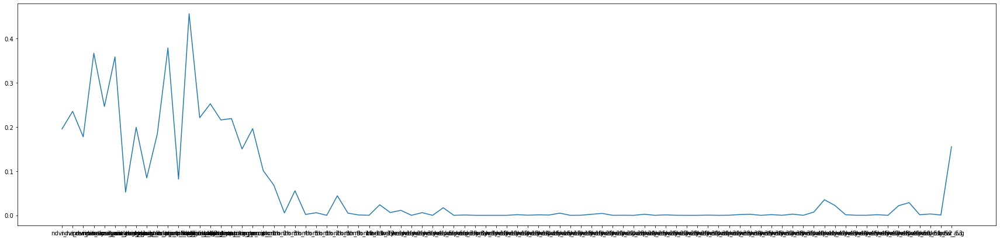

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_4', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_25', 'weekofyear_27', 'weekofyear_28', 'weekofyear_31', 'weekofyear_33', 'weekofyear_34', 'week

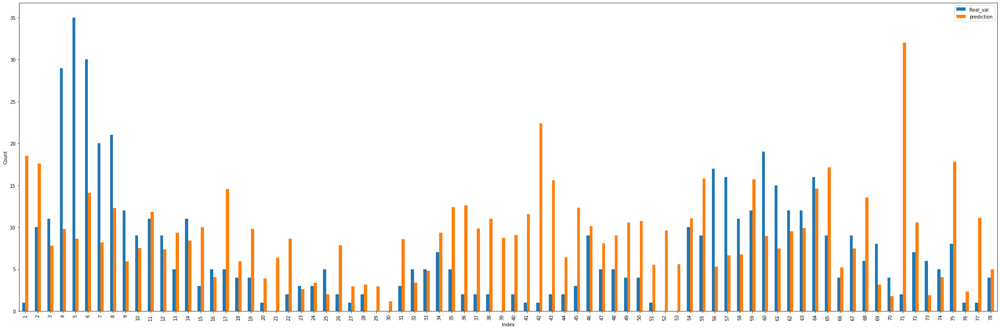

0.4


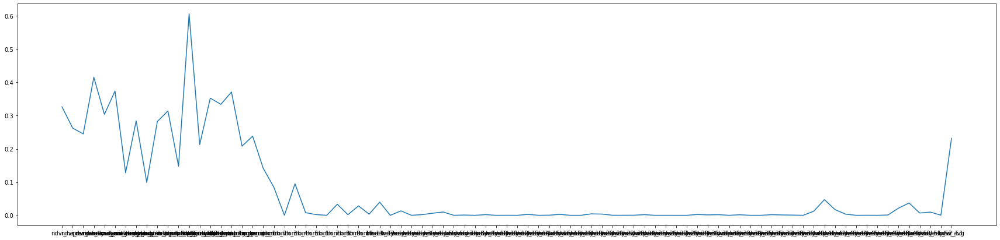

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_4', 'month_5', 'month_6', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_27', 'weekofyear_30', 'weekofyear_31', 'weekofyear_32', 'weekofyear_

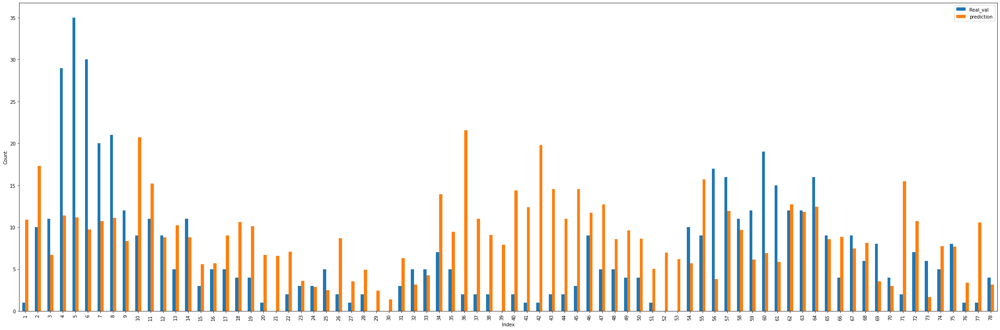

0.5


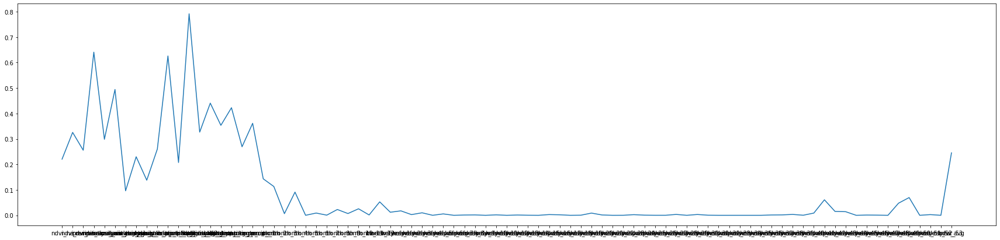

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekof

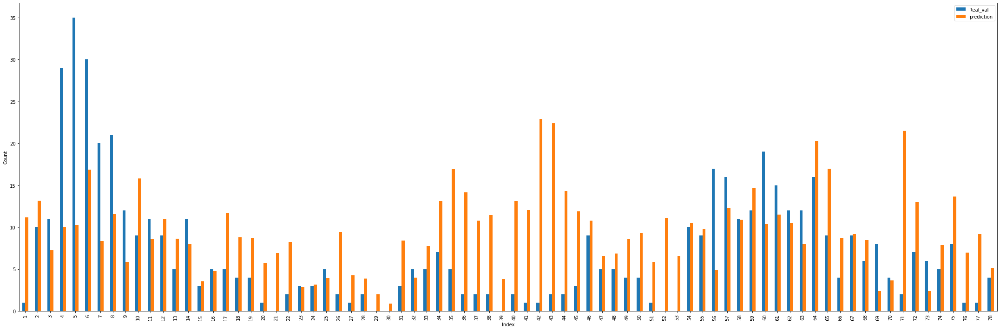

0.6


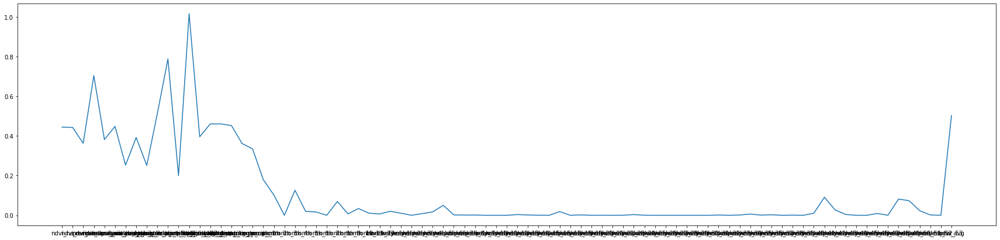

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_29', 'weekofy

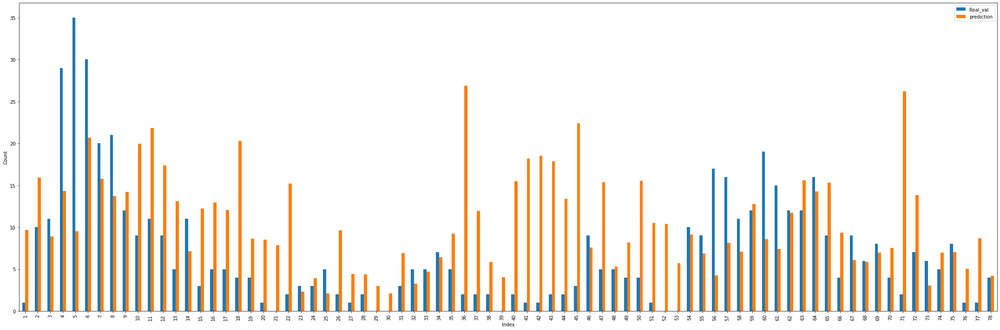

0.7000000000000001


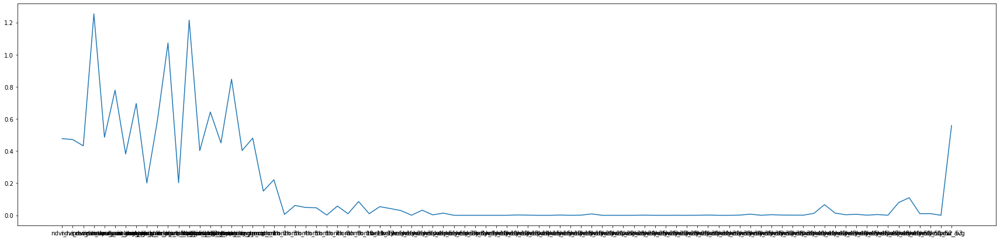

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_13', 'weekofyear_14', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_28', 'weekofyear_30', 'weekofyear_31', 'weekofyear_34', 'weekof

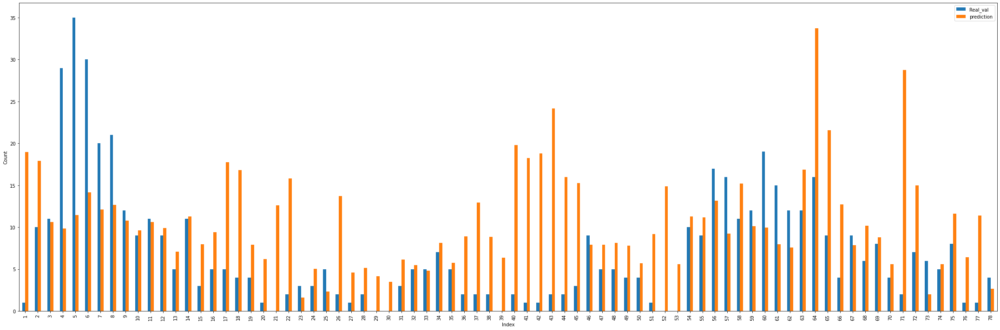

0.8


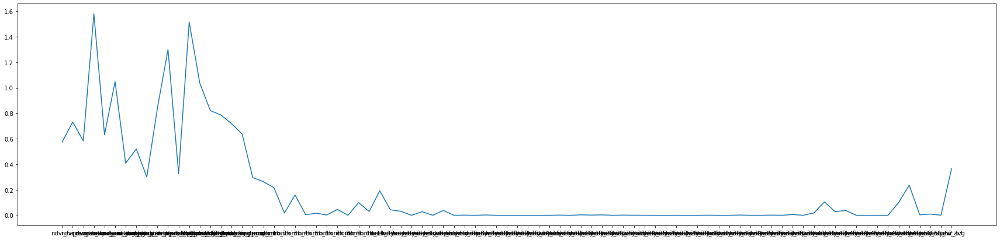

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_6', 'weekofyear_8', 'weekofyear_10', 'weekofyear_14', 'weekofyear_17', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_28', 'weekofyear_31', 'weekofyear_34', 'weekofyear_36', 'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 'weekofyear_41', 'week

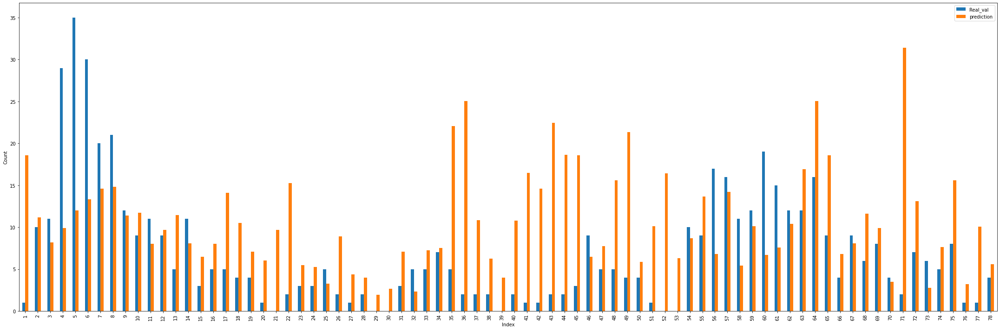

0.9


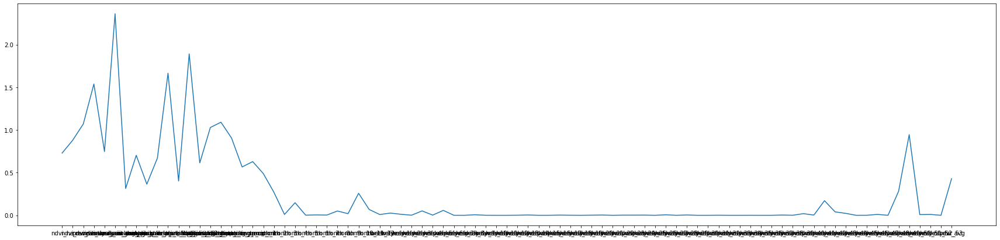

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_27', 'weekof

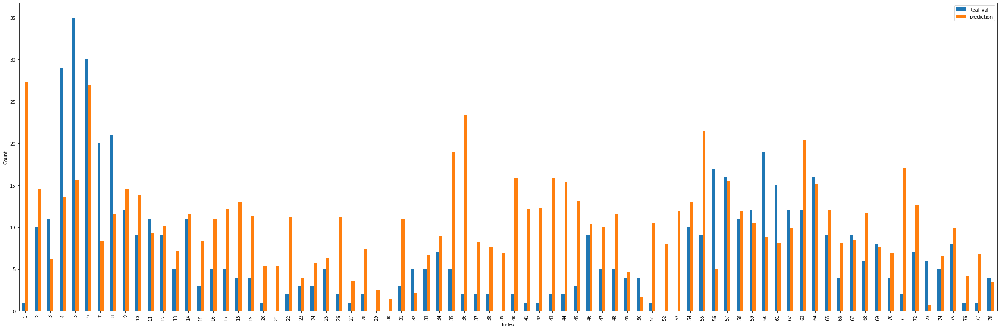

In [60]:
modeling_nonlinear(train_iq,validate_iq,xgb.XGBRegressor())

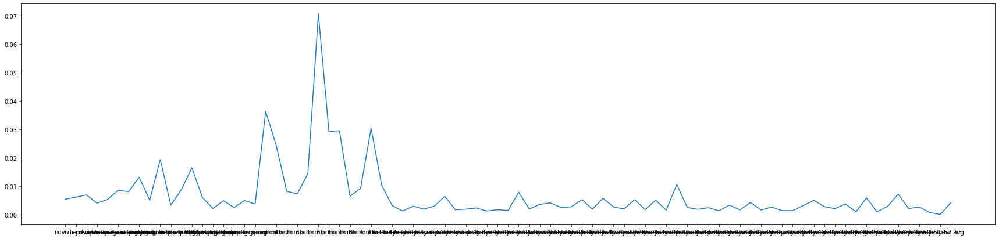

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

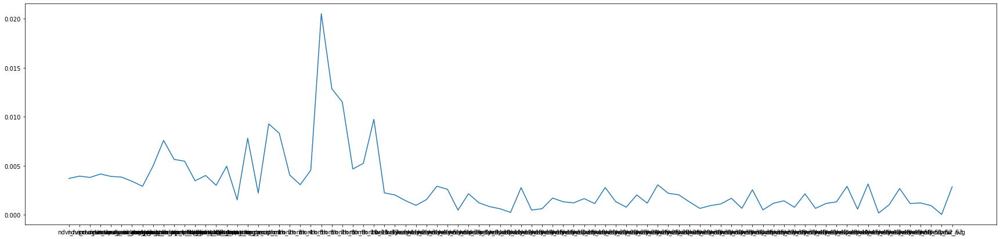

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

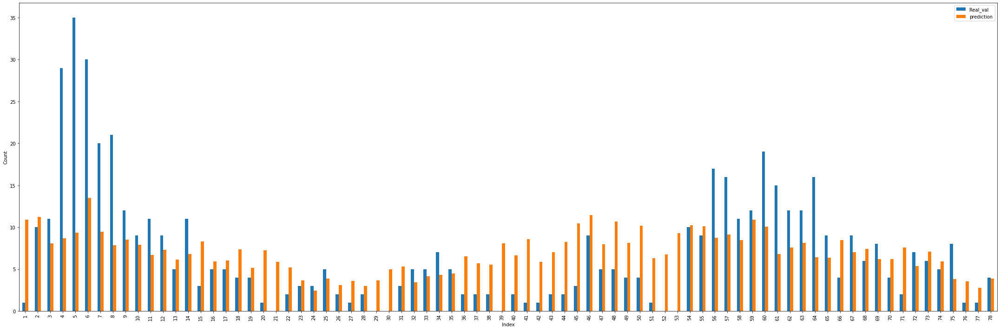

0.2


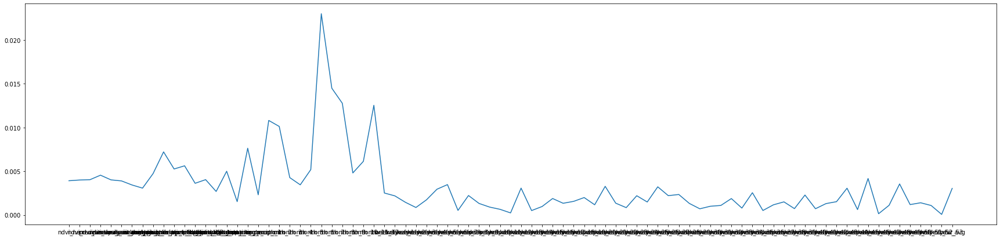

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

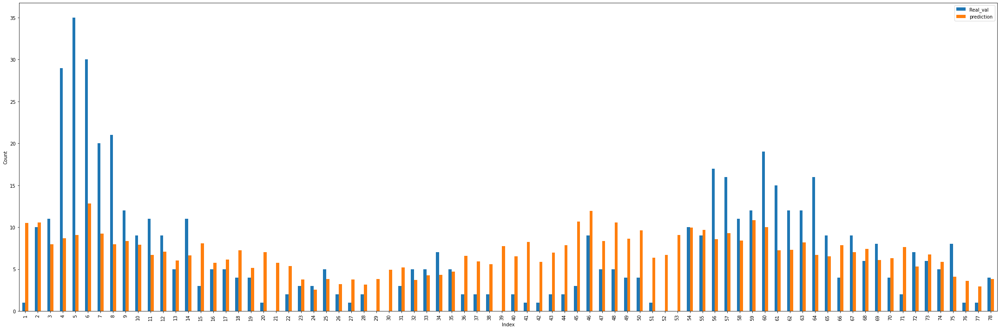

0.30000000000000004


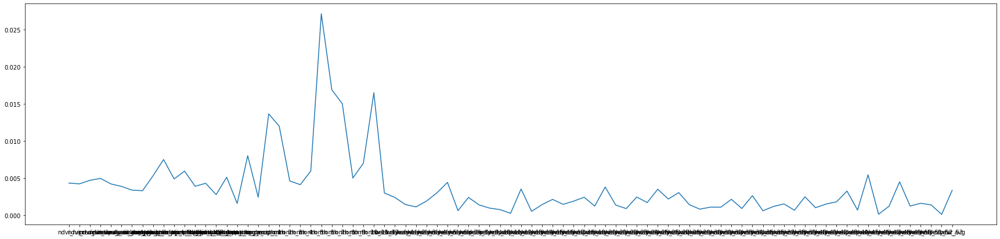

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

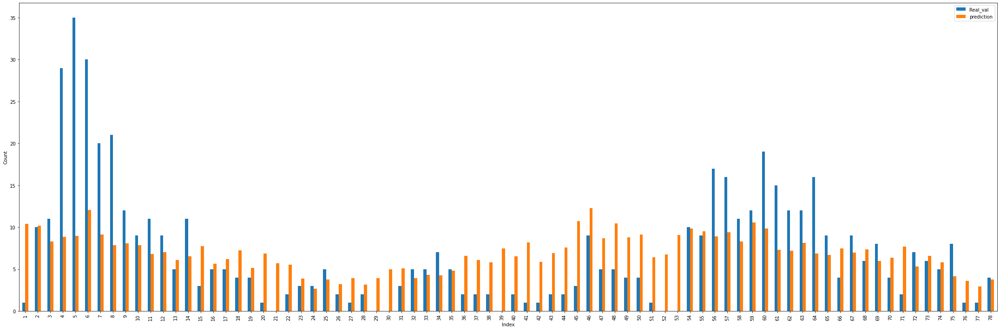

0.4


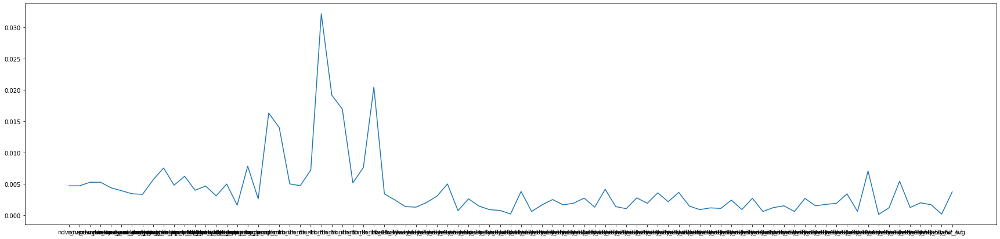

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

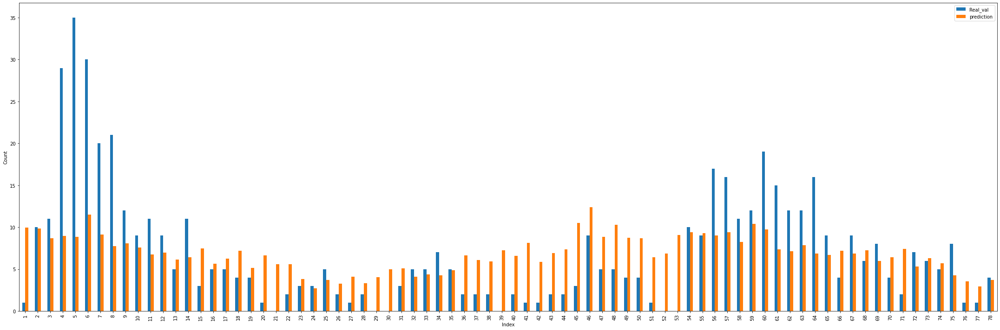

0.5


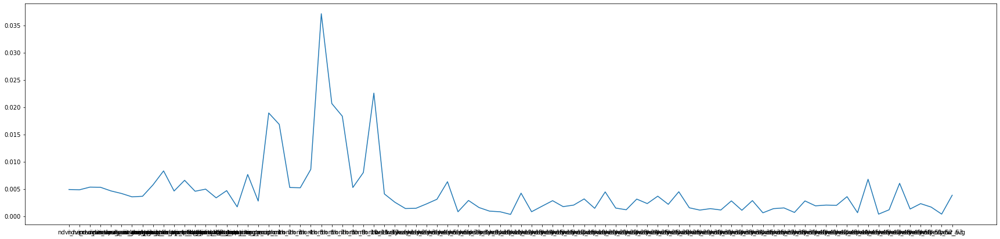

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

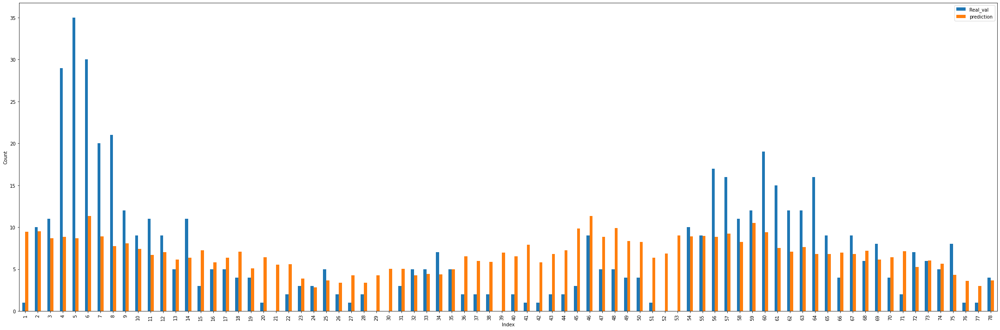

0.6


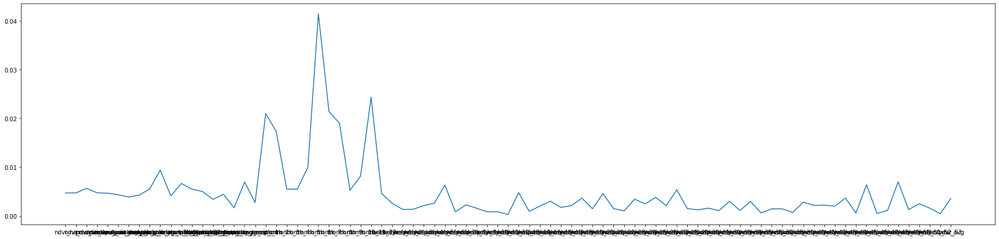

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

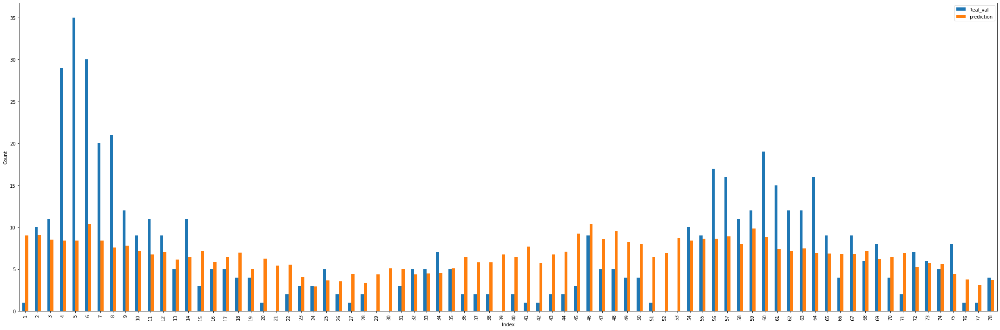

0.7000000000000001


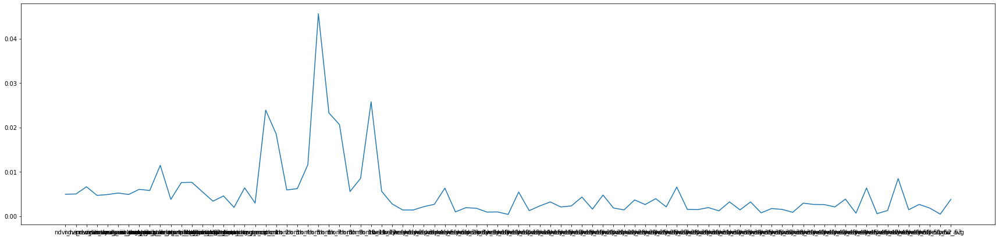

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

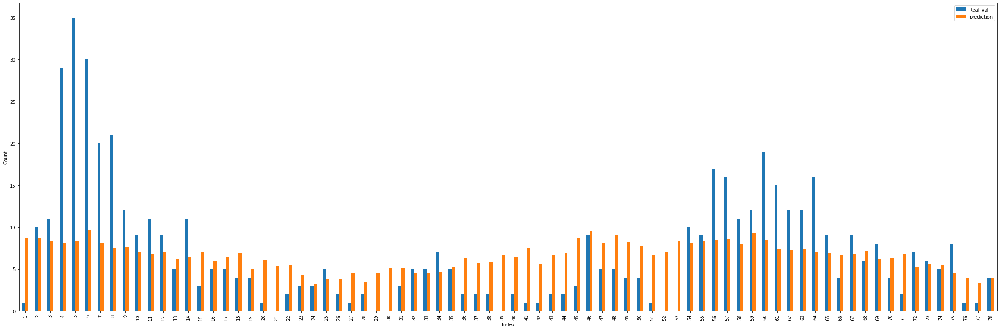

0.8


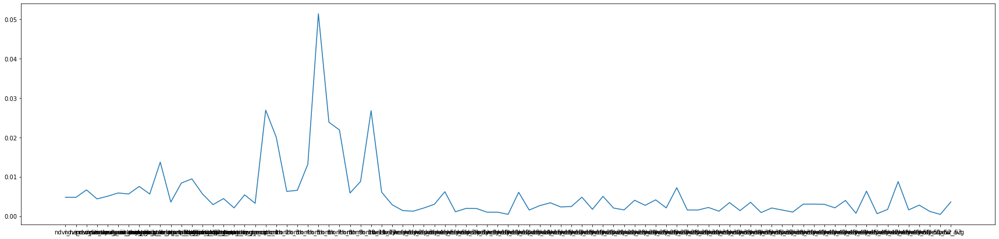

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

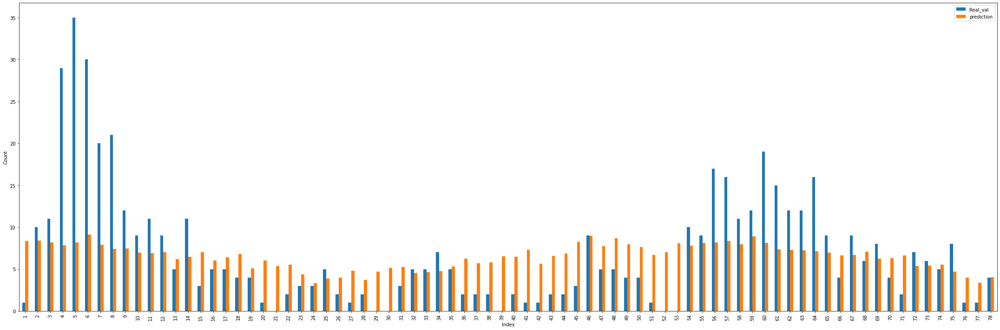

0.9


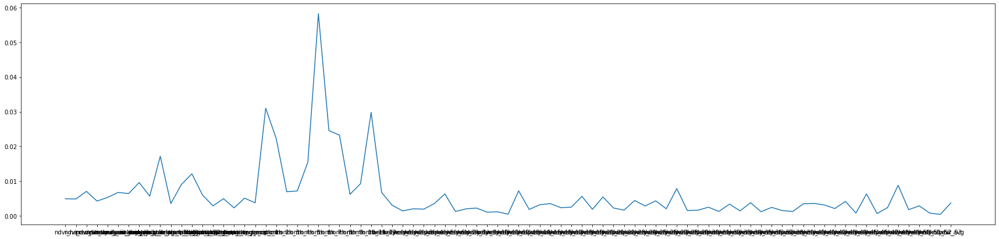

selected_feat:  ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofy

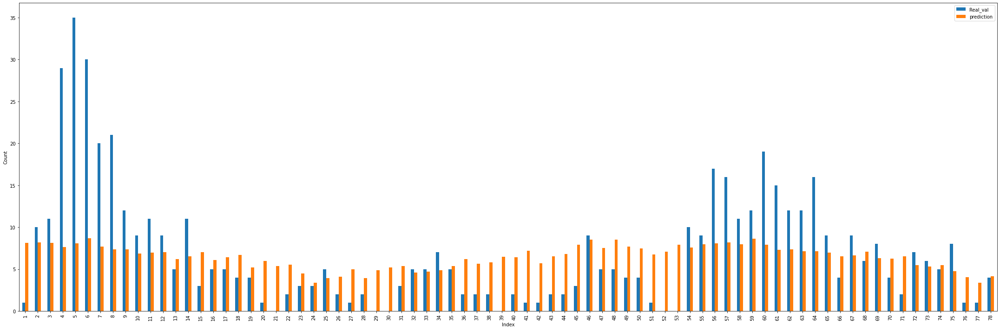

In [79]:
modeling_nonlinear(train_iq,validate_iq,SVR())

IQ
Best model = SVR



Best features = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 'weekofyear_46', 'weekofyear_47', 'weekofyear_48', 'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 'weekofyear_53', 'ndvi_avg']


best alpha in box cox = 0.2

# Model Selection Results

After thorough training and evaluation, the models that have emerged as optimal for our dataset are:
 - San Juan (SJ): The XGBRegressor stands out as the most effective model.
 - Iquitos (IQ): The SVR (Support Vector Regressor) yields the best performance.
 
## Next Steps:
 - Hyperparameter Tuning: Armed with the selected features, the next endeavor will be to fine-tune the hyperparameters of the models, ensuring that we extract the best possible performance.

# Hyperparameter Tuning

In [121]:
def CategoryPreprocess(df):
    #hard code cat cols
    
    df.week_start_date = pd.to_datetime(df.week_start_date)
    df['month'] = df.week_start_date.dt.month
    
    cat_cols = ['month','weekofyear']
    dftransform=pd.get_dummies(data=df, columns=cat_cols)
    
    return dftransform

In [122]:
def NumericalPreprocess(df,process):
    
    #hard code numerical cols
    numerical_cols = ['ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm']
    
    
    df[numerical_cols] = df[numerical_cols].interpolate(method='linear', limit_direction='both')
    df['ndvi_avg'] = (df['ndvi_ne'] + df['ndvi_nw'] + df['ndvi_se'] + df['ndvi_sw']) / 4
    
    if process == 'train':
        scaler = MinMaxScaler()
        scaler.fit(df[numerical_cols])
        df[numerical_cols] = scaler.transform(df[numerical_cols])
        
        if df.city.iloc[0] == 'sj':
            dump(scaler, open('model/scaler_sj.pkl', 'wb'))
        elif df.city.iloc[0] == 'iq':
            dump(scaler, open('model/scaler_iq.pkl', 'wb'))
    
    elif process == 'infer':
        
        if df.city.iloc[0] == 'sj':
            scaler = load(open('model/scaler_sj.pkl', 'rb'))
        
        elif df.city.iloc[0] == 'iq':
            scaler = load(open('model/scaler_iq.pkl', 'rb'))
        
        df[numerical_cols] = scaler.transform(df[numerical_cols])
    
  
    
    return df  

In [123]:
def preprocess(df,process):
    
    df.drop(columns = ['reanalysis_sat_precip_amt_mm'], inplace = True )
    dfcat = CategoryPreprocess(df)
    dftransform = NumericalPreprocess(dfcat,process)
    
    return dftransform

In [93]:
dftrain_label = pd.read_csv('data/dengue_labels_train.csv')
dftrain_feat = pd.read_csv('data/dengue_features_train.csv')
dftrain = dftrain_feat.merge(dftrain_label,how='inner',on=['city','year','weekofyear'])

dftrain_sj = dftrain[dftrain.city == 'sj']
dftrain_iq = dftrain[dftrain.city == 'iq']

dftrain_sj = dftrain_sj[~dftrain_sj.year.isin([1990,1991,1992,1993,1994])]
dftrain_iq = dftrain_iq[~dftrain_iq.year.isin([2000,2001])]

dftrain_sj_transformed = preprocess(dftrain_sj,'train')
dftrain_iq_transformed = preprocess(dftrain_iq,'train')

#dftrain_sj_transformed.total_cases = boxcox1p(dftrain_sj_transformed['total_cases'],0.6)
#dftrain_iq_transformed.total_cases = boxcox1p(dftrain_iq_transformed['total_cases'],0.2)

In [96]:
def ray_tune(train_x,model,parameter,imp_cols,alpha):
    
    train = train_x.copy()
    
    rfraytune = model
    parameter_raytune = parameter
    
    
    tune_search = TuneSearchCV(estimator = rfraytune,
                          param_distributions = parameter_raytune,
                          scoring = 'neg_mean_absolute_error',
                          n_trials = 100,
                          n_jobs = 8,
                          verbose = 2)
    
    results = tune_search.fit(train[imp_cols],train.total_cases)
    
    print(results.best_params_)
    
    
    return results

## SJ Tune

In [97]:
model = xgb.XGBRegressor()
parameter_sj = {'n_estimators': [25, 100],
               'tree_method': ['hist','exact'] ,
               'max_depth': [3, 6], 
               'learning_rate':[0.1,0.5],
                'gammma':[0,1,10],
                'eval_metric':['rmse','mae'],
                'objective':['reg:squarederror','reg:absoluteerror'],
               }
imp_cols_sj =  [ 'year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 
                'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
                'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
                'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
                'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
                'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 
                'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 
                'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 
                'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 
                'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 
                'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 
                'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 
                'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 
                'weekofyear_46', 'weekofyear_48', 'weekofyear_49', 'weekofyear_51', 'weekofyear_52', 'ndvi_avg']
ray_tune(dftrain_sj_transformed,model,parameter_sj,imp_cols_sj,0.6)

2023-10-24 21:42:14,808	INFO tune.py:657 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
2023-10-24 21:42:14,811	WARNING tune.py:982 -- Tune detects GPUs, but no trials are using GPUs. To enable trials to use GPUs, wrap `train_func` with `tune.with_resources(train_func, resources_per_trial={'gpu': 1})` which allows Tune to expose 1 GPU to each trial. For Ray AIR Trainers, you can specify GPU resources through `ScalingConfig(use_gpu=True)`. You can also override `Trainable.default_resource_request` if using the Trainable API.


(_Trainable pid=33808) C:\Users\stmia\anaconda3\lib\site-packages\xgboost\core.py:160: UserWarning: [21:42:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
(_Trainable pid=33808) Parameters: { "gammma" } are not used.
(_Trainable pid=33808) 
(_Trainable pid=33808)   warnings.warn(smsg, UserWarning)


Trial name,average_test_score,objective,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
_Trainable_1b1af_00000,-23.9359,-23.9359,-38.1622,-39.1437,-15.8119,-10.7412,-15.8207
_Trainable_1b1af_00001,-27.336,-27.336,-56.3141,-35.7634,-14.4787,-13.9042,-16.2195
_Trainable_1b1af_00002,-27.1259,-27.1259,-58.3787,-36.6676,-14.3041,-10.3293,-15.9499
_Trainable_1b1af_00003,-18.4801,-18.4801,-13.717,-39.6868,-12.4059,-9.30952,-17.2815
_Trainable_1b1af_00004,-18.4383,-18.4383,-12.6645,-40.1617,-12.4092,-9.58032,-17.3759
_Trainable_1b1af_00005,-23.9359,-23.9359,-38.1622,-39.1437,-15.8119,-10.7412,-15.8207
_Trainable_1b1af_00006,-18.4801,-18.4801,-13.717,-39.6868,-12.4059,-9.30952,-17.2815
_Trainable_1b1af_00007,-23.9359,-23.9359,-38.1622,-39.1437,-15.8119,-10.7412,-15.8207
_Trainable_1b1af_00008,-28.9379,-28.9379,-63.6346,-36.5103,-16.6887,-12.4601,-15.3956
_Trainable_1b1af_00009,-18.4383,-18.4383,-12.6645,-40.1617,-12.4092,-9.58032,-17.3759


(_Trainable pid=10844) C:\Users\stmia\anaconda3\lib\site-packages\xgboost\core.py:160: UserWarning: [21:42:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\learner.cc:742:  [repeated 216x across cluster]
(_Trainable pid=10844) Parameters: { "gammma" } are not used. [repeated 216x across cluster]
(_Trainable pid=10844)  [repeated 216x across cluster]
(_Trainable pid=10844)   warnings.warn(smsg, UserWarning) [repeated 216x across cluster]
(_Trainable pid=33808) C:\Users\stmia\anaconda3\lib\site-packages\xgboost\core.py:160: UserWarning: [21:42:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\learner.cc:742:  [repeated 231x across cluster]
(_Trainable pid=33808) Parameters: { "gammma" } are not used. [repeated 231x across cluster]
(_Trainable pid=33808)  [repeated 231x across cluster]
(_Trainable pid=33808)   warnings.warn(sm

{'n_estimators': 100, 'tree_method': 'exact', 'max_depth': 6, 'learning_rate': 0.1, 'gammma': 1, 'eval_metric': 'mae', 'objective': 'reg:absoluteerror'}


TuneSearchCV(cv=None, early_stopping=None, error_score=nan,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interactio...
                                  'max_depth': [3, 6],
                                  'n_estimators': [25, 100],
                                  'objective': ['reg:squarederror',
                                                'reg:absoluteerror'],
                                  'tree_method': ['hist', 'exact']},
     

In [99]:
model = SVR()
parameter_iq = {'gamma' : [0.1, 1, 10],
                 'C': [0.1, 1, 10],
                 'epsilon':[0.1,0.2]
               }
imp_cols_iq = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
               'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
               'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
               'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
               'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
               'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 
               'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3',
               'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9',
               'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15',
               'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21',
               'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 
               'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 
               'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 
               'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 
               'weekofyear_46', 'weekofyear_47', 'weekofyear_48', 'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 
               'weekofyear_52', 'ndvi_avg']
ray_tune(dftrain_iq_transformed,model,parameter_iq,imp_cols_iq,0.5)

2023-10-24 21:47:06,135	INFO tune.py:657 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949
2023-10-24 21:47:06,138	WARNING tune.py:982 -- Tune detects GPUs, but no trials are using GPUs. To enable trials to use GPUs, wrap `train_func` with `tune.with_resources(train_func, resources_per_trial={'gpu': 1})` which allows Tune to expose 1 GPU to each trial. For Ray AIR Trainers, you can specify GPU resources through `ScalingConfig(use_gpu=True)`. You can also override `Trainable.default_resource_request` if using the Trainable API.


Trial name,average_test_score,objective,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
_Trainable_c8bfe_00000,-6.16565,-6.16565,-6.40735,-6.49761,-4.48163,-7.63078,-5.81087
_Trainable_c8bfe_00001,-6.41221,-6.41221,-6.44769,-6.37106,-5.19525,-7.79475,-6.25229
_Trainable_c8bfe_00002,-6.22127,-6.22127,-6.4397,-6.31122,-4.59907,-7.65861,-6.09773
_Trainable_c8bfe_00003,-6.21759,-6.21759,-6.43827,-6.30856,-4.5884,-7.66,-6.09272
_Trainable_c8bfe_00004,-6.41221,-6.41221,-6.44769,-6.37106,-5.19525,-7.79475,-6.25229
_Trainable_c8bfe_00005,-6.42066,-6.42066,-6.44778,-6.38063,-5.21054,-7.802,-6.26233
_Trainable_c8bfe_00006,-6.42066,-6.42066,-6.44778,-6.38063,-5.21054,-7.802,-6.26233
_Trainable_c8bfe_00007,-6.22127,-6.22127,-6.4397,-6.31122,-4.59907,-7.65861,-6.09773
_Trainable_c8bfe_00008,-6.67898,-6.67898,-6.67611,-7.49787,-5.40269,-7.91537,-5.90284
_Trainable_c8bfe_00009,-6.27503,-6.27503,-6.4796,-6.30792,-4.68875,-7.74254,-6.15633


2023-10-24 21:47:13,633	WARNING tune.py:1122 -- Trial Runner checkpointing failed: Sync process failed: GetFileInfo() yielded path 'C:/Users/stmia/ray_results/_Trainable_2023-10-24_21-47-06/_Trainable_c8bfe_00000_0_C=1,epsilon=0.2000,gamma=1_2023-10-24_21-47-06', which is outside base dir 'C:\Users\stmia\ray_results\_Trainable_2023-10-24_21-47-06'
2023-10-24 21:47:13,643	INFO tune.py:1148 -- Total run time: 7.51 seconds (7.46 seconds for the tuning loop).


{'gamma': 1, 'C': 1, 'epsilon': 0.2}


TuneSearchCV(cv=None, early_stopping=None, error_score=nan,
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='scale', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             local_dir='~/ray_results', loggers=None, max_iters=1, mode='max',
             n_jobs=8, n_trials=18, name=None,
             param_distributions={'C': [0.1, 1, 10], 'epsilon': [0.1, 0.2],
                                  'gamma': [0.1, 1, 10]},
             pipeline_auto_early_stop=True, random_state=None, refit=True,
             return_train_score=False, scoring='neg_mean_absolute_error',
             search_kwargs=None, search_optimization='random', sk_n_jobs=1,
             stopper=None, time_budget_s=None, use_gpu=False, verbose=2)

# Model Selection

## SJ

- Model: XGBRegressor
- parameters: {'n_estimators': 25, 'tree_method': 'hist', 'max_depth': 6, 
  'learning_rate': 0.1, 'min_child_weight': 2, 'gammma': 1}
- Features: ['year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
                'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
                'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
                'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
                'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 
                'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 
                'weekofyear_5', 'weekofyear_6', 'weekofyear_8', 'weekofyear_9', 'weekofyear_11', 'weekofyear_12', 
                'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_19',
                'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 
                'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 
                'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 
                'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 'weekofyear_43', 
                'weekofyear_44', 'weekofyear_45', 'weekofyear_46', 'weekofyear_48', 'weekofyear_49', 'weekofyear_50', 
                'weekofyear_51', 'weekofyear_52', 'weekofyear_53', 'ndvi_avg']

## IQ

- Model: SVR
- parameters: {'gamma': 'auto', 'C': 1, 'epsilon': 0.2}
- Features: ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
               'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
               'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
               'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
               'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
               'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 
               'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3',
               'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9',
               'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13', 'weekofyear_14', 'weekofyear_15',
               'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 'weekofyear_19', 'weekofyear_20', 'weekofyear_21',
               'weekofyear_22', 'weekofyear_23', 'weekofyear_24', 'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 
               'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 
               'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 
               'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 
               'weekofyear_46', 'weekofyear_47', 'weekofyear_48', 'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 
               'weekofyear_52', 'ndvi_avg']

# Final Train

In [98]:
def train_sj():
    
    dftrain_label = pd.read_csv('data/dengue_labels_train.csv')
    dftrain_feat = pd.read_csv('data/dengue_features_train.csv')
    dftrain = dftrain_feat.merge(dftrain_label,how='inner',on=['city','year','weekofyear'])
    dftrain_sj = dftrain[dftrain.city == 'sj']
    
    dftrain_sj_transformed = preprocess(dftrain_sj,'train')
    dftrain_sj_transformed.total_cases = boxcox1p(dftrain_sj_transformed['total_cases'],0.6)
    
    
    imp_cols_sj =  [ 'year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 
                'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
                'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
                'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
                'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
                'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 
                'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 
                'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 
                'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 
                'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 
                'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 
                'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 
                'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 
                'weekofyear_46', 'weekofyear_48', 'weekofyear_49', 'weekofyear_51', 'weekofyear_52', 'ndvi_avg']

    
    model = xgb.XGBRegressor(n_estimators = 100, tree_method = 'exact', max_depth = 6, learning_rate = 0.1,
                             gammma = 1, eval_metric = 'mae', objective = 'reg:absoluteerror')
    
    model.fit(dftrain_sj_transformed[imp_cols_sj],dftrain_sj_transformed.total_cases)
    
    dump(model, open('model/model_sj.pkl', 'wb'))
    
    

In [100]:
def train_iq():
    
    dftrain_label = pd.read_csv('data/dengue_labels_train.csv')
    dftrain_feat = pd.read_csv('data/dengue_features_train.csv')
    dftrain = dftrain_feat.merge(dftrain_label,how='inner',on=['city','year','weekofyear'])
    dftrain_iq = dftrain[dftrain.city == 'iq']
    
    dftrain_iq_transformed = preprocess(dftrain_iq,'train')
    dftrain_iq_transformed.total_cases = boxcox1p(dftrain_iq_transformed['total_cases'],0.2)
    
    #dftrain_iq_transformed[dftrain_iq_transformed.year.isin([2000,2001])]
    
    imp_cols_iq = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 
               'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
               'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 
               'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 
               'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2',
               'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11',
               'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6',
               'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12',
               'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 
               'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24',
               'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 
               'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 
               'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 
               'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 'weekofyear_46', 'weekofyear_47', 'weekofyear_48', 
               'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 'ndvi_avg']

    
    model = SVR(gamma = 1, C = 1, epsilon = 0.2)
    
    model.fit(dftrain_iq_transformed[imp_cols_iq],dftrain_iq_transformed.total_cases)
    
    dump(model, open('model/model_iq.pkl', 'wb'))

In [101]:
train_sj() 

In [102]:
train_iq()

# Predictions

In [132]:
def infer_sj():
    dftest = pd.read_csv('data/dengue_features_test.csv')
    dftest_sj = dftest[dftest.city == 'sj']
    dftest_sj_transformed = preprocess(dftest_sj,'infer')
    
    imp_cols_sj =  [ 'year', 'ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 
                'precipitation_amt_mm', 'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 
                'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 
                'reanalysis_relative_humidity_percent', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 
                'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c', 
                'station_precip_mm', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 
                'month_8', 'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 
                'weekofyear_4', 'weekofyear_5', 'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 
                'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 
                'weekofyear_17', 'weekofyear_18', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 
                'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 
                'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_35', 'weekofyear_36', 'weekofyear_37', 
                'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_42', 'weekofyear_43', 'weekofyear_44', 
                'weekofyear_46', 'weekofyear_48', 'weekofyear_49', 'weekofyear_51', 'weekofyear_52', 'ndvi_avg']
    
    model = load(open('model/model_sj.pkl', 'rb'))
    
    predict = model.predict(dftest_sj_transformed[imp_cols_sj])
    
    prediction_sj = inv_boxcox1p(predict,0.6)
    
    dftest_sj['total_cases'] = prediction_sj
    dfans_sj = dftest_sj[['city','year','weekofyear','total_cases']]
    
    return dfans_sj

In [133]:
def infer_iq():
    
    dftest = pd.read_csv('data/dengue_features_test.csv')
    dftest_iq = dftest[dftest.city == 'iq']
    dftest_iq_transformed = preprocess(dftest_iq,'infer')
    
    print(dftest_iq_transformed.columns)
    
    imp_cols_iq = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k', 
               'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 
               'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 
               'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c', 
               'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2',
               'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11',
               'month_12', 'weekofyear_1', 'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5', 'weekofyear_6',
               'weekofyear_7', 'weekofyear_8', 'weekofyear_9', 'weekofyear_10', 'weekofyear_11', 'weekofyear_12',
               'weekofyear_13', 'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'weekofyear_17', 'weekofyear_18', 
               'weekofyear_19', 'weekofyear_20', 'weekofyear_21', 'weekofyear_22', 'weekofyear_23', 'weekofyear_24',
               'weekofyear_25', 'weekofyear_26', 'weekofyear_27', 'weekofyear_28', 'weekofyear_29', 'weekofyear_30', 
               'weekofyear_31', 'weekofyear_32', 'weekofyear_33', 'weekofyear_34', 'weekofyear_35', 'weekofyear_36', 
               'weekofyear_37', 'weekofyear_38', 'weekofyear_39', 'weekofyear_40', 'weekofyear_41', 'weekofyear_42', 
               'weekofyear_43', 'weekofyear_44', 'weekofyear_45', 'weekofyear_46', 'weekofyear_47', 'weekofyear_48', 
               'weekofyear_49', 'weekofyear_50', 'weekofyear_51', 'ndvi_avg']
    
    model = load(open('model/model_iq.pkl', 'rb'))
    
    predict = model.predict(dftest_iq_transformed[imp_cols_iq])
    
    prediction_iq = inv_boxcox1p(predict,0.2)
    
    dftest_iq['total_cases'] = prediction_iq
    dfans_iq = dftest_iq[['city','year','weekofyear','total_cases']]
    
    return dfans_iq

In [134]:
def infer():
    
    df_sj = infer_sj()
    df_iq = infer_iq()
    
    results_baseline = pd.concat([df_sj,df_iq])
    
    results_baseline.total_cases = round(results_baseline.total_cases).astype('int')
    results_baseline.to_csv('dengue_baseline.csv',index=False)

In [135]:
infer()

Index(['city', 'year', 'week_start_date', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month_1', 'month_2',
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8',
       'month_9', 'month_10', 'month_11', 'month_12', 'weekofyear_1',
       'weekofyear_2', 'weekofyear_3', 'weekofyear_4', 'weekofyear_5',
       'weekofyear_6', 'weekofyear_7', 'weekofyear_8', 'weekofyear_9',
       'weekofyear_10', 'weekofyear_11', 'weekofyear_12', 'weekofyear_13',
       'weekofyear_14', 'weekofyear_15', 'weekofyear_16', 'wee

In [136]:
!pip freeze > requirements.txt